In [6]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))
print(torch.cuda.current_device())

True
NVIDIA GeForce RTX 3090
0


In [2]:
print('Hello World!3')

Hello World!3


In [3]:
print('Hello, World!')

Hello, World!


In [5]:
! pip install split-folders[full]

Defaulting to user installation because normal site-packages is not writeable


In [4]:
! pip install torchvision

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 1.2 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.0 MB/s eta 0:00:0000:0100:17
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 MB 1.1 MB/s eta 0:00:0000:0100:04
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-non

In [5]:
! pip install transformers accelerate torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu117

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu117
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 1.2 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 1.2 MB/s eta 0:00:0000:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bnaug 1.1.2 requires bnlp-toolkit==3.3.2, but you have bnlp-toolkit 4.0.0 which is incompatible.
bnaug 1.1.2 requires transformers==4.24.0, but you have transformers 4.39.2 which is incompatible.


In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import splitfolders
import torch.nn.functional as F
import cv2
from PIL import Image
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [10]:
class ThresholdTransform(object):
  def __init__(self, thr_255):
    self.thr = thr_255 / 255.  # input threshold for [0..255] gray level, convert to [0..1]

  def __call__(self, x):
    return (x > self.thr).to(x.dtype)  # do not change the data type

In [11]:
dilation_kernel = np.ones((3, 3), dtype=np.uint8)
erosion_kernel = Image.fromarray(np.ones((3, 3), dtype=np.uint8))
class Dilation(object):
    def __init__(self, kernel):
        self.kernel = kernel
    
    def __call__(self, image):
        image = np.array(image)  # Convert PIL image to NumPy array
        image = image.astype(np.uint8)  # Convert to 8-bit unsigned integer
        dilated_image = cv2.dilate(image, self.kernel, iterations=1)
        return torch.from_numpy(dilated_image).float()

In [5]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((320,240)),
#         transforms.ColorJitter(brightness=.5, hue=.3),
        transforms.RandomApply(transforms=[transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.25),
        transforms.RandomPerspective(distortion_scale=0.6, p=0.25),
        transforms.RandomApply(transforms=[transforms.ColorJitter(brightness=.5, hue=.3),
                                           # transforms.RandomInvert(),
                                           transforms.RandomAffine(30,translate=(0.1,0.1),
                                                                   shear=(-15,15))], p=0.25),
        # transforms.Grayscale(num_output_channels=3),
#         transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(0.25),
#         transforms.RandomRotation(30),
        transforms.ToTensor(),
        # ThresholdTransform(thr_255=90),
        # Dilation(kernel=dilation_kernel),
#         cv2.dilate()
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((320,240)),
        # transforms.Grayscale(num_output_channels=3),
        # transforms.Resize(256),
#         transforms.CenterCrop(224),
        transforms.ToTensor(),
        # ThresholdTransform(thr_255=90),
        # Dilation(kernel=dilation_kernel),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
data_dir = "/home/cse/Rifat/HaSPeR/latest/data2"
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=8,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #SELECT GPU FROM HERE

In [6]:
device

device(type='cuda', index=0)

torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])


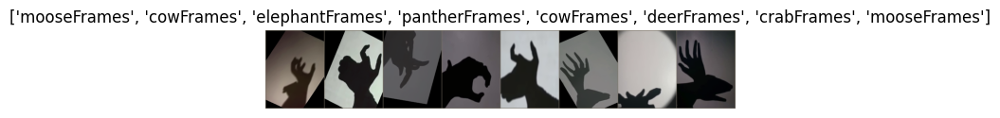

In [7]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.axis('off')
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
for i in inputs:
    print(i.shape)
# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [95]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [33]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [34]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, 11)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=5, gamma=0.1)

In [35]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.5103 Acc: 0.8566
val Loss: 1.0422 Acc: 0.6920

Epoch 1/24
----------
train Loss: 0.0991 Acc: 0.9763
val Loss: 0.8113 Acc: 0.7996

Epoch 2/24
----------
train Loss: 0.0504 Acc: 0.9887
val Loss: 0.6914 Acc: 0.8167

Epoch 3/24
----------
train Loss: 0.0360 Acc: 0.9935
val Loss: 0.8671 Acc: 0.8121

Epoch 4/24
----------
train Loss: 0.0294 Acc: 0.9954
val Loss: 0.5197 Acc: 0.8534

Epoch 5/24
----------
train Loss: 0.0180 Acc: 0.9965
val Loss: 0.5819 Acc: 0.8424

Epoch 6/24
----------
train Loss: 0.0201 Acc: 0.9963
val Loss: 0.5408 Acc: 0.8520

Epoch 7/24
----------
train Loss: 0.0173 Acc: 0.9954
val Loss: 0.5541 Acc: 0.8507

Epoch 8/24
----------
train Loss: 0.0120 Acc: 0.9983
val Loss: 0.6750 Acc: 0.8330

Epoch 9/24
----------
train Loss: 0.0183 Acc: 0.9954
val Loss: 0.5832 Acc: 0.8440

Epoch 10/24
----------
train Loss: 0.0147 Acc: 0.9972
val Loss: 0.6691 Acc: 0.8405

Epoch 11/24
----------
train Loss: 0.0154 Acc: 0.9972
val Loss: 0.5915 Acc: 0.8523

Ep

In [229]:
torch.cuda.empty_cache()

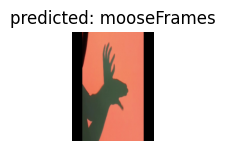

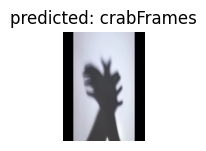

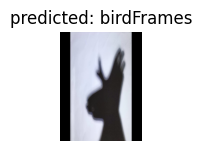

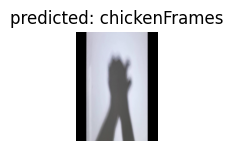

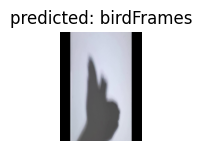

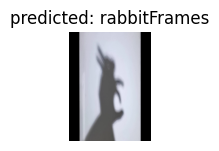

In [36]:
visualize_model(model_ft)

In [37]:
def train_model2(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [38]:
model_ft2 = models.vit_b_16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs2 = model_ft2.heads.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft2.fc = nn.Linear(num_ftrs2, 11)

model_ft2 = model_ft2.to(device)

criterion2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft2 = optim.SGD(model_ft2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler2 = lr_scheduler.StepLR(optimizer_ft2, step_size=5, gamma=0.1)

In [39]:
model_ft2 = train_model2(model_ft2, criterion2, optimizer_ft2, exp_lr_scheduler2, num_epochs=25)

Epoch 0/24
----------
train Loss: 2.0599 Acc: 0.3194
val Loss: 2.1546 Acc: 0.3080

Epoch 1/24
----------
train Loss: 1.2448 Acc: 0.5814
val Loss: 2.2376 Acc: 0.3722

Epoch 2/24
----------
train Loss: 0.9737 Acc: 0.6635
val Loss: 2.1971 Acc: 0.3420

Epoch 3/24
----------
train Loss: 0.7991 Acc: 0.7363
val Loss: 1.8894 Acc: 0.3958

Epoch 4/24
----------
train Loss: 0.7037 Acc: 0.7554
val Loss: 2.1103 Acc: 0.4691

Epoch 5/24
----------
train Loss: 0.4939 Acc: 0.8384
val Loss: 1.9111 Acc: 0.5050

Epoch 6/24
----------
train Loss: 0.4308 Acc: 0.8538
val Loss: 1.8844 Acc: 0.5186

Epoch 7/24
----------
train Loss: 0.3721 Acc: 0.8803
val Loss: 1.9048 Acc: 0.5082

Epoch 8/24
----------
train Loss: 0.3673 Acc: 0.8844
val Loss: 1.9045 Acc: 0.5170

Epoch 9/24
----------
train Loss: 0.3414 Acc: 0.8851
val Loss: 1.8920 Acc: 0.5432

Epoch 10/24
----------
train Loss: 0.3259 Acc: 0.8944
val Loss: 1.8919 Acc: 0.5454

Epoch 11/24
----------
train Loss: 0.3136 Acc: 0.9020
val Loss: 1.8833 Acc: 0.5405

Ep

In [40]:
def visualize_model2(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

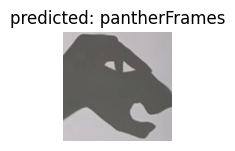

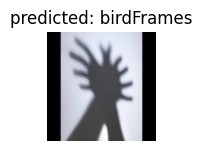

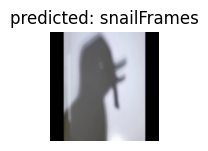

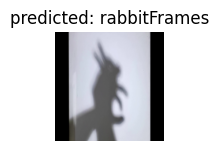

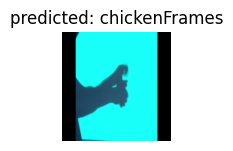

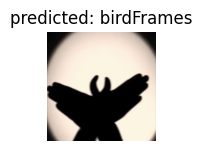

In [41]:
visualize_model2(model_ft2)

In [42]:
def train_model3(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [43]:
model_ft3 = models.googlenet(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs3 = model_ft3.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft3.fc = nn.Linear(num_ftrs3, 11)

model_ft3 = model_ft3.to(device)

criterion3 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft3 = optim.SGD(model_ft3.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler3 = lr_scheduler.StepLR(optimizer_ft3, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [44]:
model_ft3 = train_model3(model_ft3, criterion3, optimizer_ft3, exp_lr_scheduler3, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.9384 Acc: 0.7691
val Loss: 1.0520 Acc: 0.6489

Epoch 1/24
----------
train Loss: 0.1737 Acc: 0.9663
val Loss: 0.8570 Acc: 0.7332

Epoch 2/24
----------
train Loss: 0.0950 Acc: 0.9813
val Loss: 0.6571 Acc: 0.8100

Epoch 3/24
----------
train Loss: 0.0646 Acc: 0.9870
val Loss: 0.6849 Acc: 0.8108

Epoch 4/24
----------
train Loss: 0.0486 Acc: 0.9894
val Loss: 0.8347 Acc: 0.7918

Epoch 5/24
----------
train Loss: 0.0429 Acc: 0.9907
val Loss: 0.8151 Acc: 0.7980

Epoch 6/24
----------
train Loss: 0.0280 Acc: 0.9941
val Loss: 0.8601 Acc: 0.8044

Epoch 7/24
----------
train Loss: 0.0328 Acc: 0.9930
val Loss: 0.7987 Acc: 0.8049

Epoch 8/24
----------
train Loss: 0.0253 Acc: 0.9963
val Loss: 0.7945 Acc: 0.8089

Epoch 9/24
----------
train Loss: 0.0315 Acc: 0.9948
val Loss: 0.7599 Acc: 0.8103

Epoch 10/24
----------
train Loss: 0.0315 Acc: 0.9946
val Loss: 0.7585 Acc: 0.8079

Epoch 11/24
----------
train Loss: 0.0268 Acc: 0.9952
val Loss: 0.8302 Acc: 0.8044

Ep

In [45]:
def visualize_model3(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

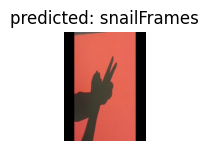

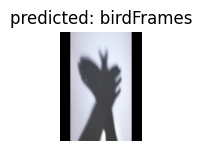

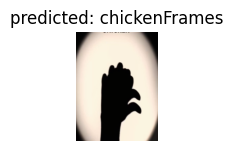

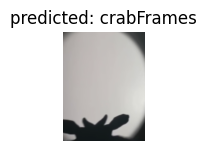

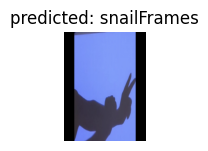

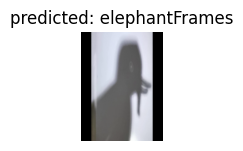

In [46]:
visualize_model3(model_ft3)

In [47]:
def train_model4(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [48]:
model_ft4 = models.maxvit_t(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs4 = model_ft4.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft4.fc = nn.Linear(num_ftrs4, 11)

model_ft4 = model_ft4.to(device)

criterion4 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft4 = optim.SGD(model_ft4.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler4 = lr_scheduler.StepLR(optimizer_ft4, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaxVit_T_Weights.IMAGENET1K_V1`. You can also use `weights=MaxVit_T_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [49]:
model_ft4 = train_model4(model_ft4, criterion4, optimizer_ft4, exp_lr_scheduler4, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.9587 Acc: 0.7575
val Loss: 1.0620 Acc: 0.6805

Epoch 1/24
----------
train Loss: 0.1182 Acc: 0.9707
val Loss: 1.2508 Acc: 0.7022

Epoch 2/24
----------
train Loss: 0.0724 Acc: 0.9800
val Loss: 1.0546 Acc: 0.7337

Epoch 3/24
----------
train Loss: 0.0411 Acc: 0.9878
val Loss: 0.6964 Acc: 0.8210

Epoch 4/24
----------
train Loss: 0.0388 Acc: 0.9902
val Loss: 0.5100 Acc: 0.8657

Epoch 5/24
----------
train Loss: 0.0247 Acc: 0.9933
val Loss: 0.7427 Acc: 0.8199

Epoch 6/24
----------
train Loss: 0.0235 Acc: 0.9930
val Loss: 0.7490 Acc: 0.8234

Epoch 7/24
----------
train Loss: 0.0202 Acc: 0.9950
val Loss: 0.7202 Acc: 0.8237

Epoch 8/24
----------
train Loss: 0.0211 Acc: 0.9939
val Loss: 0.6305 Acc: 0.8405

Epoch 9/24
----------
train Loss: 0.0184 Acc: 0.9950
val Loss: 0.6326 Acc: 0.8368

Epoch 10/24
----------
train Loss: 0.0201 Acc: 0.9954
val Loss: 0.5417 Acc: 0.8766

Epoch 11/24
----------
train Loss: 0.0171 Acc: 0.9961
val Loss: 0.7398 Acc: 0.8188

Ep

In [50]:
print(model_ft4.classifier[3])

Linear(in_features=512, out_features=512, bias=True)


In [51]:
print(model_ft2)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [52]:
def visualize_model4(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

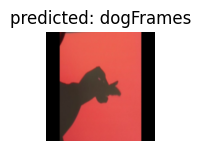

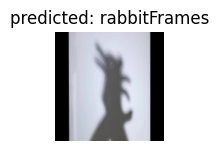

IndexError: list index out of range

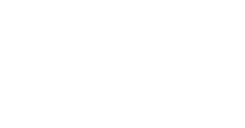

In [53]:
visualize_model4(model_ft4)

In [55]:
def train_model5(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [56]:
model_ft5 = models.vgg16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs5 = model_ft5.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft5.fc = nn.Linear(num_ftrs5, 11)

model_ft5 = model_ft5.to(device)

criterion5 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft5 = optim.SGD(model_ft5.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler5 = lr_scheduler.StepLR(optimizer_ft5, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [57]:
model_ft5 = train_model5(model_ft5, criterion5, optimizer_ft5, exp_lr_scheduler5, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.6571 Acc: 0.8247
val Loss: 1.6387 Acc: 0.6246

Epoch 1/24
----------
train Loss: 0.1231 Acc: 0.9629
val Loss: 1.0294 Acc: 0.7774

Epoch 2/24
----------
train Loss: 0.0634 Acc: 0.9807
val Loss: 1.4090 Acc: 0.7271

Epoch 3/24
----------
train Loss: 0.0510 Acc: 0.9850
val Loss: 0.9906 Acc: 0.8041

Epoch 4/24
----------
train Loss: 0.0374 Acc: 0.9907
val Loss: 1.1417 Acc: 0.7707

Epoch 5/24
----------
train Loss: 0.0209 Acc: 0.9944
val Loss: 0.9829 Acc: 0.8057

Epoch 6/24
----------
train Loss: 0.0118 Acc: 0.9972
val Loss: 0.9632 Acc: 0.8113

Epoch 7/24
----------
train Loss: 0.0095 Acc: 0.9970
val Loss: 0.9589 Acc: 0.8121

Epoch 8/24
----------
train Loss: 0.0140 Acc: 0.9954
val Loss: 0.9719 Acc: 0.8140

Epoch 9/24
----------
train Loss: 0.0058 Acc: 0.9985
val Loss: 1.0065 Acc: 0.8164

Epoch 10/24
----------
train Loss: 0.0077 Acc: 0.9983
val Loss: 1.0048 Acc: 0.8178

Epoch 11/24
----------
train Loss: 0.0123 Acc: 0.9954
val Loss: 1.0036 Acc: 0.8172

Ep

In [58]:
print(model_ft5)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [59]:
def visualize_model5(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

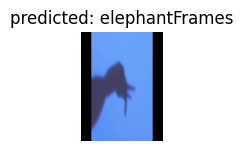

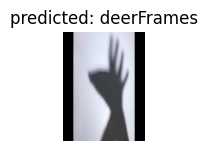

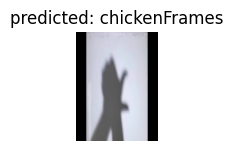

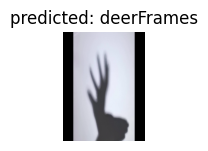

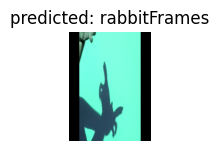

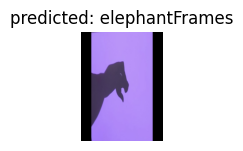

In [60]:
visualize_model5(model_ft5)

In [61]:
def train_model6(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [62]:
model_ft6 = models.swin_v2_b(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs6 = model_ft6.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft6.fc = nn.Linear(num_ftrs6, 11)

model_ft6 = model_ft6.to(device)

criterion6 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft6 = optim.SGD(model_ft6.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler6 = lr_scheduler.StepLR(optimizer_ft6, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Swin_V2_B_Weights.IMAGENET1K_V1`. You can also use `weights=Swin_V2_B_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [63]:
print(model_ft6)

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlockV2(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttentionV2(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
          (cpb_mlp): Sequential(
            (0): Linear(in_features=2, out_features=512, bias=True)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=512, out_features=4, bias=False)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(appro

In [64]:
model_ft6 = train_model6(model_ft6, criterion6, optimizer_ft6, exp_lr_scheduler6, num_epochs=25)

Epoch 0/24
----------
train Loss: 1.2498 Acc: 0.6361
val Loss: 1.1412 Acc: 0.6821

Epoch 1/24
----------
train Loss: 0.1560 Acc: 0.9507
val Loss: 0.9635 Acc: 0.7391

Epoch 2/24
----------
train Loss: 0.0766 Acc: 0.9765
val Loss: 0.9210 Acc: 0.7725

Epoch 3/24
----------
train Loss: 0.0486 Acc: 0.9846
val Loss: 0.9828 Acc: 0.7972

Epoch 4/24
----------
train Loss: 0.0325 Acc: 0.9883
val Loss: 0.8723 Acc: 0.8282

Epoch 5/24
----------
train Loss: 0.0212 Acc: 0.9924
val Loss: 0.8695 Acc: 0.8247

Epoch 6/24
----------
train Loss: 0.0151 Acc: 0.9963
val Loss: 0.8638 Acc: 0.8282

Epoch 7/24
----------
train Loss: 0.0126 Acc: 0.9961
val Loss: 0.8739 Acc: 0.8274

Epoch 8/24
----------
train Loss: 0.0179 Acc: 0.9948
val Loss: 0.8614 Acc: 0.8309

Epoch 9/24
----------
train Loss: 0.0131 Acc: 0.9957
val Loss: 0.8716 Acc: 0.8306

Epoch 10/24
----------
train Loss: 0.0154 Acc: 0.9957
val Loss: 0.8650 Acc: 0.8303

Epoch 11/24
----------
train Loss: 0.0112 Acc: 0.9963
val Loss: 0.8642 Acc: 0.8309

Ep

In [65]:
def visualize_model6(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

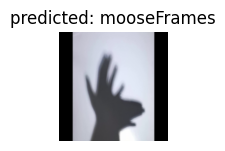

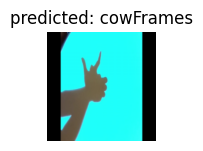

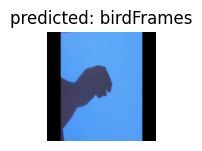

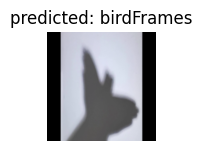

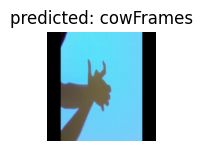

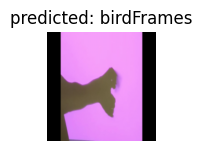

In [66]:
visualize_model6(model_ft6)

In [67]:
def train_model7(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [68]:
model_ft7 = models.convnext_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs7 = model_ft7.classifier[2].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft7.fc = nn.Linear(num_ftrs7, 11)

model_ft7 = model_ft7.to(device)

criterion7 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft7 = optim.SGD(model_ft7.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler7 = lr_scheduler.StepLR(optimizer_ft7, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Large_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [69]:
print(model_ft7)

ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((192,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
          (1): Permute()
          (2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=192, out_features=768, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=768, out_features=192, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
          (1): Permute()
          (2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
          (3): Linear(

In [70]:
model_ft7 = train_model7(model_ft7, criterion7, optimizer_ft7, exp_lr_scheduler7, num_epochs=25)

Epoch 0/24
----------
train Loss: 1.5936 Acc: 0.5103
val Loss: 1.3155 Acc: 0.5951

Epoch 1/24
----------
train Loss: 0.1372 Acc: 0.9672
val Loss: 1.1464 Acc: 0.6888

Epoch 2/24
----------
train Loss: 0.0627 Acc: 0.9846
val Loss: 0.9491 Acc: 0.7822

Epoch 3/24
----------
train Loss: 0.0386 Acc: 0.9920
val Loss: 0.7157 Acc: 0.8303

Epoch 4/24
----------
train Loss: 0.0316 Acc: 0.9920
val Loss: 0.7536 Acc: 0.8194

Epoch 5/24
----------
train Loss: 0.0151 Acc: 0.9974
val Loss: 0.7418 Acc: 0.8360

Epoch 6/24
----------
train Loss: 0.0140 Acc: 0.9978
val Loss: 0.7313 Acc: 0.8373

Epoch 7/24
----------
train Loss: 0.0140 Acc: 0.9967
val Loss: 0.7674 Acc: 0.8354

Epoch 8/24
----------
train Loss: 0.0132 Acc: 0.9967
val Loss: 0.7735 Acc: 0.8333

Epoch 9/24
----------
train Loss: 0.0118 Acc: 0.9978
val Loss: 0.7050 Acc: 0.8448

Epoch 10/24
----------
train Loss: 0.0111 Acc: 0.9980
val Loss: 0.7095 Acc: 0.8437

Epoch 11/24
----------
train Loss: 0.0108 Acc: 0.9983
val Loss: 0.7105 Acc: 0.8435

Ep

In [71]:
def visualize_model7(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

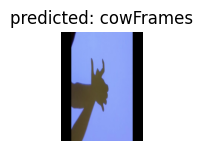

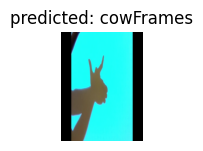

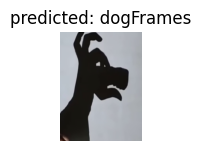

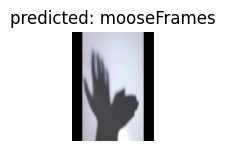

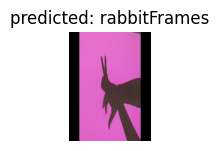

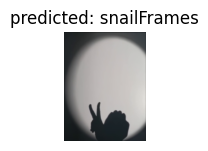

In [72]:
visualize_model7(model_ft7)

In [73]:
def train_model8(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(299,299), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
#                     outputs, aux_logits, __ = model(inputs)
                    outputs = model(inputs)
#                     print(outputs.logits)
#                     break
#                     print(len(outputs),outputs)
                    if len(outputs) == 2:
                        _, preds = torch.max(outputs[0], 1)
                        loss = criterion(outputs[0], labels)
                    else:
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
#                     loss1 = criterion(outputs[0], labels)
#                     loss2 = criterion(outputs[1], labels)
#                     loss = loss1 + 0.4*loss2

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [74]:
def visualize_model8(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(299,299), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            if len(outputs) == 2:
                _, preds = torch.max(outputs[0], 1)
            else:
                _, preds = torch.max(outputs, 1)
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [75]:
model_ft8 = models.inception_v3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs8 = model_ft8.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft8.fc = nn.Linear(num_ftrs8, 11)

model_ft8 = model_ft8.to(device)

criterion8 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft8 = optim.SGD(model_ft8.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler8 = lr_scheduler.StepLR(optimizer_ft8, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [76]:
model_ft8 = train_model8(model_ft8, criterion8, optimizer_ft8, exp_lr_scheduler8, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.6283 Acc: 0.8373
val Loss: 0.8019 Acc: 0.7843

Epoch 1/24
----------
train Loss: 0.1067 Acc: 0.9744
val Loss: 0.8535 Acc: 0.7897

Epoch 2/24
----------
train Loss: 0.0576 Acc: 0.9883
val Loss: 0.5777 Acc: 0.8630

Epoch 3/24
----------
train Loss: 0.0514 Acc: 0.9891
val Loss: 0.6458 Acc: 0.8373

Epoch 4/24
----------
train Loss: 0.0312 Acc: 0.9941
val Loss: 0.6962 Acc: 0.8472

Epoch 5/24
----------
train Loss: 0.0181 Acc: 0.9957
val Loss: 0.7630 Acc: 0.8469

Epoch 6/24
----------
train Loss: 0.0224 Acc: 0.9946
val Loss: 0.7125 Acc: 0.8630

Epoch 7/24
----------
train Loss: 0.0188 Acc: 0.9965
val Loss: 0.7769 Acc: 0.8571

Epoch 8/24
----------
train Loss: 0.0162 Acc: 0.9972
val Loss: 0.6889 Acc: 0.8609

Epoch 9/24
----------
train Loss: 0.0141 Acc: 0.9974
val Loss: 0.6947 Acc: 0.8646

Epoch 10/24
----------
train Loss: 0.0161 Acc: 0.9972
val Loss: 0.7046 Acc: 0.8622

Epoch 11/24
----------
train Loss: 0.0140 Acc: 0.9978
val Loss: 0.6291 Acc: 0.8705

Ep

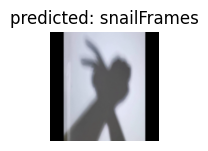

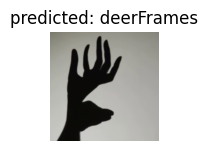

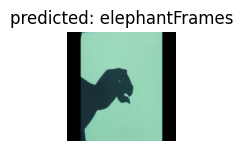

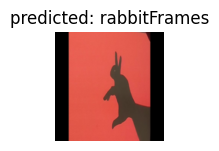

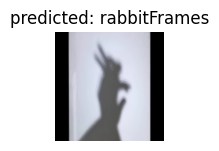

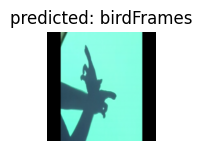

In [77]:
visualize_model8(model_ft8)

In [78]:
def train_model9(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [79]:
def visualize_model9(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [80]:
model_ft9 = models.mobilenet_v3_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs9 = model_ft9.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft9.fc = nn.Linear(num_ftrs9, 11)

model_ft9 = model_ft9.to(device)

criterion9 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft9 = optim.SGD(model_ft9.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler9 = lr_scheduler.StepLR(optimizer_ft9, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [81]:
print(model_ft9)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [82]:
model_ft9 = train_model9(model_ft9, criterion9, optimizer_ft9, exp_lr_scheduler9, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.7631 Acc: 0.8332
val Loss: 1.1512 Acc: 0.6639

Epoch 1/24
----------
train Loss: 0.1083 Acc: 0.9689
val Loss: 0.8710 Acc: 0.7822

Epoch 2/24
----------
train Loss: 0.0664 Acc: 0.9815
val Loss: 0.8633 Acc: 0.8194

Epoch 3/24
----------
train Loss: 0.0481 Acc: 0.9859
val Loss: 0.8224 Acc: 0.8325

Epoch 4/24
----------
train Loss: 0.0360 Acc: 0.9904
val Loss: 1.0391 Acc: 0.8164

Epoch 5/24
----------
train Loss: 0.0320 Acc: 0.9894
val Loss: 0.8959 Acc: 0.8239

Epoch 6/24
----------
train Loss: 0.0245 Acc: 0.9930
val Loss: 0.8871 Acc: 0.8287

Epoch 7/24
----------
train Loss: 0.0233 Acc: 0.9924
val Loss: 0.8859 Acc: 0.8354

Epoch 8/24
----------
train Loss: 0.0222 Acc: 0.9935
val Loss: 0.8735 Acc: 0.8352

Epoch 9/24
----------
train Loss: 0.0204 Acc: 0.9937
val Loss: 0.8771 Acc: 0.8336

Epoch 10/24
----------
train Loss: 0.0204 Acc: 0.9944
val Loss: 0.8773 Acc: 0.8344

Epoch 11/24
----------
train Loss: 0.0225 Acc: 0.9939
val Loss: 0.9054 Acc: 0.8322

Ep

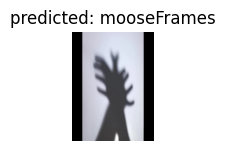

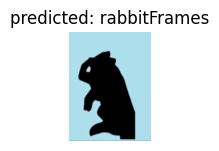

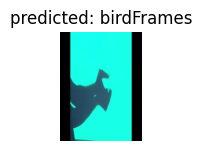

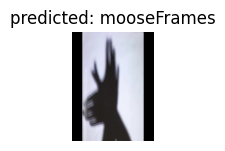

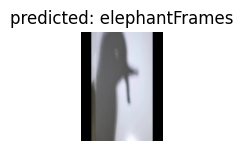

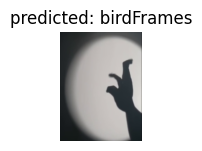

In [83]:
visualize_model9(model_ft9)

In [84]:
def train_model10(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [85]:
def visualize_model10(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [86]:
model_ft10 = models.mobilenet_v3_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs10 = model_ft10.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft10.fc = nn.Linear(num_ftrs10, 11)

model_ft10 = model_ft10.to(device)

criterion10 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft10 = optim.SGD(model_ft10.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler10 = lr_scheduler.StepLR(optimizer_ft10, step_size=5, gamma=0.1)

In [87]:
print(model_ft10)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [88]:
model_ft10 = train_model10(model_ft10, criterion10, optimizer_ft10, exp_lr_scheduler10, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.7833 Acc: 0.8349
val Loss: 1.0335 Acc: 0.7073

Epoch 1/24
----------
train Loss: 0.1221 Acc: 0.9670
val Loss: 1.0671 Acc: 0.7699

Epoch 2/24
----------
train Loss: 0.0559 Acc: 0.9846
val Loss: 0.7558 Acc: 0.8041

Epoch 3/24
----------
train Loss: 0.0540 Acc: 0.9833
val Loss: 0.9490 Acc: 0.8084

Epoch 4/24
----------
train Loss: 0.0358 Acc: 0.9891
val Loss: 1.0229 Acc: 0.8105

Epoch 5/24
----------
train Loss: 0.0283 Acc: 0.9911
val Loss: 1.0195 Acc: 0.8229

Epoch 6/24
----------
train Loss: 0.0192 Acc: 0.9944
val Loss: 0.9544 Acc: 0.8328

Epoch 7/24
----------
train Loss: 0.0234 Acc: 0.9928
val Loss: 0.9088 Acc: 0.8440

Epoch 8/24
----------
train Loss: 0.0244 Acc: 0.9935
val Loss: 0.8621 Acc: 0.8461

Epoch 9/24
----------
train Loss: 0.0208 Acc: 0.9937
val Loss: 0.8980 Acc: 0.8448

Epoch 10/24
----------
train Loss: 0.0277 Acc: 0.9933
val Loss: 0.9155 Acc: 0.8400

Epoch 11/24
----------
train Loss: 0.0179 Acc: 0.9959
val Loss: 0.9052 Acc: 0.8429

Ep

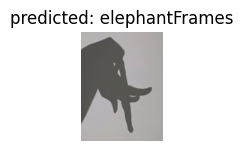

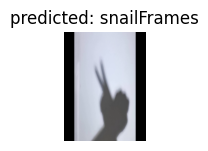

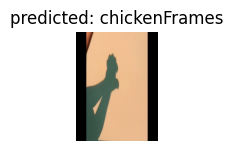

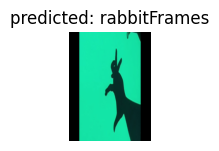

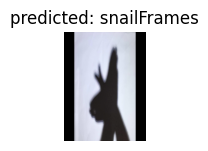

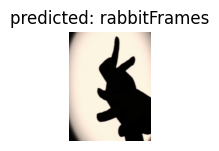

In [89]:
visualize_model9(model_ft10)

In [90]:
def train_model11(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [91]:
def visualize_model11(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [92]:
model_ft11 = models.mnasnet1_3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs11 = model_ft11.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft11.fc = nn.Linear(num_ftrs11, 11)

model_ft11 = model_ft11.to(device)

criterion11 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft11 = optim.SGD(model_ft11.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler11 = lr_scheduler.StepLR(optimizer_ft11, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MNASNet1_3_Weights.IMAGENET1K_V1`. You can also use `weights=MNASNet1_3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [93]:
print(model_ft11)

MNASNet(
  (layers): Sequential(
    (0): Conv2d(3, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(40, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
    (4): BatchNorm2d(40, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(40, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (7): BatchNorm2d(24, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (8): Sequential(
      (0): _InvertedResidual(
        (layers): Sequential(
          (0): Conv2d(24, 72, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(72, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(72, 

In [94]:
model_ft11 = train_model11(model_ft11, criterion11, optimizer_ft11, exp_lr_scheduler11, num_epochs=25)

Epoch 0/24
----------
train Loss: 1.0887 Acc: 0.7806
val Loss: 3.9609 Acc: 0.2815

Epoch 1/24
----------
train Loss: 0.1378 Acc: 0.9642
val Loss: 2.7851 Acc: 0.4244

Epoch 2/24
----------
train Loss: 0.0896 Acc: 0.9733
val Loss: 2.1843 Acc: 0.5277

Epoch 3/24
----------
train Loss: 0.0569 Acc: 0.9844
val Loss: 1.4622 Acc: 0.6535

Epoch 4/24
----------
train Loss: 0.0498 Acc: 0.9887
val Loss: 2.1301 Acc: 0.5502

Epoch 5/24
----------
train Loss: 0.0326 Acc: 0.9928
val Loss: 1.5906 Acc: 0.6238

Epoch 6/24
----------
train Loss: 0.0309 Acc: 0.9917
val Loss: 1.1394 Acc: 0.6998

Epoch 7/24
----------
train Loss: 0.0349 Acc: 0.9913
val Loss: 1.0229 Acc: 0.7434

Epoch 8/24
----------
train Loss: 0.0268 Acc: 0.9928
val Loss: 1.0389 Acc: 0.7672

Epoch 9/24
----------
train Loss: 0.0278 Acc: 0.9933
val Loss: 1.0455 Acc: 0.7832

Epoch 10/24
----------
train Loss: 0.0258 Acc: 0.9935
val Loss: 1.0148 Acc: 0.7905

Epoch 11/24
----------
train Loss: 0.0310 Acc: 0.9928
val Loss: 0.9957 Acc: 0.7998

Ep

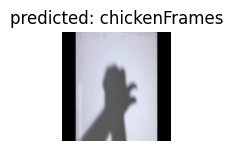

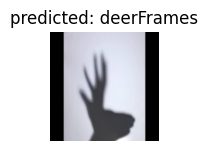

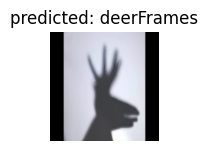

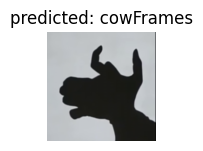

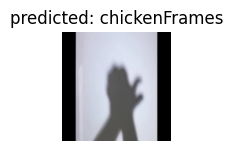

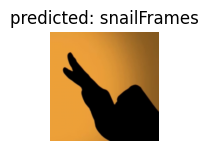

In [95]:
visualize_model11(model_ft11)

In [96]:
def train_model12(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [97]:
def visualize_model12(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [98]:
model_ft12 = models.densenet201(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs12 = model_ft12.classifier.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft12.fc = nn.Linear(num_ftrs12, 11)

model_ft12 = model_ft12.to(device)

criterion12 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft12 = optim.SGD(model_ft12.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler12 = lr_scheduler.StepLR(optimizer_ft12, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [99]:
print(model_ft12)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [100]:
model_ft12 = train_model12(model_ft12, criterion12, optimizer_ft12, exp_lr_scheduler12, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.4573 Acc: 0.9007
val Loss: 1.0544 Acc: 0.7680

Epoch 1/24
----------
train Loss: 0.0489 Acc: 0.9872
val Loss: 0.7791 Acc: 0.8336

Epoch 2/24
----------
train Loss: 0.0335 Acc: 0.9909
val Loss: 0.9582 Acc: 0.8052

Epoch 3/24
----------
train Loss: 0.0238 Acc: 0.9928
val Loss: 0.7434 Acc: 0.8475

Epoch 4/24
----------
train Loss: 0.0201 Acc: 0.9954
val Loss: 0.8269 Acc: 0.8394

Epoch 5/24
----------
train Loss: 0.0122 Acc: 0.9976
val Loss: 0.7840 Acc: 0.8453

Epoch 6/24
----------
train Loss: 0.0093 Acc: 0.9976
val Loss: 0.8104 Acc: 0.8427

Epoch 7/24
----------
train Loss: 0.0075 Acc: 0.9987
val Loss: 0.8244 Acc: 0.8419

Epoch 8/24
----------
train Loss: 0.0108 Acc: 0.9967
val Loss: 0.7269 Acc: 0.8654

Epoch 9/24
----------
train Loss: 0.0102 Acc: 0.9972
val Loss: 0.6857 Acc: 0.8777

Epoch 10/24
----------
train Loss: 0.0064 Acc: 0.9987
val Loss: 0.7546 Acc: 0.8635

Epoch 11/24
----------
train Loss: 0.0111 Acc: 0.9974
val Loss: 0.7547 Acc: 0.8600

Ep

In [101]:
def train_model13(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [102]:
def visualize_model13(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [103]:
model_ft13 = models.regnet_x_32gf(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrs13 = model_ft13.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft13.fc = nn.Linear(num_ftrs13, 11)

model_ft13 = model_ft13.to(device)

criterion13 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft13 = optim.SGD(model_ft13.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler13 = lr_scheduler.StepLR(optimizer_ft13, step_size=5, gamma=0.1)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RegNet_X_32GF_Weights.IMAGENET1K_V1`. You can also use `weights=RegNet_X_32GF_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [104]:
print(model_ft13)

RegNet(
  (stem): SimpleStemIN(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (trunk_output): Sequential(
    (block1): AnyStage(
      (block1-0): ResBottleneckBlock(
        (proj): Conv2dNormActivation(
          (0): Conv2d(32, 336, kernel_size=(1, 1), stride=(2, 2), bias=False)
          (1): BatchNorm2d(336, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (f): BottleneckTransform(
          (a): Conv2dNormActivation(
            (0): Conv2d(32, 336, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): BatchNorm2d(336, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
          (b): Conv2dNormActivation(
            (0): Conv2d(336, 336, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=2, bias=False)
      

In [105]:
model_ft13 = train_model13(model_ft13, criterion13, optimizer_ft13, exp_lr_scheduler13, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.5918 Acc: 0.8392
val Loss: 0.6511 Acc: 0.8044

Epoch 1/24
----------
train Loss: 0.0638 Acc: 0.9850
val Loss: 0.7747 Acc: 0.7886

Epoch 2/24
----------
train Loss: 0.0344 Acc: 0.9930
val Loss: 0.7491 Acc: 0.8111

Epoch 3/24
----------
train Loss: 0.0195 Acc: 0.9957
val Loss: 0.8937 Acc: 0.8108

Epoch 4/24
----------
train Loss: 0.0170 Acc: 0.9967
val Loss: 0.9077 Acc: 0.8140

Epoch 5/24
----------
train Loss: 0.0137 Acc: 0.9970
val Loss: 0.7910 Acc: 0.8220

Epoch 6/24
----------
train Loss: 0.0090 Acc: 0.9980
val Loss: 0.7428 Acc: 0.8314

Epoch 7/24
----------
train Loss: 0.0082 Acc: 0.9980
val Loss: 0.7210 Acc: 0.8373

Epoch 8/24
----------
train Loss: 0.0082 Acc: 0.9985
val Loss: 0.7514 Acc: 0.8394

Epoch 9/24
----------
train Loss: 0.0067 Acc: 0.9987
val Loss: 0.7410 Acc: 0.8424

Epoch 10/24
----------
train Loss: 0.0060 Acc: 0.9989
val Loss: 0.8106 Acc: 0.8320

Epoch 11/24
----------
train Loss: 0.0050 Acc: 0.9998
val Loss: 0.7956 Acc: 0.8328

Ep

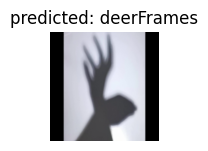

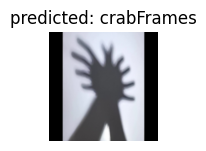

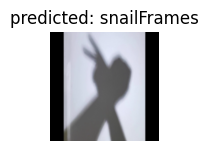

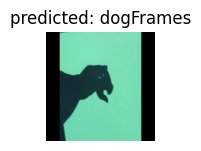

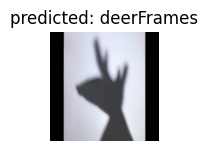

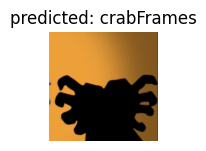

In [106]:
visualize_model11(model_ft13)

In [108]:
def train_model14(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [109]:
def visualize_model14(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [110]:
model_ft14 = models.resnet152(pretrained=True)
num_ftrs14 = model_ft14.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft14.fc = nn.Linear(num_ftrs, 11)

model_ft14 = model_ft14.to(device)

criterion14 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft14 = optim.SGD(model_ft14.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler14 = lr_scheduler.StepLR(optimizer_ft14, step_size=5, gamma=0.1)

In [111]:
model_ft14 = train_model14(model_ft14, criterion14, optimizer_ft14, exp_lr_scheduler14, num_epochs=25)

In [112]:
visualize_model14(model_ft14)

In [1]:
print('Hello, World!')

Hello, World!


In [42]:
def train_modelMaxViT(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [43]:
model_ftMaxViT = models.maxvit_t(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMaxViT = model_ftMaxViT.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsMaxViT, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftMaxViT.fc = nn.Linear(num_ftrsMaxViT, 11)
# model_ftMaxViT.fc = classifier_block

model_ftMaxViT = model_ftMaxViT.to(device)

criterionMaxViT = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMaxViT = optim.SGD(model_ftMaxViT.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMaxViT = lr_scheduler.StepLR(optimizer_ftMaxViT, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaxVit_T_Weights.IMAGENET1K_V1`. You can also use `weights=MaxVit_T_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/cse/.local/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Downloading: "https://download.pytorch.org/models/maxvit_t-bc5ab103.pth" to /home/cse/.cache/torch/hub/checkpoints/maxvit_t-bc5ab103.pth
100%|██████████| 119M/119M [01:43<00:00, 1.20MB/s] 


In [7]:
print(device)

cuda:1


In [44]:
model_ftMaxViT = train_modelMaxViT(model_ftMaxViT, criterionMaxViT, optimizer_ftMaxViT, exp_lr_schedulerMaxViT, num_epochs=50)

Epoch 1/49
----------


train Loss: 1.0144, top-2 Acc 0.8384, top-3 Acc 0.8757, Acc: 0.7434
val Loss: 1.2118, top-2 Acc 0.7907, top-3 Acc 0.8906, Acc: 0.6556
Time taken for epoch: 0m 56s
Estimated Time Remaining: 46m 7s
Epoch 2/49
----------
train Loss: 0.1297, top-2 Acc 0.9867, top-3 Acc 0.9922, Acc: 0.9650
val Loss: 0.9734, top-2 Acc 0.8571, top-3 Acc 0.9251, Acc: 0.7244
Time taken for epoch: 0m 56s
Estimated Time Remaining: 44m 60s
Epoch 3/49
----------
train Loss: 0.0736, top-2 Acc 0.9933, top-3 Acc 0.9976, Acc: 0.9804
val Loss: 0.8288, top-2 Acc 0.8673, top-3 Acc 0.9160, Acc: 0.7961
Time taken for epoch: 0m 56s
Estimated Time Remaining: 44m 15s
Epoch 4/49
----------
train Loss: 0.0609, top-2 Acc 0.9952, top-3 Acc 0.9985, Acc: 0.9831
val Loss: 0.7311, top-2 Acc 0.8911, top-3 Acc 0.9312, Acc: 0.8127
Time taken for epoch: 0m 57s
Estimated Time Remaining: 43m 27s
Epoch 5/49
----------
train Loss: 0.0413, top-2 Acc 0.9985, top-3 Acc 0.9996, Acc: 0.9896
val Loss: 0.7475, top-2 Acc 0.8756, top-3 Acc 0.9371, Acc

In [45]:
torch.save(model_ftMaxViT.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MaxViT.pt')

In [46]:
model_ftMaxViT = models.maxvit_t(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMaxViT = model_ftMaxViT.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMaxViT, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftMaxViT.fc = nn.Linear(num_ftrsMaxViT, 11)
model_ftMaxViT.fc = classifier_block

model_ftMaxViT = model_ftMaxViT.to(device)

criterionMaxViT = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMaxViT = optim.SGD(model_ftMaxViT.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMaxViT = lr_scheduler.StepLR(optimizer_ftMaxViT, step_size=5, gamma=0.1)

In [47]:
model_ftMaxViT = train_modelMaxViT(model_ftMaxViT, criterionMaxViT, optimizer_ftMaxViT, exp_lr_schedulerMaxViT, num_epochs=50)

Epoch 1/49
----------


train Loss: 0.8659, top-2 Acc 0.8653, top-3 Acc 0.8966, Acc: 0.7954
val Loss: 1.1158, top-2 Acc 0.8194, top-3 Acc 0.8906, Acc: 0.6682
Time taken for epoch: 0m 57s
Estimated Time Remaining: 46m 31s
Epoch 2/49
----------
train Loss: 0.1247, top-2 Acc 0.9883, top-3 Acc 0.9948, Acc: 0.9672
val Loss: 1.1428, top-2 Acc 0.8108, top-3 Acc 0.8804, Acc: 0.6912
Time taken for epoch: 0m 56s
Estimated Time Remaining: 45m 12s
Epoch 3/49
----------
train Loss: 0.0722, top-2 Acc 0.9937, top-3 Acc 0.9963, Acc: 0.9815
val Loss: 1.0403, top-2 Acc 0.8574, top-3 Acc 0.9039, Acc: 0.7388
Time taken for epoch: 0m 57s
Estimated Time Remaining: 44m 22s
Epoch 4/49
----------
train Loss: 0.0469, top-2 Acc 0.9972, top-3 Acc 0.9987, Acc: 0.9865
val Loss: 0.7605, top-2 Acc 0.8852, top-3 Acc 0.9387, Acc: 0.7915
Time taken for epoch: 0m 56s
Estimated Time Remaining: 43m 15s
Epoch 5/49
----------
train Loss: 0.0398, top-2 Acc 0.9978, top-3 Acc 0.9987, Acc: 0.9885
val Loss: 0.7364, top-2 Acc 0.9021, top-3 Acc 0.9377, Ac

In [48]:
torch.save(model_ftMaxViT.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MaxViT_Aug_CB.pt')

In [ ]:
model = models.maxvit_t(pretrained=True)
loaded_model = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_MaxViT_1.pt')
# print(loaded_model.keys())
model.load_state_dict(loaded_model, strict=False)
model.eval().to(device)

In [27]:
# import cv2
# test_image = cv2.imread('/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG')
# imshow(torch.tensor(test_image))
def visualize_modelMaxViT(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('ground truth: {}, predicted: {}'.format(class_names[labels[j]], class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

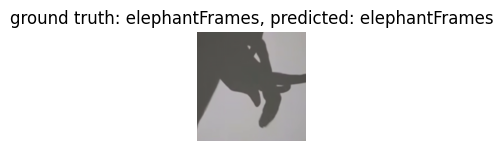

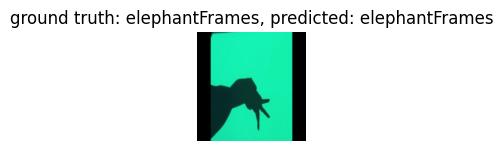

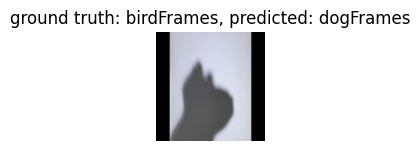

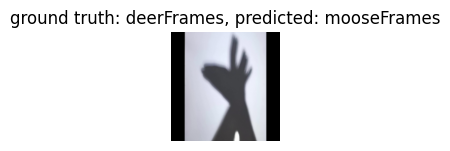

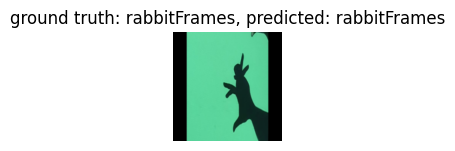

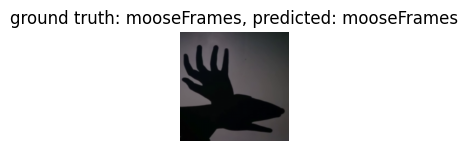

In [29]:
visualize_modelMaxViT(model)

In [35]:
def train_modelDenseNet201(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [36]:
model_ftDenseNet201 = models.densenet201(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsDenseNet201 = model_ftDenseNet201.classifier.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsDenseNet201, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftDenseNet201.fc = nn.Linear(num_ftrsDenseNet201, 11)

model_ftDenseNet201 = model_ftDenseNet201.to(device)

criterionDenseNet201 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftDenseNet201 = optim.SGD(model_ftDenseNet201.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerDenseNet201 = lr_scheduler.StepLR(optimizer_ftDenseNet201, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [37]:
model_ftDenseNet201 = train_modelDenseNet201(model_ftDenseNet201, criterionDenseNet201, optimizer_ftDenseNet201, exp_lr_schedulerDenseNet201, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.4153, top-2 Acc 0.9461, top-3 Acc 0.9587, Acc: 0.9101
val Loss: 0.8345, top-2 Acc 0.8732, top-3 Acc 0.9069, Acc: 0.8202
Time taken for epoch: 0m 50s
Estimated Time Remaining: 41m 13s
Epoch 2/50
----------
train Loss: 0.0777, top-2 Acc 0.9926, top-3 Acc 0.9961, Acc: 0.9776
val Loss: 0.8796, top-2 Acc 0.8777, top-3 Acc 0.9069, Acc: 0.8084
Time taken for epoch: 0m 49s
Estimated Time Remaining: 39m 30s
Epoch 3/50
----------
train Loss: 0.0501, top-2 Acc 0.9952, top-3 Acc 0.9980, Acc: 0.9872
val Loss: 0.8216, top-2 Acc 0.8964, top-3 Acc 0.9307, Acc: 0.8298
Time taken for epoch: 0m 49s
Estimated Time Remaining: 38m 44s
Epoch 4/50
----------
train Loss: 0.0325, top-2 Acc 0.9985, top-3 Acc 0.9989, Acc: 0.9935
val Loss: 1.2049, top-2 Acc 0.8641, top-3 Acc 0.9221, Acc: 0.7675
Time taken for epoch: 0m 50s
Estimated Time Remaining: 38m 11s
Epoch 5/50
----------
train Loss: 0.0284, top-2 Acc 0.9970, top-3 Acc 0.9985, Acc: 0.9922
val Loss: 0.9526, top-2 Acc 0.8804, top-3 Acc 0.9101, Ac

In [38]:
torch.save(model_ftDenseNet201.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_DenseNet201.pt')

In [39]:
model_ftDenseNet201 = models.densenet201(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsDenseNet201 = model_ftDenseNet201.classifier.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsDenseNet201, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftDenseNet201.fc = nn.Linear(num_ftrsDenseNet201, 11)
model_ftDenseNet201.fc = classifier_block

model_ftDenseNet201 = model_ftDenseNet201.to(device)

criterionDenseNet201 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftDenseNet201 = optim.SGD(model_ftDenseNet201.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerDenseNet201 = lr_scheduler.StepLR(optimizer_ftDenseNet201, step_size=5, gamma=0.1)

In [40]:
model_ftDenseNet201 = train_modelDenseNet201(model_ftDenseNet201, criterionDenseNet201, optimizer_ftDenseNet201, exp_lr_schedulerDenseNet201, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.4631, top-2 Acc 0.9390, top-3 Acc 0.9520, Acc: 0.8996
val Loss: 0.8125, top-2 Acc 0.8756, top-3 Acc 0.9114, Acc: 0.7929
Time taken for epoch: 0m 50s
Estimated Time Remaining: 40m 58s
Epoch 2/50
----------
train Loss: 0.0789, top-2 Acc 0.9930, top-3 Acc 0.9965, Acc: 0.9765
val Loss: 1.0925, top-2 Acc 0.8341, top-3 Acc 0.9096, Acc: 0.7412
Time taken for epoch: 0m 50s
Estimated Time Remaining: 39m 51s
Epoch 3/50
----------
train Loss: 0.0448, top-2 Acc 0.9970, top-3 Acc 0.9985, Acc: 0.9883
val Loss: 0.6612, top-2 Acc 0.8946, top-3 Acc 0.9433, Acc: 0.8534
Time taken for epoch: 0m 50s
Estimated Time Remaining: 39m 0s
Epoch 4/50
----------
train Loss: 0.0250, top-2 Acc 0.9983, top-3 Acc 0.9996, Acc: 0.9935
val Loss: 0.6199, top-2 Acc 0.9141, top-3 Acc 0.9355, Acc: 0.8625
Time taken for epoch: 0m 50s
Estimated Time Remaining: 38m 14s
Epoch 5/50
----------
train Loss: 0.0189, top-2 Acc 0.9985, top-3 Acc 0.9993, Acc: 0.9950
val Loss: 0.6489, top-2 Acc 0.9170,

In [41]:
torch.save(model_ftDenseNet201.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_DenseNet201_Aug_CB.pt')

In [34]:
model1 = models.densenet201(pretrained=True)
loaded_model1 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_DenseNet201_1.pt')
# print(loaded_model.keys())
model1.load_state_dict(loaded_model1, strict=False)
model1.eval().to(device)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [14]:
def train_modelResNet152(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [15]:
model_ftResNet152 = models.resnet152(pretrained=True)
num_ftrsResNet152 = model_ftResNet152.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNet152, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNet152.fc = nn.Linear(num_ftrsResNet152, 11)

model_ftResNet152 = model_ftResNet152.to(device)

criterionResNet152 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet152 = optim.SGD(model_ftResNet152.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet152 = lr_scheduler.StepLR(optimizer_ftResNet152, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /home/cse/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth
100%|██████████| 230M/230M [03:21<00:00, 1.20MB/s] 


In [16]:
model_ftResNet152 = train_modelResNet152(model_ftResNet152, criterionResNet152, optimizer_ftResNet152, exp_lr_schedulerResNet152, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.4528, top-2 Acc 0.9155, top-3 Acc 0.9394, Acc: 0.8773
val Loss: 0.7106, top-2 Acc 0.8721, top-3 Acc 0.9216, Acc: 0.8009
Time taken for epoch: 0m 52s
Estimated Time Remaining: 42m 25s
Epoch 2/50
----------
train Loss: 0.0819, top-2 Acc 0.9928, top-3 Acc 0.9961, Acc: 0.9794
val Loss: 1.1266, top-2 Acc 0.8566, top-3 Acc 0.8839, Acc: 0.7940
Time taken for epoch: 0m 52s
Estimated Time Remaining: 41m 28s
Epoch 3/50
----------
train Loss: 0.0574, top-2 Acc 0.9961, top-3 Acc 0.9976, Acc: 0.9839
val Loss: 0.9200, top-2 Acc 0.8799, top-3 Acc 0.9125, Acc: 0.7953
Time taken for epoch: 0m 52s
Estimated Time Remaining: 40m 48s
Epoch 4/50
----------
train Loss: 0.0461, top-2 Acc 0.9954, top-3 Acc 0.9970, Acc: 0.9887
val Loss: 3.3071, top-2 Acc 0.8408, top-3 Acc 0.8683, Acc: 0.7988
Time taken for epoch: 0m 52s
Estimated Time Remaining: 39m 51s
Epoch 5/50
----------
train Loss: 0.0293, top-2 Acc 0.9972, top-3 Acc 0.9991, Acc: 0.9924
val Loss: 1.1060, top-2 Acc 0.8705, top-3 Acc 0.9136, Ac

In [17]:
torch.save(model_ftResNet152.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet152.pt')

In [18]:
model_ftResNet152 = models.resnet152(pretrained=True)
num_ftrsResNet152 = model_ftResNet152.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNet152, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNet152.fc = nn.Linear(num_ftrsResNet152, 11)
model_ftResNet152.fc = classifier_block

model_ftResNet152 = model_ftResNet152.to(device)

criterionResNet152 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet152 = optim.SGD(model_ftResNet152.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet152 = lr_scheduler.StepLR(optimizer_ftResNet152, step_size=5, gamma=0.1)

In [19]:
model_ftResNet152 = train_modelResNet152(model_ftResNet152, criterionResNet152, optimizer_ftResNet152, exp_lr_schedulerResNet152, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.7276, top-2 Acc 0.8786, top-3 Acc 0.9140, Acc: 0.8027
val Loss: 0.8841, top-2 Acc 0.8381, top-3 Acc 0.8817, Acc: 0.7158
Time taken for epoch: 0m 52s
Estimated Time Remaining: 42m 50s
Epoch 2/50
----------
train Loss: 0.2367, top-2 Acc 0.9774, top-3 Acc 0.9854, Acc: 0.9468
val Loss: 0.7857, top-2 Acc 0.8729, top-3 Acc 0.9170, Acc: 0.7747
Time taken for epoch: 0m 52s
Estimated Time Remaining: 41m 38s
Epoch 3/50
----------
train Loss: 0.1482, top-2 Acc 0.9848, top-3 Acc 0.9928, Acc: 0.9639
val Loss: 0.9058, top-2 Acc 0.8378, top-3 Acc 0.8691, Acc: 0.7725
Time taken for epoch: 0m 52s
Estimated Time Remaining: 40m 47s
Epoch 4/50
----------
train Loss: 0.1255, top-2 Acc 0.9887, top-3 Acc 0.9939, Acc: 0.9694
val Loss: 0.8911, top-2 Acc 0.8491, top-3 Acc 0.9039, Acc: 0.7881
Time taken for epoch: 0m 52s
Estimated Time Remaining: 39m 55s
Epoch 5/50
----------
train Loss: 0.0966, top-2 Acc 0.9917, top-3 Acc 0.9952, Acc: 0.9763
val Loss: 1.0520, top-2 Acc 0.8325, top-3 Acc 0.9055, Ac

In [20]:
torch.save(model_ftResNet152.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet152_Aug_CB.pt')

In [47]:
model2 = models.resnet152(pretrained=True)
model2.fc = nn.Linear(num_ftrsResNet152, 11)
loaded_model2 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_ResNet152_1.pt')
# print(loaded_model.keys())
model2.load_state_dict(loaded_model2, strict=False)
model2.eval().to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [77]:
def train_modelViTL32(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [78]:
model_ftViTL32 = models.vit_l_32(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsViTL32 = model_ftViTL32.heads.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsMaxViT, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftViTL32.fc = nn.Linear(num_ftrsViTL32, 11)
# model_ftMaxViT.fc = classifier_block

model_ftViTL32 = model_ftViTL32.to(device)

criterionViTL32 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftViTL32 = optim.SGD(model_ftViTL32.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerViTL32 = lr_scheduler.StepLR(optimizer_ftViTL32, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_32_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_32_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vit_l_32-c7638314.pth" to /home/cse/.cache/torch/hub/checkpoints/vit_l_32-c7638314.pth
100%|██████████| 1.14G/1.14G [19:20<00:00, 1.06MB/s] 


In [79]:
model_ftViTL32 = train_modelViTL32(model_ftViTL32, criterionViTL32, optimizer_ftViTL32, exp_lr_schedulerViTL32, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.3024, top-2 Acc 0.7449, top-3 Acc 0.8049, Acc: 0.6246
val Loss: 1.8417, top-2 Acc 0.6168, top-3 Acc 0.7054, Acc: 0.4969
Time taken for epoch: 1m 6s
Estimated Time Remaining: 54m 15s
Epoch 2/50
----------
train Loss: 0.3750, top-2 Acc 0.9446, top-3 Acc 0.9674, Acc: 0.8805
val Loss: 1.6665, top-2 Acc 0.7217, top-3 Acc 0.7803, Acc: 0.5941
Time taken for epoch: 1m 6s
Estimated Time Remaining: 52m 27s
Epoch 3/50
----------
train Loss: 0.2248, top-2 Acc 0.9707, top-3 Acc 0.9859, Acc: 0.9259
val Loss: 1.5501, top-2 Acc 0.7271, top-3 Acc 0.7832, Acc: 0.6197
Time taken for epoch: 1m 6s
Estimated Time Remaining: 52m 4s
Epoch 4/50
----------
train Loss: 0.1569, top-2 Acc 0.9811, top-3 Acc 0.9900, Acc: 0.9470
val Loss: 1.5107, top-2 Acc 0.7396, top-3 Acc 0.8103, Acc: 0.6224
Time taken for epoch: 1m 7s
Estimated Time Remaining: 51m 11s
Epoch 5/50
----------
train Loss: 0.1221, top-2 Acc 0.9872, top-3 Acc 0.9937, Acc: 0.9602
val Loss: 1.2628, top-2 Acc 0.7902, top

In [80]:
torch.save(model_ftViTL32.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ViTL32.pt')

In [81]:
model_ftViTL32 = models.vit_l_32(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsViTL32 = model_ftViTL32.heads.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMaxViT, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftViTL32.fc = nn.Linear(num_ftrsViTL32, 11)
model_ftMaxViT.fc = classifier_block

model_ftViTL32 = model_ftViTL32.to(device)

criterionViTL32 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftViTL32 = optim.SGD(model_ftViTL32.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerViTL32 = lr_scheduler.StepLR(optimizer_ftViTL32, step_size=5, gamma=0.1)

In [82]:
model_ftViTL32 = train_modelViTL32(model_ftViTL32, criterionViTL32, optimizer_ftViTL32, exp_lr_schedulerViTL32, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.1862, top-2 Acc 0.7797, top-3 Acc 0.8355, Acc: 0.6600
val Loss: 2.2068, top-2 Acc 0.5555, top-3 Acc 0.6647, Acc: 0.4233
Time taken for epoch: 1m 8s
Estimated Time Remaining: 55m 15s
Epoch 2/50
----------
train Loss: 0.3808, top-2 Acc 0.9453, top-3 Acc 0.9661, Acc: 0.8731
val Loss: 1.4909, top-2 Acc 0.7276, top-3 Acc 0.8001, Acc: 0.5759
Time taken for epoch: 1m 6s
Estimated Time Remaining: 52m 47s
Epoch 3/50
----------
train Loss: 0.2049, top-2 Acc 0.9768, top-3 Acc 0.9867, Acc: 0.9368
val Loss: 1.2306, top-2 Acc 0.7800, top-3 Acc 0.8464, Acc: 0.6866
Time taken for epoch: 1m 6s
Estimated Time Remaining: 52m 3s
Epoch 4/50
----------
train Loss: 0.1339, top-2 Acc 0.9881, top-3 Acc 0.9950, Acc: 0.9535
val Loss: 1.3620, top-2 Acc 0.7723, top-3 Acc 0.8311, Acc: 0.6746
Time taken for epoch: 1m 6s
Estimated Time Remaining: 50m 29s
Epoch 5/50
----------
train Loss: 0.1080, top-2 Acc 0.9854, top-3 Acc 0.9939, Acc: 0.9663
val Loss: 1.1417, top-2 Acc 0.8124, top

In [83]:
torch.save(model_ftViTL32.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ViTL32_Aug_CB.pt')

In [7]:
def train_modelInceptionV3(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(299,299), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    if len(outputs) == 2:
                        _, preds = torch.max(outputs[0], 1)
                        _, topK0preds = torch.topk(outputs[0], k[0], 1)
                        _, topK1preds = torch.topk(outputs[0], k[1], 1)
                        loss = criterion(outputs[0], labels)
                    else:
                        _, preds = torch.max(outputs, 1)
                        _, topK0preds = torch.topk(outputs, k[0], 1)
                        _, topK1preds = torch.topk(outputs, k[1], 1)
                        loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [8]:
model_ftInceptionV3 = models.inception_v3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsInceptionV3 = model_ftInceptionV3.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsInceptionV3, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftInceptionV3.fc = nn.Linear(num_ftrsInceptionV3, 11)
# model_ftInceptionV3.fc = classifier_block

model_ftInceptionV3 = model_ftInceptionV3.to(device)

criterionInceptionV3 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftInceptionV3 = optim.SGD(model_ftInceptionV3.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerInceptionV3 = lr_scheduler.StepLR(optimizer_ftInceptionV3, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /home/cse/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [01:41<00:00, 1.07MB/s] 


In [9]:
model_ftInceptionV3 = train_modelInceptionV3(model_ftInceptionV3, criterionInceptionV3, optimizer_ftInceptionV3, exp_lr_schedulerInceptionV3, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.7095, top-2 Acc 0.8675, top-3 Acc 0.8994, Acc: 0.7986
val Loss: 0.9169, top-2 Acc 0.8068, top-3 Acc 0.8758, Acc: 0.7522
Time taken for epoch: 0m 44s
Estimated Time Remaining: 35m 43s
Epoch 2/50
----------
train Loss: 0.1265, top-2 Acc 0.9898, top-3 Acc 0.9941, Acc: 0.9689
val Loss: 0.8198, top-2 Acc 0.8831, top-3 Acc 0.9093, Acc: 0.8014
Time taken for epoch: 0m 42s
Estimated Time Remaining: 33m 29s
Epoch 3/50
----------
train Loss: 0.0821, top-2 Acc 0.9935, top-3 Acc 0.9961, Acc: 0.9798
val Loss: 0.8501, top-2 Acc 0.8724, top-3 Acc 0.9047, Acc: 0.8186
Time taken for epoch: 0m 42s
Estimated Time Remaining: 33m 9s
Epoch 4/50
----------
train Loss: 0.0474, top-2 Acc 0.9970, top-3 Acc 0.9985, Acc: 0.9889
val Loss: 0.7705, top-2 Acc 0.8970, top-3 Acc 0.9310, Acc: 0.8362
Time taken for epoch: 0m 43s
Estimated Time Remaining: 32m 50s
Epoch 5/50
----------
train Loss: 0.0436, top-2 Acc 0.9974, top-3 Acc 0.9983, Acc: 0.9889
val Loss: 0.7649, top-2 Acc 0.8972, top-3 Acc 0.9248, Acc

In [10]:
torch.save(model_ftInceptionV3.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_InceptionV3.pt')

In [11]:
model_ftInceptionV3 = models.inception_v3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsInceptionV3 = model_ftInceptionV3.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsInceptionV3, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftInceptionV3.fc = nn.Linear(num_ftrsInceptionV3, 11)
model_ftInceptionV3.fc = classifier_block

model_ftInceptionV3 = model_ftInceptionV3.to(device)

criterionInceptionV3 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftInceptionV3 = optim.SGD(model_ftInceptionV3.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerInceptionV3 = lr_scheduler.StepLR(optimizer_ftInceptionV3, step_size=5, gamma=0.1)

In [12]:
model_ftInceptionV3 = train_modelInceptionV3(model_ftInceptionV3, criterionInceptionV3, optimizer_ftInceptionV3, exp_lr_schedulerInceptionV3, num_epochs=50)

Epoch 1/50
----------


train Loss: 1.1239, top-2 Acc 0.7645, top-3 Acc 0.8238, Acc: 0.6544
val Loss: 1.2282, top-2 Acc 0.7771, top-3 Acc 0.8247, Acc: 0.6425
Time taken for epoch: 0m 42s
Estimated Time Remaining: 34m 31s
Epoch 2/50
----------
train Loss: 0.3503, top-2 Acc 0.9539, top-3 Acc 0.9702, Acc: 0.9088
val Loss: 0.8663, top-2 Acc 0.8303, top-3 Acc 0.8812, Acc: 0.7490
Time taken for epoch: 0m 41s
Estimated Time Remaining: 32m 28s
Epoch 3/50
----------
train Loss: 0.2420, top-2 Acc 0.9728, top-3 Acc 0.9822, Acc: 0.9420
val Loss: 0.6462, top-2 Acc 0.8900, top-3 Acc 0.9288, Acc: 0.7996
Time taken for epoch: 0m 41s
Estimated Time Remaining: 32m 21s
Epoch 4/50
----------
train Loss: 0.1807, top-2 Acc 0.9822, top-3 Acc 0.9894, Acc: 0.9574
val Loss: 0.8766, top-2 Acc 0.8691, top-3 Acc 0.9061, Acc: 0.7843
Time taken for epoch: 0m 40s
Estimated Time Remaining: 30m 38s
Epoch 5/50
----------
train Loss: 0.1395, top-2 Acc 0.9859, top-3 Acc 0.9917, Acc: 0.9659
val Loss: 0.9174, top-2 Acc 0.8675, top-3 Acc 0.9085, Ac

In [13]:
torch.save(model_ftInceptionV3.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_InceptionV3_Aug_CB.pt')

In [71]:
model_ftInceptionV3 = train_modelInceptionV3(model_ftInceptionV3, criterionInceptionV3, optimizer_ftInceptionV3, exp_lr_schedulerInceptionV3, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.2659, top-2 Acc 0.7276, top-3 Acc 0.7910, Acc: 0.6059
val Loss: 1.4077, top-2 Acc 0.6476, top-3 Acc 0.7324, Acc: 0.5397
Time taken for epoch: 0m 44s
Estimated Time Remaining: 36m 7s
Epoch 2/50
----------
train Loss: 0.5039, top-2 Acc 0.9220, top-3 Acc 0.9485, Acc: 0.8649
val Loss: 1.1748, top-2 Acc 0.7412, top-3 Acc 0.7870, Acc: 0.6492
Time taken for epoch: 0m 42s
Estimated Time Remaining: 33m 26s
Epoch 3/50
----------
train Loss: 0.3649, top-2 Acc 0.9426, top-3 Acc 0.9607, Acc: 0.9042
val Loss: 1.0732, top-2 Acc 0.7578, top-3 Acc 0.8081, Acc: 0.6500
Time taken for epoch: 0m 42s
Estimated Time Remaining: 32m 57s
Epoch 4/50
----------
train Loss: 0.2922, top-2 Acc 0.9596, top-3 Acc 0.9694, Acc: 0.9192
val Loss: 1.1406, top-2 Acc 0.7870, top-3 Acc 0.8314, Acc: 0.6749
Time taken for epoch: 0m 42s
Estimated Time Remaining: 32m 27s
Epoch 5/50
----------
train Loss: 0.2853, top-2 Acc 0.9552, top-3 Acc 0.9692, Acc: 0.9246
val Loss: 1.0344, top-2 Acc 0.7800,

val Loss: 0.8420, top-2 Acc 0.8368, top-3 Acc 0.8737, Acc: 0.7720
Time taken for epoch: 0m 42s
Estimated Time Remaining: 8m 26s
Epoch 39/50
----------
train Loss: 0.1669, top-2 Acc 0.9741, top-3 Acc 0.9815, Acc: 0.9552
val Loss: 0.9030, top-2 Acc 0.8306, top-3 Acc 0.8686, Acc: 0.7594
Time taken for epoch: 0m 42s
Estimated Time Remaining: 7m 47s
Epoch 40/50
----------
train Loss: 0.1752, top-2 Acc 0.9737, top-3 Acc 0.9802, Acc: 0.9544
val Loss: 0.8445, top-2 Acc 0.8295, top-3 Acc 0.8799, Acc: 0.7648
Time taken for epoch: 0m 42s
Estimated Time Remaining: 7m 1s
Epoch 41/50
----------
train Loss: 0.1773, top-2 Acc 0.9718, top-3 Acc 0.9798, Acc: 0.9516
val Loss: 0.9659, top-2 Acc 0.8336, top-3 Acc 0.8600, Acc: 0.7683
Time taken for epoch: 0m 42s
Estimated Time Remaining: 6m 19s
Epoch 42/50
----------
train Loss: 0.1798, top-2 Acc 0.9715, top-3 Acc 0.9800, Acc: 0.9502
val Loss: 0.8792, top-2 Acc 0.8253, top-3 Acc 0.8576, Acc: 0.7616
Time taken for epoch: 0m 42s
Estimated Time Remaining: 5m 3

In [72]:
torch.save(model_ftInceptionV3.state_dict(), '/home/dlpc01/Rifat/saved_models/HSPR_InceptionV3_Aug_CB_Dil.pt')

In [28]:
def train_modelMobileNetV3Large(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [29]:
model_ftMobileNetV3Large = models.mobilenet_v3_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV3Large = model_ftMobileNetV3Large.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsMobileNetV3Large, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
# model_ftMobileNetV3Large.fc = classifier_block
model_ftMobileNetV3Large.fc = nn.Linear(num_ftrsMobileNetV3Large, 11)

model_ftMobileNetV3Large = model_ftMobileNetV3Large.to(device)

criterionMobileNetV3Large = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV3Large = optim.SGD(model_ftMobileNetV3Large.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV3Large = lr_scheduler.StepLR(optimizer_ftMobileNetV3Large, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /home/cse/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:18<00:00, 1.22MB/s]


In [30]:
model_ftMobileNetV3Large = train_modelMobileNetV3Large(model_ftMobileNetV3Large, criterionMobileNetV3Large, optimizer_ftMobileNetV3Large, exp_lr_schedulerMobileNetV3Large, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.7458, top-2 Acc 0.8951, top-3 Acc 0.9172, Acc: 0.8318
val Loss: 1.2054, top-2 Acc 0.7894, top-3 Acc 0.8713, Acc: 0.6668
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 17s
Epoch 2/50
----------
train Loss: 0.1192, top-2 Acc 0.9861, top-3 Acc 0.9930, Acc: 0.9622
val Loss: 0.9946, top-2 Acc 0.8365, top-3 Acc 0.9184, Acc: 0.7418
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 20s
Epoch 3/50
----------
train Loss: 0.0684, top-2 Acc 0.9937, top-3 Acc 0.9963, Acc: 0.9789
val Loss: 1.0172, top-2 Acc 0.8483, top-3 Acc 0.9168, Acc: 0.7827
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 41s
Epoch 4/50
----------
train Loss: 0.0512, top-2 Acc 0.9957, top-3 Acc 0.9974, Acc: 0.9859
val Loss: 0.8901, top-2 Acc 0.8935, top-3 Acc 0.9422, Acc: 0.8172
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 10s
Epoch 5/50
----------
train Loss: 0.0420, top-2 Acc 0.9963, top-3 Acc 0.9985, Acc: 0.9881
val Loss: 0.7338, top-2 Acc 0.8986

In [31]:
torch.save(model_ftMobileNetV3Large.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV3Large.pt')

In [32]:
model_ftMobileNetV3Large = models.mobilenet_v3_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV3Large = model_ftMobileNetV3Large.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMobileNetV3Large, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
model_ftMobileNetV3Large.fc = classifier_block
# model_ftMobileNetV3Large.fc = nn.Linear(num_ftrsMobileNetV3Large, 11)

model_ftMobileNetV3Large = model_ftMobileNetV3Large.to(device)

criterionMobileNetV3Large = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV3Large = optim.SGD(model_ftMobileNetV3Large.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV3Large = lr_scheduler.StepLR(optimizer_ftMobileNetV3Large, step_size=5, gamma=0.1)

In [33]:
model_ftMobileNetV3Large = train_modelMobileNetV3Large(model_ftMobileNetV3Large, criterionMobileNetV3Large, optimizer_ftMobileNetV3Large, exp_lr_schedulerMobileNetV3Large, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.7936, top-2 Acc 0.8853, top-3 Acc 0.9048, Acc: 0.8225
val Loss: 1.3354, top-2 Acc 0.7634, top-3 Acc 0.8199, Acc: 0.6553
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 8s
Epoch 2/50
----------
train Loss: 0.1264, top-2 Acc 0.9837, top-3 Acc 0.9911, Acc: 0.9611
val Loss: 1.1119, top-2 Acc 0.8349, top-3 Acc 0.9144, Acc: 0.7790
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 32s
Epoch 3/50
----------
train Loss: 0.0768, top-2 Acc 0.9891, top-3 Acc 0.9944, Acc: 0.9765
val Loss: 1.0689, top-2 Acc 0.8509, top-3 Acc 0.9165, Acc: 0.7985
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 56s
Epoch 4/50
----------
train Loss: 0.0537, top-2 Acc 0.9941, top-3 Acc 0.9987, Acc: 0.9826
val Loss: 0.8727, top-2 Acc 0.8638, top-3 Acc 0.9154, Acc: 0.8234
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 22s
Epoch 5/50
----------
train Loss: 0.0374, top-2 Acc 0.9967, top-3 Acc 0.9983, Acc: 0.9904
val Loss: 0.9049, top-2 Acc 0.8683,

In [34]:
torch.save(model_ftMobileNetV3Large.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV3Large_Aug_CB.pt')

In [21]:
def train_modelRegNetX32GF(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [22]:
model_ftRegNetX32GF = models.regnet_x_32gf(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsRegNetX32GF = model_ftRegNetX32GF.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsRegNetX32GF, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftRegNetX32GF.fc = nn.Linear(num_ftrsRegNetX32GF, 11)
# model_ftRegNetX32GF.fc = classifier_block

model_ftRegNetX32GF = model_ftRegNetX32GF.to(device)

criterionRegNetX32GF = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftRegNetX32GF = optim.SGD(model_ftRegNetX32GF.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerRegNetX32GF = lr_scheduler.StepLR(optimizer_ftRegNetX32GF, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RegNet_X_32GF_Weights.IMAGENET1K_V1`. You can also use `weights=RegNet_X_32GF_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/regnet_x_32gf-9d47f8d0.pth" to /home/cse/.cache/torch/hub/checkpoints/regnet_x_32gf-9d47f8d0.pth
100%|██████████| 412M/412M [05:59<00:00, 1.20MB/s] 


In [23]:
model_ftRegNetX32GF = train_modelRegNetX32GF(model_ftRegNetX32GF, criterionRegNetX32GF, optimizer_ftRegNetX32GF, exp_lr_schedulerRegNetX32GF, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.6195, top-2 Acc 0.8833, top-3 Acc 0.9105, Acc: 0.8316
val Loss: 0.8379, top-2 Acc 0.8504, top-3 Acc 0.8932, Acc: 0.7487
Time taken for epoch: 2m 7s
Estimated Time Remaining: 103m 34s
Epoch 2/50
----------
train Loss: 0.0779, top-2 Acc 0.9944, top-3 Acc 0.9963, Acc: 0.9815
val Loss: 0.8011, top-2 Acc 0.8799, top-3 Acc 0.9088, Acc: 0.7889
Time taken for epoch: 2m 7s
Estimated Time Remaining: 101m 56s
Epoch 3/50
----------
train Loss: 0.0428, top-2 Acc 0.9965, top-3 Acc 0.9980, Acc: 0.9898
val Loss: 0.5518, top-2 Acc 0.9085, top-3 Acc 0.9358, Acc: 0.8493
Time taken for epoch: 2m 8s
Estimated Time Remaining: 99m 53s
Epoch 4/50
----------
train Loss: 0.0243, top-2 Acc 0.9983, top-3 Acc 0.9989, Acc: 0.9946
val Loss: 0.7281, top-2 Acc 0.8999, top-3 Acc 0.9294, Acc: 0.8309
Time taken for epoch: 2m 8s
Estimated Time Remaining: 97m 55s
Epoch 5/50
----------
train Loss: 0.0174, top-2 Acc 0.9998, top-3 Acc 0.9998, Acc: 0.9963
val Loss: 0.8054, top-2 Acc 0.8906, top-3 Acc 0.9473, Acc:

In [24]:
torch.save(model_ftRegNetX32GF.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_RegNetX32GF.pt')

In [25]:
model_ftRegNetX32GF = models.regnet_x_32gf(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsRegNetX32GF = model_ftRegNetX32GF.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsRegNetX32GF, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftRegNetX32GF.fc = nn.Linear(num_ftrsRegNetX32GF, 11)
model_ftRegNetX32GF.fc = classifier_block

model_ftRegNetX32GF = model_ftRegNetX32GF.to(device)

criterionRegNetX32GF = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftRegNetX32GF = optim.SGD(model_ftRegNetX32GF.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerRegNetX32GF = lr_scheduler.StepLR(optimizer_ftRegNetX32GF, step_size=5, gamma=0.1)

In [26]:
model_ftRegNetX32GF = train_modelRegNetX32GF(model_ftRegNetX32GF, criterionRegNetX32GF, optimizer_ftRegNetX32GF, exp_lr_schedulerRegNetX32GF, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.7013, top-2 Acc 0.8857, top-3 Acc 0.9138, Acc: 0.8147
val Loss: 0.8305, top-2 Acc 0.8485, top-3 Acc 0.8956, Acc: 0.7396
Time taken for epoch: 1m 57s
Estimated Time Remaining: 95m 10s
Epoch 2/50
----------
train Loss: 0.1845, top-2 Acc 0.9831, top-3 Acc 0.9909, Acc: 0.9609
val Loss: 0.8560, top-2 Acc 0.8440, top-3 Acc 0.8892, Acc: 0.7755
Time taken for epoch: 1m 57s
Estimated Time Remaining: 93m 15s
Epoch 3/50
----------
train Loss: 0.1145, top-2 Acc 0.9920, top-3 Acc 0.9941, Acc: 0.9759
val Loss: 0.9120, top-2 Acc 0.8437, top-3 Acc 0.8967, Acc: 0.7905
Time taken for epoch: 1m 57s
Estimated Time Remaining: 91m 21s
Epoch 4/50
----------
train Loss: 0.0860, top-2 Acc 0.9937, top-3 Acc 0.9972, Acc: 0.9815
val Loss: 1.0418, top-2 Acc 0.8547, top-3 Acc 0.8972, Acc: 0.7862
Time taken for epoch: 1m 57s
Estimated Time Remaining: 89m 23s
Epoch 5/50
----------
train Loss: 0.0861, top-2 Acc 0.9946, top-3 Acc 0.9965, Acc: 0.9841
val Loss: 0.5528, top-2 Acc 0.9248

In [27]:
torch.save(model_ftRegNetX32GF.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_RegNetX32GF_Aug_CB.pt')

In [63]:
def train_modelConvNextLarge(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [64]:
model_ftConvNextLarge = models.convnext_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsConvNextLarge = model_ftConvNextLarge.classifier[2].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsConvNextLarge, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftConvNextLarge.fc = nn.Linear(num_ftrsConvNextLarge, 11)
# model_ftConvNextLarge.fc = classifier_block

model_ftConvNextLarge = model_ftConvNextLarge.to(device)

criterionConvNextLarge = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftConvNextLarge = optim.SGD(model_ftConvNextLarge.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerConvNextLarge = lr_scheduler.StepLR(optimizer_ftConvNextLarge, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Large_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_large-ea097f82.pth" to /home/cse/.cache/torch/hub/checkpoints/convnext_large-ea097f82.pth
100%|██████████| 755M/755M [10:58<00:00, 1.20MB/s]  


In [65]:
model_ftConvNextLarge = train_modelConvNextLarge(model_ftConvNextLarge, criterionConvNextLarge, optimizer_ftConvNextLarge, exp_lr_schedulerConvNextLarge, num_epochs=50)

Epoch 1/50
----------
train Loss: 2.5046, top-2 Acc 0.2744, top-3 Acc 0.3763, Acc: 0.1519
val Loss: 2.4221, top-2 Acc 0.3564, top-3 Acc 0.4587, Acc: 0.1879
Time taken for epoch: 3m 10s
Estimated Time Remaining: 154m 53s
Epoch 2/50
----------
train Loss: 1.2452, top-2 Acc 0.7439, top-3 Acc 0.8234, Acc: 0.5981
val Loss: 2.0522, top-2 Acc 0.5197, top-3 Acc 0.5769, Acc: 0.4249
Time taken for epoch: 3m 12s
Estimated Time Remaining: 153m 43s
Epoch 3/50
----------
train Loss: 0.3139, top-2 Acc 0.9589, top-3 Acc 0.9748, Acc: 0.9127
val Loss: 1.2842, top-2 Acc 0.7557, top-3 Acc 0.8381, Acc: 0.6369
Time taken for epoch: 3m 12s
Estimated Time Remaining: 150m 41s
Epoch 4/50
----------
train Loss: 0.1282, top-2 Acc 0.9857, top-3 Acc 0.9928, Acc: 0.9650
val Loss: 1.0722, top-2 Acc 0.8475, top-3 Acc 0.8986, Acc: 0.7487
Time taken for epoch: 3m 13s
Estimated Time Remaining: 147m 36s
Epoch 5/50
----------
train Loss: 0.0862, top-2 Acc 0.9917, top-3 Acc 0.9961, Acc: 0.9768
val Loss: 0.9522, top-2 Acc 0.

In [66]:
torch.save(model_ftConvNextLarge.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ConvNextLarge.pt')

In [67]:
model_ftConvNextLarge = models.convnext_large(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsConvNextLarge = model_ftConvNextLarge.classifier[2].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsConvNextLarge, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftConvNextLarge.fc = nn.Linear(num_ftrsConvNextLarge, 11)
model_ftConvNextLarge.fc = classifier_block

model_ftConvNextLarge = model_ftConvNextLarge.to(device)

criterionConvNextLarge = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftConvNextLarge = optim.SGD(model_ftConvNextLarge.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerConvNextLarge = lr_scheduler.StepLR(optimizer_ftConvNextLarge, step_size=5, gamma=0.1)

In [68]:
model_ftConvNextLarge = train_modelConvNextLarge(model_ftConvNextLarge, criterionConvNextLarge, optimizer_ftConvNextLarge, exp_lr_schedulerConvNextLarge, num_epochs=50)

Epoch 1/50
----------
train Loss: 2.1622, top-2 Acc 0.4269, top-3 Acc 0.5238, Acc: 0.2905
val Loss: 1.9649, top-2 Acc 0.5459, top-3 Acc 0.6123, Acc: 0.4102
Time taken for epoch: 3m 13s
Estimated Time Remaining: 157m 53s
Epoch 2/50
----------
train Loss: 0.3475, top-2 Acc 0.9557, top-3 Acc 0.9731, Acc: 0.9003
val Loss: 1.1633, top-2 Acc 0.8226, top-3 Acc 0.8847, Acc: 0.6773
Time taken for epoch: 3m 13s
Estimated Time Remaining: 154m 11s
Epoch 3/50
----------
train Loss: 0.1236, top-2 Acc 0.9859, top-3 Acc 0.9926, Acc: 0.9644
val Loss: 1.2296, top-2 Acc 0.8293, top-3 Acc 0.8788, Acc: 0.7073
Time taken for epoch: 3m 13s
Estimated Time Remaining: 151m 9s
Epoch 4/50
----------
train Loss: 0.0729, top-2 Acc 0.9939, top-3 Acc 0.9967, Acc: 0.9802
val Loss: 1.0876, top-2 Acc 0.8526, top-3 Acc 0.8911, Acc: 0.7696
Time taken for epoch: 3m 11s
Estimated Time Remaining: 146m 5s
Epoch 5/50
----------
train Loss: 0.0498, top-2 Acc 0.9961, top-3 Acc 0.9985, Acc: 0.9865
val Loss: 0.8954, top-2 Acc 0.88

In [69]:
torch.save(model_ftConvNextLarge.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ConvNextLarge_Aug_CB.pt')

In [56]:
def train_modelGoogLeNet(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [57]:
model_ftGoogLeNet = models.googlenet(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsGoogLeNet = model_ftGoogLeNet.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsGoogLeNet, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
# model_ftGoogLeNet.fc = classifier_block
model_ftGoogLeNet.fc = nn.Linear(num_ftrsGoogLeNet, 11)

model_ftGoogLeNet = model_ftGoogLeNet.to(device)

criterionGoogLeNet = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftGoogLeNet = optim.SGD(model_ftGoogLeNet.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerGoogLeNet = lr_scheduler.StepLR(optimizer_ftGoogLeNet, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /home/cse/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:43<00:00, 1.21MB/s]


In [58]:
model_ftGoogLeNet = train_modelGoogLeNet(model_ftGoogLeNet, criterionGoogLeNet, optimizer_ftGoogLeNet, exp_lr_schedulerGoogLeNet, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.9296, top-2 Acc 0.8518, top-3 Acc 0.8927, Acc: 0.7760
val Loss: 1.0617, top-2 Acc 0.7899, top-3 Acc 0.8587, Acc: 0.6436
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 11s
Epoch 2/50
----------
train Loss: 0.1929, top-2 Acc 0.9809, top-3 Acc 0.9902, Acc: 0.9555
val Loss: 0.8659, top-2 Acc 0.8523, top-3 Acc 0.8999, Acc: 0.7495
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 20s
Epoch 3/50
----------
train Loss: 0.1073, top-2 Acc 0.9913, top-3 Acc 0.9961, Acc: 0.9750
val Loss: 0.7723, top-2 Acc 0.8590, top-3 Acc 0.9010, Acc: 0.7728
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 45s
Epoch 4/50
----------
train Loss: 0.0774, top-2 Acc 0.9954, top-3 Acc 0.9985, Acc: 0.9835
val Loss: 0.6786, top-2 Acc 0.8938, top-3 Acc 0.9280, Acc: 0.8287
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 14s
Epoch 5/50
----------
train Loss: 0.0657, top-2 Acc 0.9928, top-3 Acc 0.9965, Acc: 0.9831
val Loss: 0.5551, top-2 Acc 0.9058

In [59]:
torch.save(model_ftGoogLeNet.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_GoogLeNet.pt')

In [60]:
model_ftGoogLeNet = models.googlenet(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsGoogLeNet = model_ftGoogLeNet.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsGoogLeNet, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
model_ftGoogLeNet.fc = classifier_block
# model_ftGoogLeNet.fc = nn.Linear(num_ftrsGoogLeNet, 11)

model_ftGoogLeNet = model_ftGoogLeNet.to(device)

criterionGoogLeNet = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftGoogLeNet = optim.SGD(model_ftGoogLeNet.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerGoogLeNet = lr_scheduler.StepLR(optimizer_ftGoogLeNet, step_size=5, gamma=0.1)

In [61]:
model_ftGoogLeNet = train_modelGoogLeNet(model_ftGoogLeNet, criterionGoogLeNet, optimizer_ftGoogLeNet, exp_lr_schedulerGoogLeNet, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.1493, top-2 Acc 0.7584, top-3 Acc 0.8173, Acc: 0.6472
val Loss: 1.2058, top-2 Acc 0.7174, top-3 Acc 0.7886, Acc: 0.6074
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 2s
Epoch 2/50
----------
train Loss: 0.3213, top-2 Acc 0.9626, top-3 Acc 0.9772, Acc: 0.9192
val Loss: 1.0941, top-2 Acc 0.7862, top-3 Acc 0.8432, Acc: 0.6802
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 27s
Epoch 3/50
----------
train Loss: 0.2285, top-2 Acc 0.9744, top-3 Acc 0.9850, Acc: 0.9376
val Loss: 0.7623, top-2 Acc 0.8691, top-3 Acc 0.9023, Acc: 0.7803
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 45s
Epoch 4/50
----------
train Loss: 0.1615, top-2 Acc 0.9822, top-3 Acc 0.9898, Acc: 0.9574
val Loss: 0.6679, top-2 Acc 0.8812, top-3 Acc 0.9039, Acc: 0.8191
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 14s
Epoch 5/50
----------
train Loss: 0.1262, top-2 Acc 0.9887, top-3 Acc 0.9939, Acc: 0.9681
val Loss: 0.8446, top-2 Acc 0.8772,

In [62]:
torch.save(model_ftGoogLeNet.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_GoogLeNet_Aug_CB.pt')

In [70]:
def train_modelSwinV2B(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [71]:
model_ftSwinV2B = models.swin_v2_b(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsSwinV2B = model_ftSwinV2B.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsSwinV2B, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftSwinV2B.fc = nn.Linear(num_ftrsSwinV2B, 11)
# model_ftSwinV2B.fc = classifier_block

model_ftSwinV2B = model_ftSwinV2B.to(device)

criterionSwinV2B = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSwinV2B = optim.SGD(model_ftSwinV2B.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSwinV2B = lr_scheduler.StepLR(optimizer_ftSwinV2B, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Swin_V2_B_Weights.IMAGENET1K_V1`. You can also use `weights=Swin_V2_B_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/swin_v2_b-781e5279.pth" to /home/cse/.cache/torch/hub/checkpoints/swin_v2_b-781e5279.pth
100%|██████████| 336M/336M [05:32<00:00, 1.06MB/s] 


In [72]:
model_ftSwinV2B = train_modelSwinV2B(model_ftSwinV2B, criterionSwinV2B, optimizer_ftSwinV2B, exp_lr_schedulerSwinV2B, num_epochs=50)

Epoch 1/50
----------


train Loss: 1.4935, top-2 Acc 0.6696, top-3 Acc 0.7413, Acc: 0.5546
val Loss: 1.1685, top-2 Acc 0.7974, top-3 Acc 0.8879, Acc: 0.6577
Time taken for epoch: 1m 27s
Estimated Time Remaining: 70m 49s
Epoch 2/50
----------
train Loss: 0.1995, top-2 Acc 0.9783, top-3 Acc 0.9878, Acc: 0.9342
val Loss: 1.4258, top-2 Acc 0.8146, top-3 Acc 0.8758, Acc: 0.7038
Time taken for epoch: 1m 28s
Estimated Time Remaining: 70m 3s
Epoch 3/50
----------
train Loss: 0.1011, top-2 Acc 0.9896, top-3 Acc 0.9965, Acc: 0.9670
val Loss: 1.2605, top-2 Acc 0.8467, top-3 Acc 0.8804, Acc: 0.7281
Time taken for epoch: 1m 29s
Estimated Time Remaining: 69m 20s
Epoch 4/50
----------
train Loss: 0.0727, top-2 Acc 0.9952, top-3 Acc 0.9983, Acc: 0.9739
val Loss: 0.8882, top-2 Acc 0.8812, top-3 Acc 0.9320, Acc: 0.8105
Time taken for epoch: 1m 28s
Estimated Time Remaining: 67m 50s
Epoch 5/50
----------
train Loss: 0.0609, top-2 Acc 0.9950, top-3 Acc 0.9978, Acc: 0.9796
val Loss: 0.9136, top-2 Acc 0.8887, top-3 Acc 0.9406, Acc

In [73]:
torch.save(model_ftSwinV2B.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SwinV2B.pt')

In [74]:
model_ftSwinV2B = models.swin_v2_b(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsSwinV2B = model_ftSwinV2B.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsSwinV2B, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftSwinV2B.fc = nn.Linear(num_ftrsSwinV2B, 11)
model_ftSwinV2B.fc = classifier_block

model_ftSwinV2B = model_ftSwinV2B.to(device)

criterionSwinV2B = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSwinV2B = optim.SGD(model_ftSwinV2B.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSwinV2B = lr_scheduler.StepLR(optimizer_ftSwinV2B, step_size=5, gamma=0.1)

In [75]:
model_ftSwinV2B = train_modelSwinV2B(model_ftSwinV2B, criterionSwinV2B, optimizer_ftSwinV2B, exp_lr_schedulerSwinV2B, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.5337, top-2 Acc 0.6665, top-3 Acc 0.7373, Acc: 0.5427
val Loss: 1.1470, top-2 Acc 0.7918, top-3 Acc 0.8823, Acc: 0.6291
Time taken for epoch: 1m 27s
Estimated Time Remaining: 71m 25s
Epoch 2/50
----------
train Loss: 0.2125, top-2 Acc 0.9757, top-3 Acc 0.9889, Acc: 0.9303
val Loss: 1.1279, top-2 Acc 0.8378, top-3 Acc 0.9165, Acc: 0.7000
Time taken for epoch: 1m 27s
Estimated Time Remaining: 69m 51s
Epoch 3/50
----------
train Loss: 0.1206, top-2 Acc 0.9894, top-3 Acc 0.9957, Acc: 0.9615
val Loss: 0.8952, top-2 Acc 0.8520, top-3 Acc 0.9176, Acc: 0.7739
Time taken for epoch: 1m 27s
Estimated Time Remaining: 68m 20s
Epoch 4/50
----------
train Loss: 0.0783, top-2 Acc 0.9939, top-3 Acc 0.9978, Acc: 0.9739
val Loss: 0.9081, top-2 Acc 0.8617, top-3 Acc 0.9096, Acc: 0.7806
Time taken for epoch: 1m 27s
Estimated Time Remaining: 66m 48s
Epoch 5/50
----------
train Loss: 0.0608, top-2 Acc 0.9946, top-3 Acc 0.9974, Acc: 0.9809
val Loss: 0.9185, top-2 Acc 0.8721

In [76]:
torch.save(model_ftSwinV2B.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SwinV2B_Aug_CB.pt')

In [49]:
def train_modelMNasNet13(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [50]:
model_ftMNasNet13 = models.mnasnet1_3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMNasNet13 = model_ftMNasNet13.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsMNasNet13, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftMNasNet13.fc = nn.Linear(num_ftrsMNasNet13, 11)
# model_ftMNasNet13.fc = classifier_block

model_ftMNasNet13 = model_ftMNasNet13.to(device)

criterionMNasNet13 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMNasNet13 = optim.SGD(model_ftMNasNet13.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMNasNet13 = lr_scheduler.StepLR(optimizer_ftMNasNet13, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MNASNet1_3_Weights.IMAGENET1K_V1`. You can also use `weights=MNASNet1_3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mnasnet1_3-a4c69d6f.pth" to /home/cse/.cache/torch/hub/checkpoints/mnasnet1_3-a4c69d6f.pth
100%|██████████| 24.2M/24.2M [00:21<00:00, 1.19MB/s]


In [51]:
model_ftMNasNet13 = train_modelMNasNet13(model_ftMNasNet13, criterionMNasNet13, optimizer_ftMNasNet13, exp_lr_schedulerMNasNet13, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.2963, top-2 Acc 0.8073, top-3 Acc 0.8462, Acc: 0.7378
val Loss: 5.1769, top-2 Acc 0.2299, top-3 Acc 0.2647, Acc: 0.1469
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 2s
Epoch 2/50
----------
train Loss: 0.2006, top-2 Acc 0.9768, top-3 Acc 0.9870, Acc: 0.9437
val Loss: 4.1494, top-2 Acc 0.3891, top-3 Acc 0.4397, Acc: 0.2799
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 21s
Epoch 3/50
----------
train Loss: 0.1291, top-2 Acc 0.9865, top-3 Acc 0.9935, Acc: 0.9635
val Loss: 3.3833, top-2 Acc 0.4918, top-3 Acc 0.5494, Acc: 0.3554
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 2s
Epoch 4/50
----------
train Loss: 0.0856, top-2 Acc 0.9911, top-3 Acc 0.9959, Acc: 0.9750
val Loss: 2.9912, top-2 Acc 0.5464, top-3 Acc 0.6061, Acc: 0.4522
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 12s
Epoch 5/50
----------
train Loss: 0.0640, top-2 Acc 0.9946, top-3 Acc 0.9976, Acc: 0.9818
val Loss: 2.5811, top-2 Acc 0.6693, 

In [52]:
torch.save(model_ftMNasNet13.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MNasNet13.pt')

In [53]:
model_ftMNasNet13 = models.mnasnet1_3(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMNasNet13 = model_ftMNasNet13.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMNasNet13, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftMNasNet13.fc = nn.Linear(num_ftrsMNasNet13, 11)
model_ftMNasNet13.fc = classifier_block

model_ftMNasNet13 = model_ftMNasNet13.to(device)

criterionMNasNet13 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMNasNet13 = optim.SGD(model_ftMNasNet13.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMNasNet13 = lr_scheduler.StepLR(optimizer_ftMNasNet13, step_size=5, gamma=0.1)

In [54]:
model_ftMNasNet13 = train_modelMNasNet13(model_ftMNasNet13, criterionMNasNet13, optimizer_ftMNasNet13, exp_lr_schedulerMNasNet13, num_epochs=50)

Epoch 1/50
----------


train Loss: 1.2310, top-2 Acc 0.8260, top-3 Acc 0.8575, Acc: 0.7506
val Loss: 4.3198, top-2 Acc 0.2804, top-3 Acc 0.3479, Acc: 0.2119
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 59s
Epoch 2/50
----------
train Loss: 0.1624, top-2 Acc 0.9804, top-3 Acc 0.9883, Acc: 0.9522
val Loss: 2.9456, top-2 Acc 0.4645, top-3 Acc 0.5528, Acc: 0.3639
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 14s
Epoch 3/50
----------
train Loss: 0.1028, top-2 Acc 0.9861, top-3 Acc 0.9924, Acc: 0.9709
val Loss: 2.7814, top-2 Acc 0.5866, top-3 Acc 0.6639, Acc: 0.4450
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 52s
Epoch 4/50
----------
train Loss: 0.0731, top-2 Acc 0.9930, top-3 Acc 0.9972, Acc: 0.9800
val Loss: 3.0514, top-2 Acc 0.5130, top-3 Acc 0.6013, Acc: 0.3613
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 9s
Epoch 5/50
----------
train Loss: 0.0603, top-2 Acc 0.9946, top-3 Acc 0.9976, Acc: 0.9833
val Loss: 2.0627, top-2 Acc 0.6537, top-3 Acc 0.7257, Acc

In [55]:
torch.save(model_ftMNasNet13.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MNasNet13_Aug_CB.pt')

In [7]:
def train_modelVGG16(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [8]:
model_ftVGG16 = models.vgg16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsVGG16 = model_ftVGG16.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsVGG16, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftVGG16.fc = nn.Linear(num_ftrsVGG16, 11)
# model_ftVGG16.fc = classifier_block

model_ftVGG16 = model_ftVGG16.to(device)

criterionVGG16 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftVGG16 = optim.SGD(model_ftVGG16.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerVGG16 = lr_scheduler.StepLR(optimizer_ftVGG16, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /home/cse/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [07:45<00:00, 1.19MB/s] 


In [9]:
model_ftVGG16 = train_modelVGG16(model_ftVGG16, criterionVGG16, optimizer_ftVGG16, exp_lr_schedulerVGG16, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6705, top-2 Acc 0.8925, top-3 Acc 0.9255, Acc: 0.8238
val Loss: 0.9431, top-2 Acc 0.8378, top-3 Acc 0.8895, Acc: 0.7618
Time taken for epoch: 1m 14s
Estimated Time Remaining: 60m 34s
Epoch 2/50
----------
train Loss: 0.1251, top-2 Acc 0.9863, top-3 Acc 0.9907, Acc: 0.9624
val Loss: 0.9916, top-2 Acc 0.8381, top-3 Acc 0.9023, Acc: 0.7634
Time taken for epoch: 1m 10s
Estimated Time Remaining: 56m 2s
Epoch 3/50
----------
train Loss: 0.0954, top-2 Acc 0.9881, top-3 Acc 0.9941, Acc: 0.9707
val Loss: 0.9108, top-2 Acc 0.8558, top-3 Acc 0.9323, Acc: 0.7846
Time taken for epoch: 1m 10s
Estimated Time Remaining: 54m 46s
Epoch 4/50
----------
train Loss: 0.0469, top-2 Acc 0.9959, top-3 Acc 0.9983, Acc: 0.9841
val Loss: 1.0410, top-2 Acc 0.8501, top-3 Acc 0.9122, Acc: 0.7819
Time taken for epoch: 1m 7s
Estimated Time Remaining: 51m 31s
Epoch 5/50
----------
train Loss: 0.0525, top-2 Acc 0.9948, top-3 Acc 0.9976, Acc: 0.9846
val Loss: 0.8517, top-2 Acc 0.8515, 

In [10]:
torch.save(model_ftVGG16.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_VGG16.pt')

In [11]:
model_ftVGG16 = models.vgg16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsVGG16 = model_ftVGG16.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsVGG16, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftVGG16.fc = nn.Linear(num_ftrsVGG16, 11)
model_ftVGG16.fc = classifier_block

model_ftVGG16 = model_ftVGG16.to(device)

criterionVGG16 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftVGG16 = optim.SGD(model_ftVGG16.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerVGG16 = lr_scheduler.StepLR(optimizer_ftVGG16, step_size=5, gamma=0.1)

In [12]:
model_ftVGG16 = train_modelVGG16(model_ftVGG16, criterionVGG16, optimizer_ftVGG16, exp_lr_schedulerVGG16, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6852, top-2 Acc 0.8905, top-3 Acc 0.9246, Acc: 0.8097
val Loss: 1.3013, top-2 Acc 0.7950, top-3 Acc 0.8443, Acc: 0.6634
Time taken for epoch: 1m 7s
Estimated Time Remaining: 54m 25s
Epoch 2/50
----------
train Loss: 0.1372, top-2 Acc 0.9876, top-3 Acc 0.9954, Acc: 0.9546
val Loss: 0.7850, top-2 Acc 0.8657, top-3 Acc 0.8970, Acc: 0.8071
Time taken for epoch: 1m 5s
Estimated Time Remaining: 51m 54s
Epoch 3/50
----------
train Loss: 0.0896, top-2 Acc 0.9911, top-3 Acc 0.9950, Acc: 0.9705
val Loss: 1.3173, top-2 Acc 0.8196, top-3 Acc 0.8622, Acc: 0.7479
Time taken for epoch: 1m 15s
Estimated Time Remaining: 58m 36s
Epoch 4/50
----------
train Loss: 0.0840, top-2 Acc 0.9920, top-3 Acc 0.9961, Acc: 0.9731
val Loss: 1.0431, top-2 Acc 0.8611, top-3 Acc 0.9021, Acc: 0.7870
Time taken for epoch: 1m 0s
Estimated Time Remaining: 46m 6s
Epoch 5/50
----------
train Loss: 0.0524, top-2 Acc 0.9950, top-3 Acc 0.9963, Acc: 0.9837
val Loss: 0.8822, top-2 Acc 0.8742, to

In [13]:
torch.save(model_ftVGG16.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_VGG16_Aug_CB.pt')

In [45]:
def train_modelAlexNet(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [46]:
model_ftAlexNet = models.alexnet(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsAlexNet = model_ftAlexNet.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsAlexNet, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftAlexNet.fc = nn.Linear(num_ftrsAlexNet, 11)
# model_ftAlexNet.fc = classifier_block

model_ftAlexNet = model_ftAlexNet.to(device)

criterionAlexNet = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftAlexNet = optim.SGD(model_ftAlexNet.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerAlexNet = lr_scheduler.StepLR(optimizer_ftAlexNet, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [47]:
model_ftAlexNet = train_modelAlexNet(model_ftAlexNet, criterionAlexNet, optimizer_ftAlexNet, exp_lr_schedulerAlexNet, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.8103, top-2 Acc 0.8633, top-3 Acc 0.8988, Acc: 0.7734
val Loss: 1.3985, top-2 Acc 0.6813, top-3 Acc 0.7645, Acc: 0.6080
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 33s
Epoch 2/50
----------
train Loss: 0.2200, top-2 Acc 0.9737, top-3 Acc 0.9863, Acc: 0.9331
val Loss: 1.6052, top-2 Acc 0.7519, top-3 Acc 0.8464, Acc: 0.6580
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 17s
Epoch 3/50
----------
train Loss: 0.1402, top-2 Acc 0.9850, top-3 Acc 0.9904, Acc: 0.9574
val Loss: 1.3193, top-2 Acc 0.8250, top-3 Acc 0.9050, Acc: 0.7573
Time taken for epoch: 0m 36s
Estimated Time Remaining: 28m 28s
Epoch 4/50
----------
train Loss: 0.1402, top-2 Acc 0.9848, top-3 Acc 0.9930, Acc: 0.9555
val Loss: 1.7505, top-2 Acc 0.8028, top-3 Acc 0.8534, Acc: 0.6947
Time taken for epoch: 0m 36s
Estimated Time Remaining: 27m 45s
Epoch 5/50
----------
train Loss: 0.0832, top-2 Acc 0.9896, top-3 Acc 0.9954, Acc: 0.9728
val Loss: 1.1624, top-2 Acc 0.8298

In [48]:
torch.save(model_ftAlexNet.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_AlexNet.pt')

In [49]:
model_ftAlexNet = models.alexnet(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsAlexNet = model_ftAlexNet.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsAlexNet, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftAlexNet.fc = nn.Linear(num_ftrsAlexNet, 11)
model_ftAlexNet.fc = classifier_block

model_ftAlexNet = model_ftAlexNet.to(device)

criterionAlexNet = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftAlexNet = optim.SGD(model_ftAlexNet.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerAlexNet = lr_scheduler.StepLR(optimizer_ftAlexNet, step_size=5, gamma=0.1)

In [50]:
model_ftAlexNet = train_modelAlexNet(model_ftAlexNet, criterionAlexNet, optimizer_ftAlexNet, exp_lr_schedulerAlexNet, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.7617, top-2 Acc 0.8762, top-3 Acc 0.9124, Acc: 0.7858
val Loss: 1.8247, top-2 Acc 0.6559, top-3 Acc 0.7356, Acc: 0.5499
Time taken for epoch: 0m 36s
Estimated Time Remaining: 29m 41s
Epoch 2/50
----------
train Loss: 0.2293, top-2 Acc 0.9711, top-3 Acc 0.9837, Acc: 0.9274
val Loss: 1.4554, top-2 Acc 0.7198, top-3 Acc 0.8237, Acc: 0.6048
Time taken for epoch: 0m 36s
Estimated Time Remaining: 28m 58s
Epoch 3/50
----------
train Loss: 0.1498, top-2 Acc 0.9798, top-3 Acc 0.9870, Acc: 0.9509
val Loss: 1.2128, top-2 Acc 0.8282, top-3 Acc 0.8772, Acc: 0.7514
Time taken for epoch: 0m 36s
Estimated Time Remaining: 28m 29s
Epoch 4/50
----------
train Loss: 0.1168, top-2 Acc 0.9876, top-3 Acc 0.9939, Acc: 0.9622
val Loss: 1.1090, top-2 Acc 0.8220, top-3 Acc 0.8892, Acc: 0.7621
Time taken for epoch: 0m 37s
Estimated Time Remaining: 27m 59s
Epoch 5/50
----------
train Loss: 0.0806, top-2 Acc 0.9911, top-3 Acc 0.9967, Acc: 0.9741
val Loss: 1.3309, top-2 Acc 0.8710

In [51]:
torch.save(model_ftAlexNet.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_AlexNet_Aug_CB.pt')

In [52]:
def train_modelConvNeXt(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [53]:
model_ftConvNeXt = models.convnext_base(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsConvNeXt = model_ftConvNeXt.classifier[2].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsConvNeXt, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftConvNeXt.fc = nn.Linear(num_ftrsConvNeXt, 11)
# model_ftConvNeXt.fc = classifier_block

model_ftConvNeXt = model_ftConvNeXt.to(device)

criterionConvNeXt = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftConvNeXt = optim.SGD(model_ftConvNeXt.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerConvNeXt = lr_scheduler.StepLR(optimizer_ftConvNeXt, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Base_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Base_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [54]:
model_ftConvNeXt = train_modelConvNeXt(model_ftConvNeXt, criterionConvNeXt, optimizer_ftConvNeXt, exp_lr_schedulerConvNeXt, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.0780, top-2 Acc 0.7693, top-3 Acc 0.8158, Acc: 0.6804
val Loss: 1.2134, top-2 Acc 0.8041, top-3 Acc 0.8598, Acc: 0.6658
Time taken for epoch: 1m 47s
Estimated Time Remaining: 87m 34s
Epoch 2/50
----------
train Loss: 0.1197, top-2 Acc 0.9874, top-3 Acc 0.9935, Acc: 0.9646
val Loss: 1.2069, top-2 Acc 0.7886, top-3 Acc 0.8389, Acc: 0.7110
Time taken for epoch: 1m 48s
Estimated Time Remaining: 86m 14s
Epoch 3/50
----------
train Loss: 0.0743, top-2 Acc 0.9941, top-3 Acc 0.9972, Acc: 0.9772
val Loss: 0.9066, top-2 Acc 0.8646, top-3 Acc 0.9098, Acc: 0.8057
Time taken for epoch: 1m 48s
Estimated Time Remaining: 84m 24s
Epoch 4/50
----------
train Loss: 0.0513, top-2 Acc 0.9963, top-3 Acc 0.9980, Acc: 0.9844
val Loss: 0.9518, top-2 Acc 0.8544, top-3 Acc 0.8999, Acc: 0.7910
Time taken for epoch: 1m 48s
Estimated Time Remaining: 83m 1s
Epoch 5/50
----------
train Loss: 0.0325, top-2 Acc 0.9978, top-3 Acc 0.9993, Acc: 0.9913
val Loss: 0.8321, top-2 Acc 0.8804,

In [55]:
torch.save(model_ftConvNeXt.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ConvNeXt.pt')

In [56]:
model_ftConvNeXt = models.convnext_base(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsConvNeXt = model_ftConvNeXt.classifier[2].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsConvNeXt, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftConvNeXt.fc = nn.Linear(num_ftrsConvNeXt, 11)
model_ftConvNeXt.fc = classifier_block

model_ftConvNeXt = model_ftConvNeXt.to(device)

criterionConvNeXt = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftConvNeXt = optim.SGD(model_ftConvNeXt.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerConvNeXt = lr_scheduler.StepLR(optimizer_ftConvNeXt, step_size=5, gamma=0.1)

In [57]:
model_ftConvNeXt = train_modelConvNeXt(model_ftConvNeXt, criterionConvNeXt, optimizer_ftConvNeXt, exp_lr_schedulerConvNeXt, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.2321, top-2 Acc 0.7226, top-3 Acc 0.7788, Acc: 0.6261
val Loss: 1.0303, top-2 Acc 0.8039, top-3 Acc 0.8611, Acc: 0.7097
Time taken for epoch: 1m 49s
Estimated Time Remaining: 89m 17s
Epoch 2/50
----------
train Loss: 0.1323, top-2 Acc 0.9852, top-3 Acc 0.9930, Acc: 0.9631
val Loss: 0.8365, top-2 Acc 0.8713, top-3 Acc 0.9237, Acc: 0.7626
Time taken for epoch: 1m 49s
Estimated Time Remaining: 87m 11s
Epoch 3/50
----------
train Loss: 0.0592, top-2 Acc 0.9965, top-3 Acc 0.9976, Acc: 0.9831
val Loss: 0.6938, top-2 Acc 0.8951, top-3 Acc 0.9312, Acc: 0.8386
Time taken for epoch: 1m 49s
Estimated Time Remaining: 85m 19s
Epoch 4/50
----------
train Loss: 0.0511, top-2 Acc 0.9950, top-3 Acc 0.9978, Acc: 0.9848
val Loss: 0.5697, top-2 Acc 0.9050, top-3 Acc 0.9374, Acc: 0.8504
Time taken for epoch: 1m 49s
Estimated Time Remaining: 83m 35s
Epoch 5/50
----------
train Loss: 0.0373, top-2 Acc 0.9972, top-3 Acc 0.9983, Acc: 0.9907
val Loss: 0.5890, top-2 Acc 0.9005

In [58]:
torch.save(model_ftConvNeXt.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ConvNeXt_Aug_CB.pt')

In [59]:
def train_modelDenseNet121(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [60]:
model_ftDenseNet121 = models.densenet121(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsDenseNet121 = model_ftDenseNet121.classifier.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsDenseNet121, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftDenseNet121.fc = nn.Linear(num_ftrsDenseNet121, 11)
# model_ftDenseNet121.fc = classifier_block

model_ftDenseNet121 = model_ftDenseNet121.to(device)

criterionDenseNet121 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftDenseNet121 = optim.SGD(model_ftDenseNet121.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerDenseNet121 = lr_scheduler.StepLR(optimizer_ftDenseNet121, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [61]:
model_ftDenseNet121 = train_modelDenseNet121(model_ftDenseNet121, criterionDenseNet121, optimizer_ftDenseNet121, exp_lr_schedulerDenseNet121, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.5124, top-2 Acc 0.9305, top-3 Acc 0.9470, Acc: 0.8862
val Loss: 0.8379, top-2 Acc 0.8729, top-3 Acc 0.9066, Acc: 0.7940
Time taken for epoch: 0m 44s
Estimated Time Remaining: 35m 50s
Epoch 2/50
----------
train Loss: 0.0895, top-2 Acc 0.9909, top-3 Acc 0.9950, Acc: 0.9755
val Loss: 1.0347, top-2 Acc 0.8782, top-3 Acc 0.9208, Acc: 0.7442
Time taken for epoch: 0m 43s
Estimated Time Remaining: 34m 4s
Epoch 3/50
----------
train Loss: 0.0494, top-2 Acc 0.9963, top-3 Acc 0.9978, Acc: 0.9865
val Loss: 0.7845, top-2 Acc 0.8823, top-3 Acc 0.9144, Acc: 0.8357
Time taken for epoch: 0m 43s
Estimated Time Remaining: 33m 23s
Epoch 4/50
----------
train Loss: 0.0456, top-2 Acc 0.9948, top-3 Acc 0.9965, Acc: 0.9889
val Loss: 0.9537, top-2 Acc 0.8408, top-3 Acc 0.8825, Acc: 0.7897
Time taken for epoch: 0m 43s
Estimated Time Remaining: 32m 44s
Epoch 5/50
----------
train Loss: 0.0263, top-2 Acc 0.9989, top-3 Acc 0.9998, Acc: 0.9933
val Loss: 0.8023, top-2 Acc 0.9079, top-3 Acc 0.9371, Acc

In [62]:
torch.save(model_ftDenseNet121.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_DenseNet121.pt')

In [63]:
model_ftDenseNet121 = models.densenet121(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsDenseNet121 = model_ftDenseNet121.classifier.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsDenseNet121, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftDenseNet121.fc = nn.Linear(num_ftrsDenseNet121, 11)
model_ftDenseNet121.fc = classifier_block

model_ftDenseNet121 = model_ftDenseNet121.to(device)

criterionDenseNet121 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftDenseNet121 = optim.SGD(model_ftDenseNet121.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerDenseNet121 = lr_scheduler.StepLR(optimizer_ftDenseNet121, step_size=5, gamma=0.1)

In [64]:
model_ftDenseNet121 = train_modelDenseNet121(model_ftDenseNet121, criterionDenseNet121, optimizer_ftDenseNet121, exp_lr_schedulerDenseNet121, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.5806, top-2 Acc 0.9179, top-3 Acc 0.9383, Acc: 0.8610
val Loss: 1.0815, top-2 Acc 0.8095, top-3 Acc 0.8825, Acc: 0.7353
Time taken for epoch: 0m 43s
Estimated Time Remaining: 35m 4s
Epoch 2/50
----------
train Loss: 0.1014, top-2 Acc 0.9874, top-3 Acc 0.9915, Acc: 0.9741
val Loss: 0.7905, top-2 Acc 0.8772, top-3 Acc 0.9224, Acc: 0.8076
Time taken for epoch: 0m 42s
Estimated Time Remaining: 33m 54s
Epoch 3/50
----------
train Loss: 0.0636, top-2 Acc 0.9933, top-3 Acc 0.9976, Acc: 0.9811
val Loss: 0.7206, top-2 Acc 0.8962, top-3 Acc 0.9275, Acc: 0.8127
Time taken for epoch: 0m 43s
Estimated Time Remaining: 33m 22s
Epoch 4/50
----------
train Loss: 0.0361, top-2 Acc 0.9978, top-3 Acc 0.9993, Acc: 0.9878
val Loss: 0.7930, top-2 Acc 0.8785, top-3 Acc 0.9178, Acc: 0.8293
Time taken for epoch: 0m 43s
Estimated Time Remaining: 32m 37s
Epoch 5/50
----------
train Loss: 0.0363, top-2 Acc 0.9967, top-3 Acc 0.9989, Acc: 0.9902
val Loss: 0.7648, top-2 Acc 0.9007, top-3 Acc 0.9366, Acc

In [65]:
torch.save(model_ftDenseNet121.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_DenseNet121_Aug_CB.pt')

In [66]:
def train_modelEfficientNetB0(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [67]:
model_ftEfficientNetB0 = models.efficientnet_b0(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsEfficientNetB0 = model_ftEfficientNetB0.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsEfficientNetB0, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftEfficientNetB0.fc = nn.Linear(num_ftrsEfficientNetB0, 11)
# model_ftEfficientNetB0.fc = classifier_block

model_ftEfficientNetB0 = model_ftEfficientNetB0.to(device)

criterionEfficientNetB0 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftEfficientNetB0 = optim.SGD(model_ftEfficientNetB0.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerEfficientNetB0 = lr_scheduler.StepLR(optimizer_ftEfficientNetB0, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [68]:
model_ftEfficientNetB0 = train_modelEfficientNetB0(model_ftEfficientNetB0, criterionEfficientNetB0, optimizer_ftEfficientNetB0, exp_lr_schedulerEfficientNetB0, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.1842, top-2 Acc 0.8412, top-3 Acc 0.8686, Acc: 0.7784
val Loss: 1.2833, top-2 Acc 0.7426, top-3 Acc 0.8309, Acc: 0.6462
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 11s
Epoch 2/50
----------
train Loss: 0.1689, top-2 Acc 0.9789, top-3 Acc 0.9887, Acc: 0.9520
val Loss: 1.2855, top-2 Acc 0.8039, top-3 Acc 0.8456, Acc: 0.6904
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 35s
Epoch 3/50
----------
train Loss: 0.1113, top-2 Acc 0.9889, top-3 Acc 0.9944, Acc: 0.9668
val Loss: 1.0696, top-2 Acc 0.8384, top-3 Acc 0.8839, Acc: 0.7554
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 46s
Epoch 4/50
----------
train Loss: 0.0826, top-2 Acc 0.9920, top-3 Acc 0.9963, Acc: 0.9752
val Loss: 1.1088, top-2 Acc 0.8368, top-3 Acc 0.8691, Acc: 0.7626
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 15s
Epoch 5/50
----------
train Loss: 0.0552, top-2 Acc 0.9959, top-3 Acc 0.9974, Acc: 0.9854
val Loss: 1.1055, top-2 Acc 0.8542

In [69]:
torch.save(model_ftEfficientNetB0.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_EfficientNetB0.pt')

In [70]:
model_ftEfficientNetB0 = models.efficientnet_b0(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsEfficientNetB0 = model_ftEfficientNetB0.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsEfficientNetB0, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftEfficientNetB0.fc = nn.Linear(num_ftrsEfficientNetB0, 11)
model_ftEfficientNetB0.fc = classifier_block

model_ftEfficientNetB0 = model_ftEfficientNetB0.to(device)

criterionEfficientNetB0 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftEfficientNetB0 = optim.SGD(model_ftEfficientNetB0.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerEfficientNetB0 = lr_scheduler.StepLR(optimizer_ftEfficientNetB0, step_size=5, gamma=0.1)

In [71]:
model_ftEfficientNetB0 = train_modelEfficientNetB0(model_ftEfficientNetB0, criterionEfficientNetB0, optimizer_ftEfficientNetB0, exp_lr_schedulerEfficientNetB0, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.1744, top-2 Acc 0.8388, top-3 Acc 0.8657, Acc: 0.7762
val Loss: 1.3008, top-2 Acc 0.7651, top-3 Acc 0.8218, Acc: 0.6869
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 57s
Epoch 2/50
----------
train Loss: 0.1724, top-2 Acc 0.9794, top-3 Acc 0.9887, Acc: 0.9537
val Loss: 1.0676, top-2 Acc 0.8180, top-3 Acc 0.8691, Acc: 0.7329
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 21s
Epoch 3/50
----------
train Loss: 0.1106, top-2 Acc 0.9889, top-3 Acc 0.9941, Acc: 0.9676
val Loss: 1.0134, top-2 Acc 0.8303, top-3 Acc 0.8750, Acc: 0.7806
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 56s
Epoch 4/50
----------
train Loss: 0.0901, top-2 Acc 0.9894, top-3 Acc 0.9946, Acc: 0.9757
val Loss: 0.7858, top-2 Acc 0.8600, top-3 Acc 0.9106, Acc: 0.8186
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 9s
Epoch 5/50
----------
train Loss: 0.0578, top-2 Acc 0.9959, top-3 Acc 0.9983, Acc: 0.9839
val Loss: 0.7950, top-2 Acc 0.8831,

In [72]:
torch.save(model_ftEfficientNetB0.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_EfficientNetB0_Aug_CB.pt')

In [73]:
def train_modelEfficientNetV2S(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [74]:
model_ftEfficientNetV2S = models.efficientnet_v2_s(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsEfficientNetV2S = model_ftEfficientNetV2S.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsEfficientNetV2S, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftEfficientNetV2S.fc = nn.Linear(num_ftrsEfficientNetV2S, 11)
# model_ftEfficientNetV2S.fc = classifier_block

model_ftEfficientNetV2S = model_ftEfficientNetV2S.to(device)

criterionEfficientNetV2S = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftEfficientNetV2S = optim.SGD(model_ftEfficientNetV2S.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerEfficientNetV2S = lr_scheduler.StepLR(optimizer_ftEfficientNetV2S, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_S_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [75]:
model_ftEfficientNetV2S = train_modelEfficientNetV2S(model_ftEfficientNetV2S, criterionEfficientNetV2S, optimizer_ftEfficientNetV2S, exp_lr_schedulerEfficientNetV2S, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.9385, top-2 Acc 0.8764, top-3 Acc 0.8942, Acc: 0.8273
val Loss: 1.2438, top-2 Acc 0.8437, top-3 Acc 0.8932, Acc: 0.7263
Time taken for epoch: 0m 45s
Estimated Time Remaining: 36m 49s
Epoch 2/50
----------
train Loss: 0.1122, top-2 Acc 0.9885, top-3 Acc 0.9939, Acc: 0.9707
val Loss: 0.8903, top-2 Acc 0.8742, top-3 Acc 0.9216, Acc: 0.8006
Time taken for epoch: 0m 45s
Estimated Time Remaining: 35m 37s
Epoch 3/50
----------
train Loss: 0.0658, top-2 Acc 0.9954, top-3 Acc 0.9976, Acc: 0.9826
val Loss: 1.2167, top-2 Acc 0.8611, top-3 Acc 0.9090, Acc: 0.7921
Time taken for epoch: 0m 44s
Estimated Time Remaining: 34m 47s
Epoch 4/50
----------
train Loss: 0.0477, top-2 Acc 0.9948, top-3 Acc 0.9978, Acc: 0.9870
val Loss: 0.9541, top-2 Acc 0.8766, top-3 Acc 0.9253, Acc: 0.7998
Time taken for epoch: 0m 45s
Estimated Time Remaining: 34m 7s
Epoch 5/50
----------
train Loss: 0.0351, top-2 Acc 0.9970, top-3 Acc 0.9978, Acc: 0.9924
val Loss: 1.0327, top-2 Acc 0.8758,

In [76]:
torch.save(model_ftEfficientNetV2S.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_EfficientNetV2S.pt')

In [77]:
model_ftEfficientNetV2S = models.efficientnet_v2_s(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsEfficientNetV2S = model_ftEfficientNetV2S.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsEfficientNetV2S, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftEfficientNetV2S.fc = nn.Linear(num_ftrsEfficientNetV2S, 11)
model_ftEfficientNetV2S.fc = classifier_block

model_ftEfficientNetV2S = model_ftEfficientNetV2S.to(device)

criterionEfficientNetV2S = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftEfficientNetV2S = optim.SGD(model_ftEfficientNetV2S.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerEfficientNetV2S = lr_scheduler.StepLR(optimizer_ftEfficientNetV2S, step_size=5, gamma=0.1)

In [78]:
model_ftEfficientNetV2S = train_modelEfficientNetV2S(model_ftEfficientNetV2S, criterionEfficientNetV2S, optimizer_ftEfficientNetV2S, exp_lr_schedulerEfficientNetV2S, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.0506, top-2 Acc 0.8547, top-3 Acc 0.8768, Acc: 0.7949
val Loss: 1.2021, top-2 Acc 0.7980, top-3 Acc 0.8686, Acc: 0.7139
Time taken for epoch: 0m 45s
Estimated Time Remaining: 36m 48s
Epoch 2/50
----------
train Loss: 0.1127, top-2 Acc 0.9878, top-3 Acc 0.9946, Acc: 0.9692
val Loss: 0.8694, top-2 Acc 0.8793, top-3 Acc 0.9168, Acc: 0.7918
Time taken for epoch: 0m 44s
Estimated Time Remaining: 35m 30s
Epoch 3/50
----------
train Loss: 0.0635, top-2 Acc 0.9933, top-3 Acc 0.9972, Acc: 0.9839
val Loss: 0.7760, top-2 Acc 0.8906, top-3 Acc 0.9219, Acc: 0.8394
Time taken for epoch: 0m 44s
Estimated Time Remaining: 34m 46s
Epoch 4/50
----------
train Loss: 0.0469, top-2 Acc 0.9963, top-3 Acc 0.9976, Acc: 0.9902
val Loss: 0.7861, top-2 Acc 0.9018, top-3 Acc 0.9275, Acc: 0.8419
Time taken for epoch: 0m 44s
Estimated Time Remaining: 34m 7s
Epoch 5/50
----------
train Loss: 0.0373, top-2 Acc 0.9972, top-3 Acc 0.9987, Acc: 0.9917
val Loss: 0.7314, top-2 Acc 0.9002,

In [79]:
torch.save(model_ftEfficientNetV2S.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_EfficientNetV2S_Aug_CB.pt')

In [80]:
def train_modelMobileNetV2(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [81]:
model_ftMobileNetV2 = models.mobilenet_v2(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV2 = model_ftMobileNetV2.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsMobileNetV2, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
# model_ftMobileNetV2.fc = classifier_block
model_ftMobileNetV2.fc = nn.Linear(num_ftrsMobileNetV2, 11)

model_ftMobileNetV2 = model_ftMobileNetV2.to(device)

criterionMobileNetV2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV2 = optim.SGD(model_ftMobileNetV2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV2 = lr_scheduler.StepLR(optimizer_ftMobileNetV2, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [82]:
model_ftMobileNetV2 = train_modelMobileNetV2(model_ftMobileNetV2, criterionMobileNetV2, optimizer_ftMobileNetV2, exp_lr_schedulerMobileNetV2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6389, top-2 Acc 0.9179, top-3 Acc 0.9383, Acc: 0.8612
val Loss: 0.9826, top-2 Acc 0.8413, top-3 Acc 0.8849, Acc: 0.7455
Time taken for epoch: 0m 37s
Estimated Time Remaining: 30m 11s
Epoch 2/50
----------
train Loss: 0.1195, top-2 Acc 0.9841, top-3 Acc 0.9922, Acc: 0.9639
val Loss: 1.0645, top-2 Acc 0.8534, top-3 Acc 0.9029, Acc: 0.7254
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 28s
Epoch 3/50
----------
train Loss: 0.0705, top-2 Acc 0.9939, top-3 Acc 0.9970, Acc: 0.9783
val Loss: 0.9144, top-2 Acc 0.8475, top-3 Acc 0.9192, Acc: 0.7557
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 55s
Epoch 4/50
----------
train Loss: 0.0538, top-2 Acc 0.9967, top-3 Acc 0.9983, Acc: 0.9824
val Loss: 0.9231, top-2 Acc 0.8764, top-3 Acc 0.9063, Acc: 0.8226
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 3s
Epoch 5/50
----------
train Loss: 0.0496, top-2 Acc 0.9948, top-3 Acc 0.9972, Acc: 0.9854
val Loss: 0.9133, top-2 Acc 0.8807,

In [83]:
torch.save(model_ftMobileNetV2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV2.pt')

In [84]:
model_ftMobileNetV2 = models.mobilenet_v2(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV2 = model_ftMobileNetV2.classifier[1].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMobileNetV2, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
model_ftMobileNetV2.fc = classifier_block
# model_ftMobileNetV2.fc = nn.Linear(num_ftrsMobileNetV2, 11)

model_ftMobileNetV2 = model_ftMobileNetV2.to(device)

criterionMobileNetV2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV2 = optim.SGD(model_ftMobileNetV2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV2 = lr_scheduler.StepLR(optimizer_ftMobileNetV2, step_size=5, gamma=0.1)

In [85]:
model_ftMobileNetV2 = train_modelMobileNetV2(model_ftMobileNetV2, criterionMobileNetV2, optimizer_ftMobileNetV2, exp_lr_schedulerMobileNetV2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6237, top-2 Acc 0.9233, top-3 Acc 0.9422, Acc: 0.8636
val Loss: 1.0656, top-2 Acc 0.8314, top-3 Acc 0.8962, Acc: 0.7519
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 49s
Epoch 2/50
----------
train Loss: 0.1276, top-2 Acc 0.9859, top-3 Acc 0.9928, Acc: 0.9613
val Loss: 0.7151, top-2 Acc 0.8790, top-3 Acc 0.9451, Acc: 0.8017
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 18s
Epoch 3/50
----------
train Loss: 0.0664, top-2 Acc 0.9944, top-3 Acc 0.9972, Acc: 0.9794
val Loss: 0.7608, top-2 Acc 0.8748, top-3 Acc 0.9267, Acc: 0.8132
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 43s
Epoch 4/50
----------
train Loss: 0.0611, top-2 Acc 0.9944, top-3 Acc 0.9974, Acc: 0.9813
val Loss: 0.6906, top-2 Acc 0.8975, top-3 Acc 0.9245, Acc: 0.8365
Time taken for epoch: 0m 36s
Estimated Time Remaining: 27m 56s
Epoch 5/50
----------
train Loss: 0.0558, top-2 Acc 0.9939, top-3 Acc 0.9967, Acc: 0.9848
val Loss: 0.7894, top-2 Acc 0.8972

In [86]:
torch.save(model_ftMobileNetV2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV2_Aug_CB.pt')

In [87]:
def train_modelMobileNetV3Small(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [88]:
model_ftMobileNetV3Small = models.mobilenet_v3_small(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV3Small = model_ftMobileNetV3Small.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
                                    # nn.Linear(num_ftrsMobileNetV3Small, 512),
                                    # nn.BatchNorm1d(512),
                                    # nn.ReLU(inplace=True),
                                    # nn.Dropout(0.5),
                                    # nn.Linear(512, 256),
                                    # nn.BatchNorm1d(256),
                                    # nn.ReLU(inplace=True),
                                    # nn.Dropout(0.5),
                                    # nn.Linear(256, 11))
#--------------------------------------------------
# model_ftMobileNetV3Small.fc = classifier_block
model_ftMobileNetV3Small.fc = nn.Linear(num_ftrsMobileNetV3Small, 11)

model_ftMobileNetV3Small = model_ftMobileNetV3Small.to(device)

criterionMobileNetV3Small = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV3Small = optim.SGD(model_ftMobileNetV3Small.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV3Small = lr_scheduler.StepLR(optimizer_ftMobileNetV3Small, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Small_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Small_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [89]:
model_ftMobileNetV3Small = train_modelMobileNetV3Small(model_ftMobileNetV3Small, criterionMobileNetV3Small, optimizer_ftMobileNetV3Small, exp_lr_schedulerMobileNetV3Small, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.9065, top-2 Acc 0.8573, top-3 Acc 0.8899, Acc: 0.7873
val Loss: 1.4858, top-2 Acc 0.7383, top-3 Acc 0.8063, Acc: 0.5852
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 53s
Epoch 2/50
----------
train Loss: 0.1816, top-2 Acc 0.9772, top-3 Acc 0.9867, Acc: 0.9472
val Loss: 1.3021, top-2 Acc 0.7626, top-3 Acc 0.8234, Acc: 0.6438
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 15s
Epoch 3/50
----------
train Loss: 0.1087, top-2 Acc 0.9874, top-3 Acc 0.9937, Acc: 0.9652
val Loss: 1.2362, top-2 Acc 0.8154, top-3 Acc 0.8916, Acc: 0.6957
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 37s
Epoch 4/50
----------
train Loss: 0.0860, top-2 Acc 0.9904, top-3 Acc 0.9957, Acc: 0.9752
val Loss: 1.1813, top-2 Acc 0.8429, top-3 Acc 0.8970, Acc: 0.7656
Time taken for epoch: 0m 37s
Estimated Time Remaining: 27m 59s
Epoch 5/50
----------
train Loss: 0.0766, top-2 Acc 0.9920, top-3 Acc 0.9961, Acc: 0.9778
val Loss: 1.0904, top-2 Acc 0.8429

In [90]:
torch.save(model_ftMobileNetV3Small.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV3Small.pt')

In [91]:
model_ftMobileNetV3Small = models.mobilenet_v3_small(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsMobileNetV3Small = model_ftMobileNetV3Small.classifier[3].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsMobileNetV3Small, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
model_ftMobileNetV3Small.fc = classifier_block
# model_ftMobileNetV3Small.fc = nn.Linear(num_ftrsMobileNetV3Small, 11)

model_ftMobileNetV3Small = model_ftMobileNetV3Small.to(device)

criterionMobileNetV3Small = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftMobileNetV3Small = optim.SGD(model_ftMobileNetV3Small.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerMobileNetV3Small = lr_scheduler.StepLR(optimizer_ftMobileNetV3Small, step_size=5, gamma=0.1)

In [92]:
model_ftMobileNetV3Small = train_modelMobileNetV3Small(model_ftMobileNetV3Small, criterionMobileNetV3Small, optimizer_ftMobileNetV3Small, exp_lr_schedulerMobileNetV3Small, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.8807, top-2 Acc 0.8644, top-3 Acc 0.8957, Acc: 0.7943
val Loss: 1.4614, top-2 Acc 0.7455, top-3 Acc 0.8287, Acc: 0.6069
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 50s
Epoch 2/50
----------
train Loss: 0.1718, top-2 Acc 0.9794, top-3 Acc 0.9887, Acc: 0.9494
val Loss: 1.1485, top-2 Acc 0.7851, top-3 Acc 0.8381, Acc: 0.6976
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 17s
Epoch 3/50
----------
train Loss: 0.1079, top-2 Acc 0.9887, top-3 Acc 0.9924, Acc: 0.9689
val Loss: 0.9219, top-2 Acc 0.8528, top-3 Acc 0.8887, Acc: 0.7725
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 41s
Epoch 4/50
----------
train Loss: 0.0778, top-2 Acc 0.9909, top-3 Acc 0.9952, Acc: 0.9759
val Loss: 0.8682, top-2 Acc 0.8627, top-3 Acc 0.9342, Acc: 0.8047
Time taken for epoch: 0m 37s
Estimated Time Remaining: 27m 60s
Epoch 5/50
----------
train Loss: 0.0841, top-2 Acc 0.9896, top-3 Acc 0.9933, Acc: 0.9768
val Loss: 1.0879, top-2 Acc 0.8408

In [93]:
torch.save(model_ftMobileNetV3Small.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_MobileNetV3Small_Aug_CB.pt')

In [94]:
def train_modelResNet18(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [95]:
model_ftResNet18 = models.resnet18(pretrained=True)
num_ftrsResNet18 = model_ftResNet18.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNet18, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNet18.fc = nn.Linear(num_ftrsResNet18, 11)
# model_ftResNet18.fc = classifier_block

model_ftResNet18 = model_ftResNet18.to(device)

criterionResNet18 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet18 = optim.SGD(model_ftResNet18.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet18 = lr_scheduler.StepLR(optimizer_ftResNet18, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [96]:
model_ftResNet18 = train_modelResNet18(model_ftResNet18, criterionResNet18, optimizer_ftResNet18, exp_lr_schedulerResNet18, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.4469, top-2 Acc 0.9205, top-3 Acc 0.9435, Acc: 0.8788
val Loss: 0.7326, top-2 Acc 0.8748, top-3 Acc 0.9165, Acc: 0.7758
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 41s
Epoch 2/50
----------
train Loss: 0.1007, top-2 Acc 0.9909, top-3 Acc 0.9950, Acc: 0.9737
val Loss: 0.8558, top-2 Acc 0.8713, top-3 Acc 0.9187, Acc: 0.8036
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 50s
Epoch 3/50
----------
train Loss: 0.0764, top-2 Acc 0.9922, top-3 Acc 0.9954, Acc: 0.9826
val Loss: 0.6317, top-2 Acc 0.9170, top-3 Acc 0.9492, Acc: 0.8287
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 27s
Epoch 4/50
----------
train Loss: 0.0558, top-2 Acc 0.9961, top-3 Acc 0.9976, Acc: 0.9850
val Loss: 0.6857, top-2 Acc 0.9216, top-3 Acc 0.9425, Acc: 0.8389
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 38s
Epoch 5/50
----------
train Loss: 0.0504, top-2 Acc 0.9957, top-3 Acc 0.9989, Acc: 0.9852
val Loss: 0.7814, top-2 Acc 0.9058

In [98]:
torch.save(model_ftResNet18.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet18.pt')

In [99]:
model_ftResNet18 = models.resnet18(pretrained=True)
num_ftrsResNet18 = model_ftResNet18.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNet18, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNet18.fc = nn.Linear(num_ftrsResNet18, 11)
model_ftResNet18.fc = classifier_block

model_ftResNet18 = model_ftResNet18.to(device)

criterionResNet18 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet18 = optim.SGD(model_ftResNet18.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet18 = lr_scheduler.StepLR(optimizer_ftResNet18, step_size=5, gamma=0.1)

In [100]:
model_ftResNet18 = train_modelResNet18(model_ftResNet18, criterionResNet18, optimizer_ftResNet18, exp_lr_schedulerResNet18, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.8978, top-2 Acc 0.8355, top-3 Acc 0.8773, Acc: 0.7413
val Loss: 1.0331, top-2 Acc 0.7923, top-3 Acc 0.8633, Acc: 0.6599
Time taken for epoch: 0m 38s
Estimated Time Remaining: 31m 24s
Epoch 2/50
----------
train Loss: 0.2964, top-2 Acc 0.9655, top-3 Acc 0.9809, Acc: 0.9259
val Loss: 0.7555, top-2 Acc 0.8641, top-3 Acc 0.9216, Acc: 0.7731
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 33s
Epoch 3/50
----------
train Loss: 0.1959, top-2 Acc 0.9798, top-3 Acc 0.9900, Acc: 0.9474
val Loss: 0.6557, top-2 Acc 0.9146, top-3 Acc 0.9494, Acc: 0.8130
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 51s
Epoch 4/50
----------
train Loss: 0.1569, top-2 Acc 0.9839, top-3 Acc 0.9926, Acc: 0.9570
val Loss: 0.8243, top-2 Acc 0.8994, top-3 Acc 0.9296, Acc: 0.7902
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 18s
Epoch 5/50
----------
train Loss: 0.1361, top-2 Acc 0.9857, top-3 Acc 0.9930, Acc: 0.9622
val Loss: 0.8005, top-2 Acc 0.8876

In [101]:
torch.save(model_ftResNet18.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet18_Aug_CB.pt')

In [102]:
def train_modelResNet34(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [103]:
model_ftResNet34 = models.resnet34(pretrained=True)
num_ftrsResNet34 = model_ftResNet34.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNet34, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNet34.fc = nn.Linear(num_ftrsResNet34, 11)
# model_ftResNet34.fc = classifier_block

model_ftResNet34 = model_ftResNet34.to(device)

criterionResNet34 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet34 = optim.SGD(model_ftResNet34.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet34 = lr_scheduler.StepLR(optimizer_ftResNet34, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [104]:
model_ftResNet34 = train_modelResNet34(model_ftResNet34, criterionResNet34, optimizer_ftResNet34, exp_lr_schedulerResNet34, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.4343, top-2 Acc 0.9196, top-3 Acc 0.9435, Acc: 0.8701
val Loss: 0.7778, top-2 Acc 0.8702, top-3 Acc 0.9136, Acc: 0.7637
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 40s
Epoch 2/50
----------
train Loss: 0.0922, top-2 Acc 0.9909, top-3 Acc 0.9952, Acc: 0.9748
val Loss: 0.8584, top-2 Acc 0.8868, top-3 Acc 0.9243, Acc: 0.7926
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 8s
Epoch 3/50
----------
train Loss: 0.0603, top-2 Acc 0.9952, top-3 Acc 0.9961, Acc: 0.9839
val Loss: 0.9041, top-2 Acc 0.8801, top-3 Acc 0.9141, Acc: 0.8210
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 25s
Epoch 4/50
----------
train Loss: 0.0422, top-2 Acc 0.9970, top-3 Acc 0.9993, Acc: 0.9896
val Loss: 0.5636, top-2 Acc 0.9090, top-3 Acc 0.9422, Acc: 0.8547
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 42s
Epoch 5/50
----------
train Loss: 0.0389, top-2 Acc 0.9972, top-3 Acc 0.9987, Acc: 0.9889
val Loss: 0.7398, top-2 Acc 0.9219,

In [105]:
torch.save(model_ftResNet34.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet34.pt')

In [106]:
model_ftResNet34 = models.resnet34(pretrained=True)
num_ftrsResNet34 = model_ftResNet34.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNet34, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNet34.fc = nn.Linear(num_ftrsResNet34, 11)
model_ftResNet34.fc = classifier_block

model_ftResNet34 = model_ftResNet34.to(device)

criterionResNet34 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet34 = optim.SGD(model_ftResNet34.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet34 = lr_scheduler.StepLR(optimizer_ftResNet34, step_size=5, gamma=0.1)

In [107]:
model_ftResNet34 = train_modelResNet34(model_ftResNet34, criterionResNet34, optimizer_ftResNet34, exp_lr_schedulerResNet34, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.9559, top-2 Acc 0.8145, top-3 Acc 0.8670, Acc: 0.7134
val Loss: 1.1718, top-2 Acc 0.7097, top-3 Acc 0.8218, Acc: 0.6064
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 40s
Epoch 2/50
----------
train Loss: 0.3123, top-2 Acc 0.9637, top-3 Acc 0.9798, Acc: 0.9216
val Loss: 0.9517, top-2 Acc 0.8295, top-3 Acc 0.8697, Acc: 0.7482
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 7s
Epoch 3/50
----------
train Loss: 0.2122, top-2 Acc 0.9768, top-3 Acc 0.9878, Acc: 0.9468
val Loss: 0.7006, top-2 Acc 0.8606, top-3 Acc 0.9088, Acc: 0.8044
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 31s
Epoch 4/50
----------
train Loss: 0.1703, top-2 Acc 0.9833, top-3 Acc 0.9904, Acc: 0.9566
val Loss: 0.8204, top-2 Acc 0.8592, top-3 Acc 0.9112, Acc: 0.7966
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 56s
Epoch 5/50
----------
train Loss: 0.1243, top-2 Acc 0.9878, top-3 Acc 0.9939, Acc: 0.9676
val Loss: 0.5013, top-2 Acc 0.9264,

In [108]:
torch.save(model_ftResNet34.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet34_Aug_CB.pt')

In [109]:
def train_modelResNet50(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [110]:
model_ftResNet50 = models.resnet50(pretrained=True)
num_ftrsResNet50 = model_ftResNet50.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNet50, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNet50.fc = nn.Linear(num_ftrsResNet50, 11)
# model_ftResNet50.fc = classifier_block

model_ftResNet50 = model_ftResNet50.to(device)

criterionResNet50 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet50 = optim.SGD(model_ftResNet50.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet50 = lr_scheduler.StepLR(optimizer_ftResNet50, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [111]:
model_ftResNet50 = train_modelResNet50(model_ftResNet50, criterionResNet50, optimizer_ftResNet50, exp_lr_schedulerResNet50, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.4771, top-2 Acc 0.9172, top-3 Acc 0.9379, Acc: 0.8681
val Loss: 1.0270, top-2 Acc 0.8183, top-3 Acc 0.8649, Acc: 0.7538
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 51s
Epoch 2/50
----------
train Loss: 0.1017, top-2 Acc 0.9909, top-3 Acc 0.9963, Acc: 0.9722
val Loss: 0.7789, top-2 Acc 0.8999, top-3 Acc 0.9339, Acc: 0.8220
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 19s
Epoch 3/50
----------
train Loss: 0.0634, top-2 Acc 0.9939, top-3 Acc 0.9970, Acc: 0.9831
val Loss: 0.6764, top-2 Acc 0.8863, top-3 Acc 0.9320, Acc: 0.8277
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 36s
Epoch 4/50
----------
train Loss: 0.0338, top-2 Acc 0.9983, top-3 Acc 0.9993, Acc: 0.9915
val Loss: 0.6127, top-2 Acc 0.9002, top-3 Acc 0.9355, Acc: 0.8507
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 56s
Epoch 5/50
----------
train Loss: 0.0292, top-2 Acc 0.9983, top-3 Acc 0.9987, Acc: 0.9937
val Loss: 0.5749, top-2 Acc 0.9125

In [112]:
torch.save(model_ftResNet50.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet50.pt')

In [113]:
model_ftResNet50 = models.resnet50(pretrained=True)
num_ftrsResNet50 = model_ftResNet50.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNet50, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNet50.fc = nn.Linear(num_ftrsResNet50, 11)
model_ftResNet50.fc = classifier_block

model_ftResNet50 = model_ftResNet50.to(device)

criterionResNet50 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet50 = optim.SGD(model_ftResNet50.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet50 = lr_scheduler.StepLR(optimizer_ftResNet50, step_size=5, gamma=0.1)

In [114]:
model_ftResNet50 = train_modelResNet50(model_ftResNet50, criterionResNet50, optimizer_ftResNet50, exp_lr_schedulerResNet50, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.8272, top-2 Acc 0.8560, top-3 Acc 0.8957, Acc: 0.7671
val Loss: 1.0294, top-2 Acc 0.8111, top-3 Acc 0.8643, Acc: 0.6984
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 50s
Epoch 2/50
----------
train Loss: 0.2771, top-2 Acc 0.9700, top-3 Acc 0.9833, Acc: 0.9346
val Loss: 0.9015, top-2 Acc 0.8512, top-3 Acc 0.8879, Acc: 0.7592
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 22s
Epoch 3/50
----------
train Loss: 0.1768, top-2 Acc 0.9824, top-3 Acc 0.9896, Acc: 0.9592
val Loss: 0.7425, top-2 Acc 0.8748, top-3 Acc 0.9232, Acc: 0.7886
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 29s
Epoch 4/50
----------
train Loss: 0.1277, top-2 Acc 0.9874, top-3 Acc 0.9915, Acc: 0.9694
val Loss: 0.7709, top-2 Acc 0.8710, top-3 Acc 0.9125, Acc: 0.8009
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 56s
Epoch 5/50
----------
train Loss: 0.1397, top-2 Acc 0.9870, top-3 Acc 0.9928, Acc: 0.9661
val Loss: 0.6637, top-2 Acc 0.9061

In [115]:
torch.save(model_ftResNet50.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet50_Aug_CB.pt')

In [116]:
def train_modelResNet101(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [117]:
model_ftResNet101 = models.resnet101(pretrained=True)
num_ftrsResNet101 = model_ftResNet101.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNet101, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNet101.fc = nn.Linear(num_ftrsResNet101, 11)
# model_ftResNet101.fc = classifier_block

model_ftResNet101 = model_ftResNet101.to(device)

criterionResNet101 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet101 = optim.SGD(model_ftResNet101.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet101 = lr_scheduler.StepLR(optimizer_ftResNet101, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [118]:
model_ftResNet101 = train_modelResNet101(model_ftResNet101, criterionResNet101, optimizer_ftResNet101, exp_lr_schedulerResNet101, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.4416, top-2 Acc 0.9198, top-3 Acc 0.9400, Acc: 0.8744
val Loss: 1.2168, top-2 Acc 0.8285, top-3 Acc 0.8799, Acc: 0.6941
Time taken for epoch: 0m 44s
Estimated Time Remaining: 36m 2s
Epoch 2/50
----------
train Loss: 0.0932, top-2 Acc 0.9900, top-3 Acc 0.9950, Acc: 0.9781
val Loss: 0.6598, top-2 Acc 0.8964, top-3 Acc 0.9256, Acc: 0.8282
Time taken for epoch: 0m 44s
Estimated Time Remaining: 35m 14s
Epoch 3/50
----------
train Loss: 0.0507, top-2 Acc 0.9952, top-3 Acc 0.9974, Acc: 0.9885
val Loss: 0.7475, top-2 Acc 0.8978, top-3 Acc 0.9283, Acc: 0.8261
Time taken for epoch: 0m 44s
Estimated Time Remaining: 34m 32s
Epoch 4/50
----------
train Loss: 0.0544, top-2 Acc 0.9954, top-3 Acc 0.9985, Acc: 0.9841
val Loss: 0.6371, top-2 Acc 0.9082, top-3 Acc 0.9476, Acc: 0.8303
Time taken for epoch: 0m 44s
Estimated Time Remaining: 33m 45s
Epoch 5/50
----------
train Loss: 0.0382, top-2 Acc 0.9978, top-3 Acc 0.9989, Acc: 0.9889
val Loss: 0.6568, top-2 Acc 0.9114,

In [119]:
torch.save(model_ftResNet101.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet101.pt')

In [120]:
model_ftResNet101 = models.resnet101(pretrained=True)
num_ftrsResNet101 = model_ftResNet101.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNet101, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNet101.fc = nn.Linear(num_ftrsResNet101, 11)
model_ftResNet101.fc = classifier_block

model_ftResNet101 = model_ftResNet101.to(device)

criterionResNet101 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNet101 = optim.SGD(model_ftResNet101.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNet101 = lr_scheduler.StepLR(optimizer_ftResNet101, step_size=5, gamma=0.1)

In [121]:
model_ftResNet101 = train_modelResNet101(model_ftResNet101, criterionResNet101, optimizer_ftResNet101, exp_lr_schedulerResNet101, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.7944, top-2 Acc 0.8690, top-3 Acc 0.9044, Acc: 0.7873
val Loss: 0.9405, top-2 Acc 0.8138, top-3 Acc 0.8916, Acc: 0.6987
Time taken for epoch: 0m 45s
Estimated Time Remaining: 36m 22s
Epoch 2/50
----------
train Loss: 0.2541, top-2 Acc 0.9741, top-3 Acc 0.9848, Acc: 0.9346
val Loss: 0.7885, top-2 Acc 0.8908, top-3 Acc 0.9264, Acc: 0.7865
Time taken for epoch: 0m 45s
Estimated Time Remaining: 35m 39s
Epoch 3/50
----------
train Loss: 0.1829, top-2 Acc 0.9807, top-3 Acc 0.9878, Acc: 0.9550
val Loss: 0.7777, top-2 Acc 0.8544, top-3 Acc 0.9205, Acc: 0.7819
Time taken for epoch: 0m 44s
Estimated Time Remaining: 34m 35s
Epoch 4/50
----------
train Loss: 0.1433, top-2 Acc 0.9850, top-3 Acc 0.9926, Acc: 0.9674
val Loss: 0.8147, top-2 Acc 0.8673, top-3 Acc 0.9221, Acc: 0.7843
Time taken for epoch: 0m 44s
Estimated Time Remaining: 33m 52s
Epoch 5/50
----------
train Loss: 0.1102, top-2 Acc 0.9902, top-3 Acc 0.9948, Acc: 0.9722
val Loss: 0.6850, top-2 Acc 0.9077

In [122]:
torch.save(model_ftResNet101.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNet101_Aug_CB.pt')

In [123]:
def train_modelResNext101_32X8D(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [124]:
model_ftResNext101_32X8D = models.resnext101_32x8d(pretrained=True)
num_ftrsResNext101_32X8D = model_ftResNext101_32X8D.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsResNext101_32X8D, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftResNext101_32X8D.fc = nn.Linear(num_ftrsResNext101_32X8D, 11)
# model_ftResNext101_32X8D.fc = classifier_block

model_ftResNext101_32X8D = model_ftResNext101_32X8D.to(device)

criterionResNext101_32X8D = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNext101_32X8D = optim.SGD(model_ftResNext101_32X8D.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNext101_32X8D = lr_scheduler.StepLR(optimizer_ftResNext101_32X8D, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [125]:
model_ftResNext101_32X8D = train_modelResNext101_32X8D(model_ftResNext101_32X8D, criterionResNext101_32X8D, optimizer_ftResNext101_32X8D, exp_lr_schedulerResNext101_32X8D, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.3318, top-2 Acc 0.9426, top-3 Acc 0.9583, Acc: 0.9033
val Loss: 0.6234, top-2 Acc 0.9122, top-3 Acc 0.9342, Acc: 0.8328
Time taken for epoch: 1m 10s
Estimated Time Remaining: 56m 48s
Epoch 2/50
----------
train Loss: 0.0636, top-2 Acc 0.9941, top-3 Acc 0.9974, Acc: 0.9820
val Loss: 1.0652, top-2 Acc 0.8665, top-3 Acc 0.8940, Acc: 0.8188
Time taken for epoch: 1m 9s
Estimated Time Remaining: 55m 34s
Epoch 3/50
----------
train Loss: 0.0402, top-2 Acc 0.9978, top-3 Acc 0.9985, Acc: 0.9891
val Loss: 0.8239, top-2 Acc 0.8761, top-3 Acc 0.9029, Acc: 0.8402
Time taken for epoch: 1m 10s
Estimated Time Remaining: 54m 27s
Epoch 4/50
----------
train Loss: 0.0332, top-2 Acc 0.9965, top-3 Acc 0.9987, Acc: 0.9907
val Loss: 0.9660, top-2 Acc 0.8836, top-3 Acc 0.9304, Acc: 0.8413
Time taken for epoch: 1m 9s
Estimated Time Remaining: 53m 16s
Epoch 5/50
----------
train Loss: 0.0251, top-2 Acc 0.9978, top-3 Acc 0.9989, Acc: 0.9926
val Loss: 0.5727, top-2 Acc 0.9272, 

In [126]:
torch.save(model_ftResNext101_32X8D.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNext101_32X8D.pt')

In [127]:
model_ftResNext101_32X8D = models.resnext101_32x8d(pretrained=True)
num_ftrsResNext101_32X8D = model_ftResNext101_32X8D.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsResNext101_32X8D, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftResNext101_32X8D.fc = nn.Linear(num_ftrsResNext101_32X8D, 11)
model_ftResNext101_32X8D.fc = classifier_block

model_ftResNext101_32X8D = model_ftResNext101_32X8D.to(device)

criterionResNext101_32X8D = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftResNext101_32X8D = optim.SGD(model_ftResNext101_32X8D.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerResNext101_32X8D = lr_scheduler.StepLR(optimizer_ftResNext101_32X8D, step_size=5, gamma=0.1)

In [128]:
model_ftResNext101_32X8D = train_modelResNext101_32X8D(model_ftResNext101_32X8D, criterionResNext101_32X8D, optimizer_ftResNext101_32X8D, exp_lr_schedulerResNext101_32X8D, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6685, top-2 Acc 0.8957, top-3 Acc 0.9255, Acc: 0.8262
val Loss: 1.0823, top-2 Acc 0.8140, top-3 Acc 0.8635, Acc: 0.7166
Time taken for epoch: 1m 10s
Estimated Time Remaining: 57m 27s
Epoch 2/50
----------
train Loss: 0.2310, top-2 Acc 0.9750, top-3 Acc 0.9857, Acc: 0.9498
val Loss: 0.7580, top-2 Acc 0.8590, top-3 Acc 0.9031, Acc: 0.7680
Time taken for epoch: 1m 10s
Estimated Time Remaining: 55m 50s
Epoch 3/50
----------
train Loss: 0.1347, top-2 Acc 0.9883, top-3 Acc 0.9944, Acc: 0.9707
val Loss: 0.5925, top-2 Acc 0.9165, top-3 Acc 0.9454, Acc: 0.8464
Time taken for epoch: 1m 10s
Estimated Time Remaining: 54m 55s
Epoch 4/50
----------
train Loss: 0.1271, top-2 Acc 0.9878, top-3 Acc 0.9924, Acc: 0.9718
val Loss: 0.6399, top-2 Acc 0.8873, top-3 Acc 0.9435, Acc: 0.8370
Time taken for epoch: 1m 10s
Estimated Time Remaining: 53m 36s
Epoch 5/50
----------
train Loss: 0.1014, top-2 Acc 0.9924, top-3 Acc 0.9935, Acc: 0.9772
val Loss: 0.4840, top-2 Acc 0.9352

In [129]:
torch.save(model_ftResNext101_32X8D.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ResNext101_32X8D_Aug_CB.pt')

In [130]:
def train_modelShuffleNetV2X10(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [131]:
model_ftShuffleNetV2X10 = models.shufflenet_v2_x1_0(pretrained=True)
num_ftrsShuffleNetV2X10 = model_ftShuffleNetV2X10.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsShuffleNetV2X10, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftShuffleNetV2X10.fc = nn.Linear(num_ftrsShuffleNetV2X10, 11)
# model_ftShuffleNetV2X10.fc = classifier_block

model_ftShuffleNetV2X10 = model_ftShuffleNetV2X10.to(device)

criterionShuffleNetV2X10 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftShuffleNetV2X10 = optim.SGD(model_ftShuffleNetV2X10.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerShuffleNetV2X10 = lr_scheduler.StepLR(optimizer_ftShuffleNetV2X10, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [132]:
model_ftShuffleNetV2X10 = train_modelShuffleNetV2X10(model_ftShuffleNetV2X10, criterionShuffleNetV2X10, optimizer_ftShuffleNetV2X10, exp_lr_schedulerShuffleNetV2X10, num_epochs=50)

Epoch 1/50
----------
train Loss: 2.3880, top-2 Acc 0.2920, top-3 Acc 0.3906, Acc: 0.1716
val Loss: 2.3856, top-2 Acc 0.2855, top-3 Acc 0.3548, Acc: 0.1592
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 55s
Epoch 2/50
----------
train Loss: 2.3591, top-2 Acc 0.4671, top-3 Acc 0.5360, Acc: 0.2902
val Loss: 2.3653, top-2 Acc 0.3305, top-3 Acc 0.4132, Acc: 0.2250
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 15s
Epoch 3/50
----------
train Loss: 2.3114, top-2 Acc 0.5774, top-3 Acc 0.6752, Acc: 0.3793
val Loss: 2.3231, top-2 Acc 0.3811, top-3 Acc 0.4675, Acc: 0.2692
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 33s
Epoch 4/50
----------
train Loss: 2.2147, top-2 Acc 0.6468, top-3 Acc 0.7295, Acc: 0.4960
val Loss: 2.2292, top-2 Acc 0.4592, top-3 Acc 0.5718, Acc: 0.2927
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 57s
Epoch 5/50
----------
train Loss: 2.0292, top-2 Acc 0.7091, top-3 Acc 0.8053, Acc: 0.5177
val Loss: 2.0436, top-2 Acc 0.5060

In [133]:
torch.save(model_ftShuffleNetV2X10.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ShuffleNetV2X10.pt')

In [134]:
model_ftShuffleNetV2X10 = models.shufflenet_v2_x1_0(pretrained=True)
num_ftrsShuffleNetV2X10 = model_ftShuffleNetV2X10.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsShuffleNetV2X10, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftShuffleNetV2X10.fc = nn.Linear(num_ftrsShuffleNetV2X10, 11)
model_ftShuffleNetV2X10.fc = classifier_block

model_ftShuffleNetV2X10 = model_ftShuffleNetV2X10.to(device)

criterionShuffleNetV2X10 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftShuffleNetV2X10 = optim.SGD(model_ftShuffleNetV2X10.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerShuffleNetV2X10 = lr_scheduler.StepLR(optimizer_ftShuffleNetV2X10, step_size=5, gamma=0.1)

In [135]:
model_ftShuffleNetV2X10 = train_modelShuffleNetV2X10(model_ftShuffleNetV2X10, criterionShuffleNetV2X10, optimizer_ftShuffleNetV2X10, exp_lr_schedulerShuffleNetV2X10, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.9863, top-2 Acc 0.8216, top-3 Acc 0.8692, Acc: 0.7158
val Loss: 1.0980, top-2 Acc 0.7747, top-3 Acc 0.8317, Acc: 0.6489
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 49s
Epoch 2/50
----------
train Loss: 0.3541, top-2 Acc 0.9548, top-3 Acc 0.9759, Acc: 0.9057
val Loss: 0.8952, top-2 Acc 0.8253, top-3 Acc 0.8753, Acc: 0.7268
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 7s
Epoch 3/50
----------
train Loss: 0.2462, top-2 Acc 0.9698, top-3 Acc 0.9826, Acc: 0.9331
val Loss: 0.8560, top-2 Acc 0.8435, top-3 Acc 0.8823, Acc: 0.7878
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 31s
Epoch 4/50
----------
train Loss: 0.1947, top-2 Acc 0.9776, top-3 Acc 0.9887, Acc: 0.9457
val Loss: 0.7663, top-2 Acc 0.8563, top-3 Acc 0.8999, Acc: 0.7948
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 55s
Epoch 5/50
----------
train Loss: 0.1466, top-2 Acc 0.9831, top-3 Acc 0.9926, Acc: 0.9592
val Loss: 0.7958, top-2 Acc 0.8617,

In [136]:
torch.save(model_ftShuffleNetV2X10.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ShuffleNetV2X10_Aug_CB.pt')

In [137]:
def train_modelSqueezeNet1_1(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [138]:
model_ftSqueezeNet1_1 = models.squeezenet1_1(pretrained=True)
num_ftrsSqueezeNet1_1 = model_ftSqueezeNet1_1.classifier[1].in_channels
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsSqueezeNet1_1, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftSqueezeNet1_1.fc = nn.Linear(num_ftrsSqueezeNet1_1, 11)
# model_ftSqueezeNet1_1.fc = classifier_block

model_ftSqueezeNet1_1 = model_ftSqueezeNet1_1.to(device)

criterionSqueezeNet1_1 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSqueezeNet1_1 = optim.SGD(model_ftSqueezeNet1_1.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSqueezeNet1_1 = lr_scheduler.StepLR(optimizer_ftSqueezeNet1_1, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [139]:
model_ftSqueezeNet1_1 = train_modelSqueezeNet1_1(model_ftSqueezeNet1_1, criterionSqueezeNet1_1, optimizer_ftSqueezeNet1_1, exp_lr_schedulerSqueezeNet1_1, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.5852, top-2 Acc 0.6409, top-3 Acc 0.7180, Acc: 0.4968
val Loss: 1.4501, top-2 Acc 0.6976, top-3 Acc 0.7659, Acc: 0.5834
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 47s
Epoch 2/50
----------
train Loss: 0.4232, top-2 Acc 0.9459, top-3 Acc 0.9665, Acc: 0.8697
val Loss: 1.6361, top-2 Acc 0.7113, top-3 Acc 0.7966, Acc: 0.5951
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 1s
Epoch 3/50
----------
train Loss: 0.1940, top-2 Acc 0.9765, top-3 Acc 0.9878, Acc: 0.9394
val Loss: 1.2028, top-2 Acc 0.7709, top-3 Acc 0.8370, Acc: 0.6468
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 21s
Epoch 4/50
----------
train Loss: 0.1360, top-2 Acc 0.9854, top-3 Acc 0.9926, Acc: 0.9583
val Loss: 1.1081, top-2 Acc 0.8079, top-3 Acc 0.8576, Acc: 0.7014
Time taken for epoch: 0m 38s
Estimated Time Remaining: 28m 47s
Epoch 5/50
----------
train Loss: 0.0853, top-2 Acc 0.9913, top-3 Acc 0.9950, Acc: 0.9724
val Loss: 1.0968, top-2 Acc 0.8429,

In [140]:
torch.save(model_ftSqueezeNet1_1.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SqueezeNet1_1.pt')

In [141]:
model_ftSqueezeNet1_1 = models.squeezenet1_1(pretrained=True)
num_ftrsSqueezeNet1_1 = model_ftSqueezeNet1_1.classifier[1].in_channels
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsSqueezeNet1_1, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftSqueezeNet1_1.fc = nn.Linear(num_ftrsSqueezeNet1_1, 11)
model_ftSqueezeNet1_1.fc = classifier_block

model_ftSqueezeNet1_1 = model_ftSqueezeNet1_1.to(device)

criterionSqueezeNet1_1 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSqueezeNet1_1 = optim.SGD(model_ftSqueezeNet1_1.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSqueezeNet1_1 = lr_scheduler.StepLR(optimizer_ftSqueezeNet1_1, step_size=5, gamma=0.1)

In [142]:
model_ftSqueezeNet1_1 = train_modelSqueezeNet1_1(model_ftSqueezeNet1_1, criterionSqueezeNet1_1, optimizer_ftSqueezeNet1_1, exp_lr_schedulerSqueezeNet1_1, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.5705, top-2 Acc 0.6507, top-3 Acc 0.7395, Acc: 0.4949
val Loss: 2.5151, top-2 Acc 0.5015, top-3 Acc 0.5914, Acc: 0.3299
Time taken for epoch: 0m 38s
Estimated Time Remaining: 30m 39s
Epoch 2/50
----------
train Loss: 0.4707, top-2 Acc 0.9296, top-3 Acc 0.9568, Acc: 0.8531
val Loss: 1.8490, top-2 Acc 0.6152, top-3 Acc 0.6858, Acc: 0.5325
Time taken for epoch: 0m 37s
Estimated Time Remaining: 29m 59s
Epoch 3/50
----------
train Loss: 0.2661, top-2 Acc 0.9648, top-3 Acc 0.9794, Acc: 0.9098
val Loss: 1.3946, top-2 Acc 0.7316, top-3 Acc 0.8044, Acc: 0.6248
Time taken for epoch: 0m 38s
Estimated Time Remaining: 29m 24s
Epoch 4/50
----------
train Loss: 0.1478, top-2 Acc 0.9811, top-3 Acc 0.9907, Acc: 0.9502
val Loss: 1.2211, top-2 Acc 0.7800, top-3 Acc 0.8496, Acc: 0.6792
Time taken for epoch: 0m 37s
Estimated Time Remaining: 28m 36s
Epoch 5/50
----------
train Loss: 0.1466, top-2 Acc 0.9807, top-3 Acc 0.9907, Acc: 0.9520
val Loss: 1.0514, top-2 Acc 0.8148

In [143]:
torch.save(model_ftSqueezeNet1_1.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SqueezeNet1_1_Aug_CB.pt')

In [144]:
def train_modelSwinB(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [145]:
model_ftSwinB = models.swin_b(pretrained=True)
num_ftrsSwinB = model_ftSwinB.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsSwinB, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftSwinB.fc = nn.Linear(num_ftrsSwinB, 11)
# model_ftSwinB.fc = classifier_block

model_ftSwinB = model_ftSwinB.to(device)

criterionSwinB = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSwinB = optim.SGD(model_ftSwinB.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSwinB = lr_scheduler.StepLR(optimizer_ftSwinB, step_size=5, gamma=0.1)

In [146]:
model_ftSwinB = train_modelSwinB(model_ftSwinB, criterionSwinB, optimizer_ftSwinB, exp_lr_schedulerSwinB, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.0395, top-2 Acc 0.8019, top-3 Acc 0.8507, Acc: 0.7078
val Loss: 1.1510, top-2 Acc 0.7964, top-3 Acc 0.8611, Acc: 0.6754
Time taken for epoch: 1m 15s
Estimated Time Remaining: 60m 53s
Epoch 2/50
----------
train Loss: 0.1491, top-2 Acc 0.9815, top-3 Acc 0.9913, Acc: 0.9570
val Loss: 0.8486, top-2 Acc 0.8681, top-3 Acc 0.9368, Acc: 0.7771
Time taken for epoch: 1m 15s
Estimated Time Remaining: 59m 47s
Epoch 3/50
----------
train Loss: 0.0927, top-2 Acc 0.9915, top-3 Acc 0.9961, Acc: 0.9707
val Loss: 0.9804, top-2 Acc 0.8873, top-3 Acc 0.9403, Acc: 0.7621
Time taken for epoch: 1m 15s
Estimated Time Remaining: 58m 49s
Epoch 4/50
----------
train Loss: 0.0572, top-2 Acc 0.9954, top-3 Acc 0.9985, Acc: 0.9807
val Loss: 0.7765, top-2 Acc 0.9013, top-3 Acc 0.9513, Acc: 0.8285
Time taken for epoch: 1m 15s
Estimated Time Remaining: 57m 40s
Epoch 5/50
----------
train Loss: 0.0476, top-2 Acc 0.9967, top-3 Acc 0.9993, Acc: 0.9841
val Loss: 0.7382, top-2 Acc 0.9133

In [147]:
torch.save(model_ftSwinB.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SwinB.pt')

In [148]:
model_ftSwinB = models.swin_b(pretrained=True)
num_ftrsSwinB = model_ftSwinB.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsSwinB, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftSwinB.fc = nn.Linear(num_ftrsSwinB, 11)
model_ftSwinB.fc = classifier_block

model_ftSwinB = model_ftSwinB.to(device)

criterionSwinB = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftSwinB = optim.SGD(model_ftSwinB.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerSwinB = lr_scheduler.StepLR(optimizer_ftSwinB, step_size=5, gamma=0.1)

In [149]:
model_ftSwinB = train_modelSwinB(model_ftSwinB, criterionSwinB, optimizer_ftSwinB, exp_lr_schedulerSwinB, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.3270, top-2 Acc 0.7165, top-3 Acc 0.7808, Acc: 0.6048
val Loss: 1.1751, top-2 Acc 0.8311, top-3 Acc 0.8836, Acc: 0.7024
Time taken for epoch: 1m 16s
Estimated Time Remaining: 62m 7s
Epoch 2/50
----------
train Loss: 0.1871, top-2 Acc 0.9796, top-3 Acc 0.9891, Acc: 0.9407
val Loss: 1.3487, top-2 Acc 0.8076, top-3 Acc 0.8823, Acc: 0.6767
Time taken for epoch: 1m 16s
Estimated Time Remaining: 60m 48s
Epoch 3/50
----------
train Loss: 0.0918, top-2 Acc 0.9915, top-3 Acc 0.9959, Acc: 0.9720
val Loss: 1.2099, top-2 Acc 0.8651, top-3 Acc 0.9130, Acc: 0.7565
Time taken for epoch: 1m 16s
Estimated Time Remaining: 59m 46s
Epoch 4/50
----------
train Loss: 0.0820, top-2 Acc 0.9922, top-3 Acc 0.9965, Acc: 0.9755
val Loss: 0.9035, top-2 Acc 0.8665, top-3 Acc 0.9136, Acc: 0.7827
Time taken for epoch: 1m 16s
Estimated Time Remaining: 58m 7s
Epoch 5/50
----------
train Loss: 0.0440, top-2 Acc 0.9970, top-3 Acc 0.9985, Acc: 0.9859
val Loss: 0.7579, top-2 Acc 0.9197, 

In [150]:
torch.save(model_ftSwinB.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_SwinB_Aug_CB.pt')

In [151]:
def train_modelVGG19(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
#                 inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [152]:
model_ftVGG19 = models.vgg19(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsVGG19 = model_ftVGG19.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsVGG19, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftVGG19.fc = nn.Linear(num_ftrsVGG19, 11)
# model_ftVGG19.fc = classifier_block

model_ftVGG19 = model_ftVGG19.to(device)

criterionVGG19 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftVGG19 = optim.SGD(model_ftVGG19.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerVGG19 = lr_scheduler.StepLR(optimizer_ftVGG19, step_size=5, gamma=0.1)

In [153]:
model_ftVGG19 = train_modelVGG19(model_ftVGG19, criterionVGG19, optimizer_ftVGG19, exp_lr_schedulerVGG19, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6313, top-2 Acc 0.9009, top-3 Acc 0.9324, Acc: 0.8234
val Loss: 1.1753, top-2 Acc 0.7982, top-3 Acc 0.8592, Acc: 0.7169
Time taken for epoch: 1m 7s
Estimated Time Remaining: 54m 54s
Epoch 2/50
----------
train Loss: 0.1293, top-2 Acc 0.9854, top-3 Acc 0.9937, Acc: 0.9615
val Loss: 1.1625, top-2 Acc 0.8178, top-3 Acc 0.8742, Acc: 0.7535
Time taken for epoch: 1m 7s
Estimated Time Remaining: 53m 37s
Epoch 3/50
----------
train Loss: 0.0865, top-2 Acc 0.9913, top-3 Acc 0.9950, Acc: 0.9750
val Loss: 0.9096, top-2 Acc 0.8753, top-3 Acc 0.9339, Acc: 0.7907
Time taken for epoch: 1m 7s
Estimated Time Remaining: 52m 26s
Epoch 4/50
----------
train Loss: 0.0647, top-2 Acc 0.9948, top-3 Acc 0.9980, Acc: 0.9811
val Loss: 0.7168, top-2 Acc 0.8940, top-3 Acc 0.9513, Acc: 0.8309
Time taken for epoch: 1m 7s
Estimated Time Remaining: 51m 2s
Epoch 5/50
----------
train Loss: 0.0620, top-2 Acc 0.9961, top-3 Acc 0.9978, Acc: 0.9811
val Loss: 0.7568, top-2 Acc 0.8895, top

In [154]:
torch.save(model_ftVGG19.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_VGG19.pt')

In [155]:
model_ftVGG19 = models.vgg19(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsVGG19 = model_ftVGG19.classifier[6].in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsVGG19, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftVGG19.fc = nn.Linear(num_ftrsVGG19, 11)
model_ftVGG19.fc = classifier_block

model_ftVGG19 = model_ftVGG19.to(device)

criterionVGG19 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftVGG19 = optim.SGD(model_ftVGG19.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerVGG19 = lr_scheduler.StepLR(optimizer_ftVGG19, step_size=5, gamma=0.1)

In [156]:
model_ftVGG19 = train_modelVGG19(model_ftVGG19, criterionVGG19, optimizer_ftVGG19, exp_lr_schedulerVGG19, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.6892, top-2 Acc 0.8901, top-3 Acc 0.9240, Acc: 0.8156
val Loss: 1.2378, top-2 Acc 0.8020, top-3 Acc 0.8662, Acc: 0.6778
Time taken for epoch: 1m 7s
Estimated Time Remaining: 54m 20s
Epoch 2/50
----------
train Loss: 0.1394, top-2 Acc 0.9865, top-3 Acc 0.9928, Acc: 0.9596
val Loss: 0.9215, top-2 Acc 0.8552, top-3 Acc 0.8975, Acc: 0.7688
Time taken for epoch: 1m 6s
Estimated Time Remaining: 53m 4s
Epoch 3/50
----------
train Loss: 0.0937, top-2 Acc 0.9907, top-3 Acc 0.9972, Acc: 0.9713
val Loss: 0.7945, top-2 Acc 0.8804, top-3 Acc 0.9098, Acc: 0.8164
Time taken for epoch: 1m 6s
Estimated Time Remaining: 51m 59s
Epoch 4/50
----------
train Loss: 0.0684, top-2 Acc 0.9944, top-3 Acc 0.9967, Acc: 0.9796
val Loss: 1.1173, top-2 Acc 0.8574, top-3 Acc 0.8836, Acc: 0.7632
Time taken for epoch: 1m 6s
Estimated Time Remaining: 50m 55s
Epoch 5/50
----------
train Loss: 0.0627, top-2 Acc 0.9939, top-3 Acc 0.9961, Acc: 0.9813
val Loss: 0.7160, top-2 Acc 0.8930, top

In [157]:
torch.save(model_ftVGG19.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_VGG19_Aug_CB.pt')

In [158]:
def train_modelViTB16(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [159]:
model_ftViTB16 = models.vit_b_16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsViTB16 = model_ftViTB16.heads.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsViTB16, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftViTB16.fc = nn.Linear(num_ftrsViTB16, 11)
# model_ftMaxViT.fc = classifier_block

model_ftViTB16 = model_ftViTB16.to(device)

criterionViTB16 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftViTB16 = optim.SGD(model_ftViTB16.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerViTB16 = lr_scheduler.StepLR(optimizer_ftViTB16, step_size=5, gamma=0.1)

In [160]:
model_ftViTB16 = train_modelViTB16(model_ftViTB16, criterionViTB16, optimizer_ftViTB16, exp_lr_schedulerViTB16, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.5741, top-2 Acc 0.6639, top-3 Acc 0.7510, Acc: 0.4988
val Loss: 2.5277, top-2 Acc 0.4233, top-3 Acc 0.5435, Acc: 0.3107
Time taken for epoch: 1m 8s
Estimated Time Remaining: 55m 43s
Epoch 2/50
----------
train Loss: 0.8722, top-2 Acc 0.8449, top-3 Acc 0.9027, Acc: 0.7087
val Loss: 1.8900, top-2 Acc 0.6042, top-3 Acc 0.6727, Acc: 0.4779
Time taken for epoch: 1m 9s
Estimated Time Remaining: 55m 12s
Epoch 3/50
----------
train Loss: 0.6207, top-2 Acc 0.8972, top-3 Acc 0.9357, Acc: 0.7910
val Loss: 2.0250, top-2 Acc 0.5724, top-3 Acc 0.6524, Acc: 0.4327
Time taken for epoch: 1m 8s
Estimated Time Remaining: 53m 21s
Epoch 4/50
----------
train Loss: 0.4329, top-2 Acc 0.9363, top-3 Acc 0.9624, Acc: 0.8529
val Loss: 1.9597, top-2 Acc 0.6569, top-3 Acc 0.7174, Acc: 0.5170
Time taken for epoch: 1m 8s
Estimated Time Remaining: 52m 19s
Epoch 5/50
----------
train Loss: 0.3551, top-2 Acc 0.9492, top-3 Acc 0.9720, Acc: 0.8807
val Loss: 1.5649, top-2 Acc 0.6976, to

In [161]:
torch.save(model_ftViTB16.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ViTB16.pt')

In [163]:
model_ftViTB16 = models.vit_b_16(pretrained=True)
# print(num_ftrs, model_ft, model_ft2)
num_ftrsViTB16 = model_ftViTB16.heads.head.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsViTB16, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftViTB16.fc = nn.Linear(num_ftrsViTB16, 11)
model_ftViTB16.fc = classifier_block

model_ftViTB16 = model_ftViTB16.to(device)

criterionViTB16 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftViTB16 = optim.SGD(model_ftViTB16.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerViTB16 = lr_scheduler.StepLR(optimizer_ftViTB16, step_size=5, gamma=0.1)

In [164]:
model_ftViTB16 = train_modelViTB16(model_ftViTB16, criterionViTB16, optimizer_ftViTB16, exp_lr_schedulerViTB16, num_epochs=50)

Epoch 1/50
----------
train Loss: 1.8236, top-2 Acc 0.5911, top-3 Acc 0.6876, Acc: 0.4121
val Loss: 2.2173, top-2 Acc 0.5020, top-3 Acc 0.5852, Acc: 0.3479
Time taken for epoch: 1m 7s
Estimated Time Remaining: 55m 3s
Epoch 2/50
----------
train Loss: 1.0961, top-2 Acc 0.7867, top-3 Acc 0.8562, Acc: 0.6385
val Loss: 2.2806, top-2 Acc 0.5306, top-3 Acc 0.5828, Acc: 0.4231
Time taken for epoch: 1m 5s
Estimated Time Remaining: 52m 17s
Epoch 3/50
----------
train Loss: 0.8046, top-2 Acc 0.8638, top-3 Acc 0.9114, Acc: 0.7345
val Loss: 2.1344, top-2 Acc 0.5582, top-3 Acc 0.6430, Acc: 0.4386
Time taken for epoch: 1m 5s
Estimated Time Remaining: 51m 7s
Epoch 4/50
----------
train Loss: 0.6411, top-2 Acc 0.8925, top-3 Acc 0.9359, Acc: 0.7832
val Loss: 2.0309, top-2 Acc 0.5866, top-3 Acc 0.6904, Acc: 0.4196
Time taken for epoch: 1m 5s
Estimated Time Remaining: 50m 3s
Epoch 5/50
----------
train Loss: 0.5576, top-2 Acc 0.9042, top-3 Acc 0.9381, Acc: 0.8132
val Loss: 2.0156, top-2 Acc 0.5831, top-3

In [165]:
torch.save(model_ftViTB16.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_ViTB16_Aug_CB.pt')

In [166]:
def train_modelWideResNet50_2(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [167]:
model_ftWideResNet50_2 = models.wide_resnet50_2(pretrained=True)
num_ftrsWideResNet50_2 = model_ftWideResNet50_2.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsWideResNet50_2, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftWideResNet50_2.fc = nn.Linear(num_ftrsWideResNet50_2, 11)
# model_ftWideResNet50_2.fc = classifier_block

model_ftWideResNet50_2 = model_ftWideResNet50_2.to(device)

criterionWideResNet50_2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftWideResNet50_2 = optim.SGD(model_ftWideResNet50_2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerWideResNet50_2 = lr_scheduler.StepLR(optimizer_ftWideResNet50_2, step_size=5, gamma=0.1)

In [168]:
model_ftWideResNet50_2 = train_modelWideResNet50_2(model_ftWideResNet50_2, criterionWideResNet50_2, optimizer_ftWideResNet50_2, exp_lr_schedulerWideResNet50_2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.5651, top-2 Acc 0.8964, top-3 Acc 0.9179, Acc: 0.8416
val Loss: 1.2997, top-2 Acc 0.7867, top-3 Acc 0.8518, Acc: 0.6302
Time taken for epoch: 0m 47s
Estimated Time Remaining: 38m 32s
Epoch 2/50
----------
train Loss: 0.1093, top-2 Acc 0.9902, top-3 Acc 0.9954, Acc: 0.9696
val Loss: 0.9154, top-2 Acc 0.8560, top-3 Acc 0.8823, Acc: 0.7921
Time taken for epoch: 0m 47s
Estimated Time Remaining: 37m 28s
Epoch 3/50
----------
train Loss: 0.0665, top-2 Acc 0.9944, top-3 Acc 0.9967, Acc: 0.9828
val Loss: 0.8815, top-2 Acc 0.8649, top-3 Acc 0.9272, Acc: 0.7958
Time taken for epoch: 0m 47s
Estimated Time Remaining: 36m 48s
Epoch 4/50
----------
train Loss: 0.0543, top-2 Acc 0.9941, top-3 Acc 0.9974, Acc: 0.9837
val Loss: 1.0604, top-2 Acc 0.8563, top-3 Acc 0.9144, Acc: 0.7763
Time taken for epoch: 0m 47s
Estimated Time Remaining: 35m 58s
Epoch 5/50
----------
train Loss: 0.0352, top-2 Acc 0.9972, top-3 Acc 0.9987, Acc: 0.9913
val Loss: 0.8494, top-2 Acc 0.8520

In [169]:
torch.save(model_ftWideResNet50_2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_WideResNet50_2.pt')

In [171]:
model_ftWideResNet50_2 = models.wide_resnet50_2(pretrained=True)
num_ftrsWideResNet50_2 = model_ftWideResNet50_2.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsWideResNet50_2, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftWideResNet50_2.fc = nn.Linear(num_ftrsWideResNet50_2, 11)
model_ftWideResNet50_2.fc = classifier_block

model_ftWideResNet50_2 = model_ftWideResNet50_2.to(device)

criterionWideResNet50_2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftWideResNet50_2 = optim.SGD(model_ftWideResNet50_2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerWideResNet50_2 = lr_scheduler.StepLR(optimizer_ftWideResNet50_2, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet50_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet50_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [173]:
model_ftWideResNet50_2 = train_modelWideResNet50_2(model_ftWideResNet50_2, criterionWideResNet50_2, optimizer_ftWideResNet50_2, exp_lr_schedulerWideResNet50_2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.3290, top-2 Acc 0.9563, top-3 Acc 0.9718, Acc: 0.9164
val Loss: 0.7866, top-2 Acc 0.8552, top-3 Acc 0.8863, Acc: 0.7699
Time taken for epoch: 0m 47s
Estimated Time Remaining: 38m 19s
Epoch 2/50
----------
train Loss: 0.2098, top-2 Acc 0.9763, top-3 Acc 0.9852, Acc: 0.9496
val Loss: 0.9519, top-2 Acc 0.8365, top-3 Acc 0.8675, Acc: 0.7383
Time taken for epoch: 0m 46s
Estimated Time Remaining: 37m 11s
Epoch 3/50
----------
train Loss: 0.1468, top-2 Acc 0.9861, top-3 Acc 0.9926, Acc: 0.9661
val Loss: 0.7837, top-2 Acc 0.8675, top-3 Acc 0.8863, Acc: 0.8138
Time taken for epoch: 0m 47s
Estimated Time Remaining: 36m 33s
Epoch 4/50
----------
train Loss: 0.1040, top-2 Acc 0.9898, top-3 Acc 0.9959, Acc: 0.9731
val Loss: 1.0291, top-2 Acc 0.8558, top-3 Acc 0.8908, Acc: 0.7811
Time taken for epoch: 0m 47s
Estimated Time Remaining: 35m 43s
Epoch 5/50
----------
train Loss: 0.1112, top-2 Acc 0.9874, top-3 Acc 0.9928, Acc: 0.9713
val Loss: 0.7159, top-2 Acc 0.9098

In [174]:
torch.save(model_ftWideResNet50_2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_WideResNet50_2_Aug_CB.pt')

In [175]:
def train_modelWideResNet101_2(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    start = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_topK0acc = 0.0
    best_topK0accOverall = 0.0
    best_topK1acc = 0.0
    best_topK1accOverall = 0.0
    k = [2, 3]

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_topK0corrects = 0
            running_topK1corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    _, topK0preds = torch.topk(outputs, k[0], 1)
                    _, topK1preds = torch.topk(outputs, k[1], 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                #top-k accuracy calculation
#                 print(labels.data)
#                 print('----------------------')
#                 print(preds)
#                 print('----------------------')
#                 print(topKpreds)
                running_topK0corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK0preds)]))
                running_topK1corrects += torch.sum(torch.tensor([ld in tkp for ld, tkp in zip(labels.data, topK1preds)]))
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_topK0acc = running_topK0corrects.double() / dataset_sizes[phase]
            epoch_topK1acc = running_topK1corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f}, top-2 Acc {:.4f}, top-3 Acc {:.4f}, Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_topK0acc, epoch_topK1acc, epoch_acc))
            best_topK0accOverall = max(best_topK0accOverall, epoch_topK0acc)
            best_topK1accOverall = max(best_topK1accOverall, epoch_topK1acc)
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_topK0acc = epoch_topK0acc
                best_topK1acc = epoch_topK1acc
                best_model_wts = copy.deepcopy(model.state_dict())
        time_taken = time.time() - start
        start = time.time()
        ETA = time_taken * (num_epochs - epoch - 1)
        print('Time taken for epoch: {:.0f}m {:.0f}s'.format(time_taken // 60, time_taken % 60))
        print('Estimated Time Remaining: {:.0f}m {:.0f}s'.format(ETA // 60, ETA % 60))

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}, Best top-2 val Acc: {:4f}, Best overall top-2 Acc: {:4f}, Best top-3 val Acc: {:4f}, Best overall top-3 Acc: {:4f}'.format(best_acc, best_topK0acc, best_topK0accOverall, best_topK1acc, best_topK1accOverall))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [176]:
model_ftWideResNet101_2 = models.wide_resnet101_2(pretrained=True)
num_ftrsWideResNet101_2 = model_ftWideResNet101_2.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
# classifier_block = nn.Sequential(
#                                     nn.Linear(num_ftrsWideResNet101_2, 512),
#                                     nn.BatchNorm1d(512),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(512, 256),
#                                     nn.BatchNorm1d(256),
#                                     nn.ReLU(inplace=True),
#                                     nn.Dropout(0.5),
#                                     nn.Linear(256, 11))
#--------------------------------------------------
model_ftWideResNet101_2.fc = nn.Linear(num_ftrsWideResNet101_2, 11)
# model_ftWideResNet101_2.fc = classifier_block

model_ftWideResNet101_2 = model_ftWideResNet101_2.to(device)

criterionWideResNet101_2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftWideResNet101_2 = optim.SGD(model_ftWideResNet101_2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerWideResNet101_2 = lr_scheduler.StepLR(optimizer_ftWideResNet101_2, step_size=5, gamma=0.1)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet101_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet101_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [177]:
model_ftWideResNet101_2 = train_modelWideResNet101_2(model_ftWideResNet101_2, criterionWideResNet101_2, optimizer_ftWideResNet101_2, exp_lr_schedulerWideResNet101_2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.5226, top-2 Acc 0.9046, top-3 Acc 0.9250, Acc: 0.8549
val Loss: 0.8026, top-2 Acc 0.8643, top-3 Acc 0.8986, Acc: 0.7565
Time taken for epoch: 1m 5s
Estimated Time Remaining: 52m 51s
Epoch 2/50
----------
train Loss: 0.1046, top-2 Acc 0.9902, top-3 Acc 0.9959, Acc: 0.9741
val Loss: 0.8714, top-2 Acc 0.8865, top-3 Acc 0.9221, Acc: 0.7849
Time taken for epoch: 1m 4s
Estimated Time Remaining: 51m 17s
Epoch 3/50
----------
train Loss: 0.0567, top-2 Acc 0.9946, top-3 Acc 0.9976, Acc: 0.9878
val Loss: 0.7589, top-2 Acc 0.9013, top-3 Acc 0.9336, Acc: 0.8443
Time taken for epoch: 1m 4s
Estimated Time Remaining: 50m 13s
Epoch 4/50
----------
train Loss: 0.0495, top-2 Acc 0.9967, top-3 Acc 0.9989, Acc: 0.9865
val Loss: 0.6918, top-2 Acc 0.8884, top-3 Acc 0.9256, Acc: 0.8194
Time taken for epoch: 1m 4s
Estimated Time Remaining: 49m 20s
Epoch 5/50
----------
train Loss: 0.0349, top-2 Acc 0.9980, top-3 Acc 0.9991, Acc: 0.9911
val Loss: 0.8279, top-2 Acc 0.9026, to

In [178]:
torch.save(model_ftWideResNet101_2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_WideResNet101_2.pt')

In [179]:
model_ftWideResNet101_2 = models.wide_resnet101_2(pretrained=True)
num_ftrsWideResNet101_2 = model_ftWideResNet101_2.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
#--------------------------------------------------
# Classifier Block
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrsWideResNet101_2, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
#--------------------------------------------------
# model_ftWideResNet101_2.fc = nn.Linear(num_ftrsWideResNet101_2, 11)
model_ftWideResNet101_2.fc = classifier_block

model_ftWideResNet101_2 = model_ftWideResNet101_2.to(device)

criterionWideResNet101_2 = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ftWideResNet101_2 = optim.SGD(model_ftWideResNet101_2.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_schedulerWideResNet101_2 = lr_scheduler.StepLR(optimizer_ftWideResNet101_2, step_size=5, gamma=0.1)

In [180]:
model_ftWideResNet101_2 = train_modelWideResNet101_2(model_ftWideResNet101_2, criterionWideResNet101_2, optimizer_ftWideResNet101_2, exp_lr_schedulerWideResNet101_2, num_epochs=50)

Epoch 1/50
----------
train Loss: 0.8368, top-2 Acc 0.8503, top-3 Acc 0.8903, Acc: 0.7649
val Loss: 1.1768, top-2 Acc 0.7471, top-3 Acc 0.8229, Acc: 0.6064
Time taken for epoch: 1m 7s
Estimated Time Remaining: 54m 57s
Epoch 2/50
----------
train Loss: 0.2792, top-2 Acc 0.9705, top-3 Acc 0.9828, Acc: 0.9320
val Loss: 1.0237, top-2 Acc 0.8245, top-3 Acc 0.8807, Acc: 0.7188
Time taken for epoch: 1m 7s
Estimated Time Remaining: 53m 44s
Epoch 3/50
----------
train Loss: 0.1645, top-2 Acc 0.9848, top-3 Acc 0.9907, Acc: 0.9609
val Loss: 0.7687, top-2 Acc 0.8509, top-3 Acc 0.9120, Acc: 0.7800
Time taken for epoch: 1m 7s
Estimated Time Remaining: 52m 40s
Epoch 4/50
----------
train Loss: 0.1290, top-2 Acc 0.9872, top-3 Acc 0.9924, Acc: 0.9702
val Loss: 0.6068, top-2 Acc 0.9264, top-3 Acc 0.9617, Acc: 0.8298
Time taken for epoch: 1m 7s
Estimated Time Remaining: 51m 37s
Epoch 5/50
----------
train Loss: 0.1014, top-2 Acc 0.9917, top-3 Acc 0.9944, Acc: 0.9770
val Loss: 0.5672, top-2 Acc 0.9195, to

In [181]:
torch.save(model_ftWideResNet101_2.state_dict(), '/home/cse/Rifat/HaSPeR/saved_models/HSPR_WideResNet101_2_Aug_CB.pt')

In [65]:
def visualize_best_model(model, num_images=3737, max_mistakes=20):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    wrong_predictions = 0
    fig = plt.figure(figsize=(118, 116), dpi=80)
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                if class_names[labels[j]] != class_names[preds[j]]:
                    wrong_predictions += 1
                    ax = plt.subplot(max_mistakes//2, 3, wrong_predictions)
                    ax.axis('off')
                    ax.set_title('ground truth: {}, predicted: {}'.format(class_names[labels[j]], class_names[preds[j]]))
                    imshow(inputs.cpu().data[j])
                    fig = plt.figure(figsize=(118, 116), dpi=80)

                if max_mistakes == wrong_predictions or images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [66]:
model_best = models.inception_v3(pretrained=True)
num_ftrs_best = model_best.fc.in_features
model_best.fc = nn.Linear(num_ftrs_best, 11)
loaded_model_best = torch.load('/home/cse/Rifat/HaSPeR/saved_models/HSPR_InceptionV3.pt')
# print(loaded_model.keys())
model_best.load_state_dict(loaded_model_best, strict=False)
asd = model_best.eval().to(device)

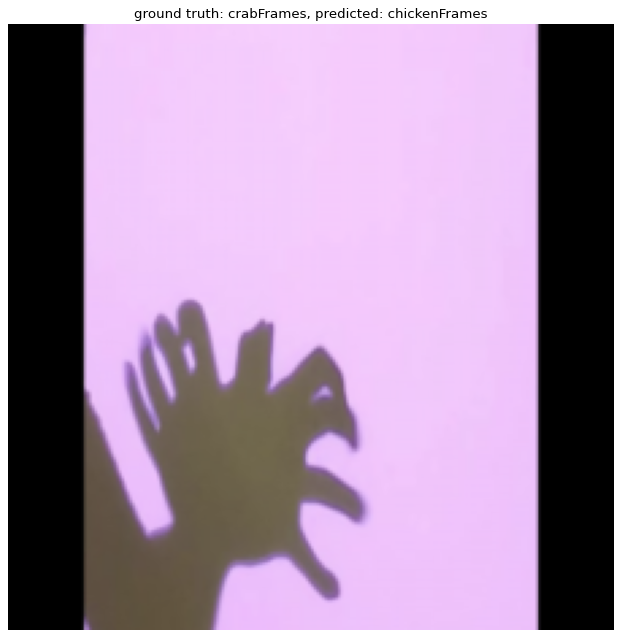

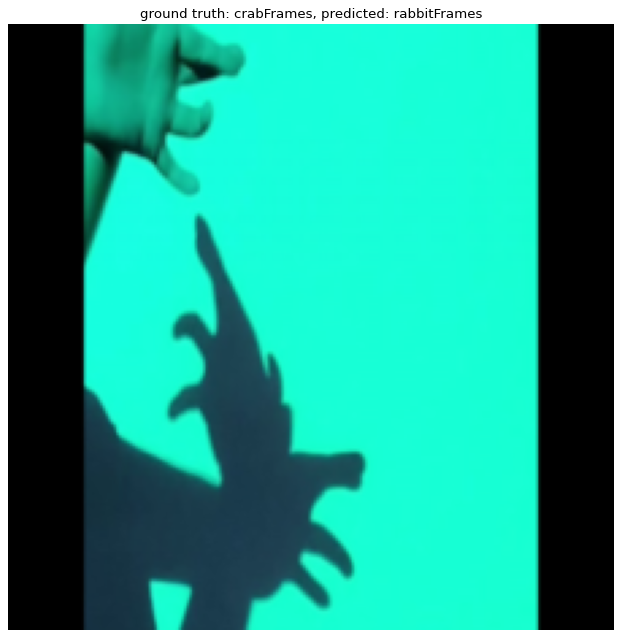

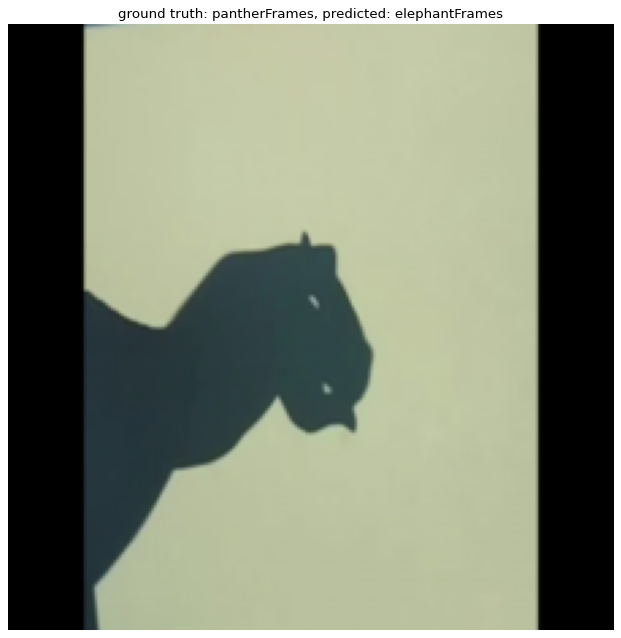

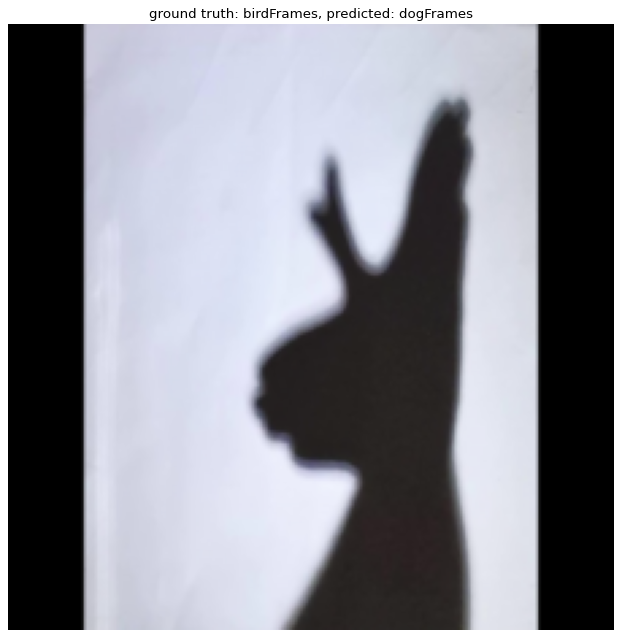

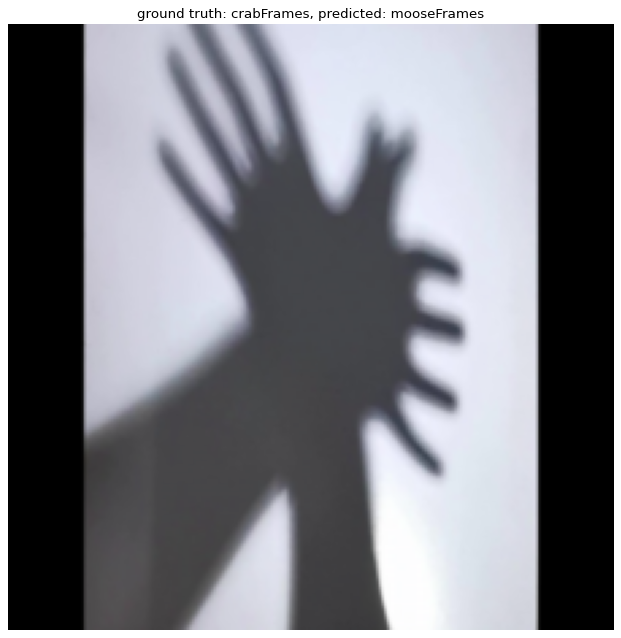

...

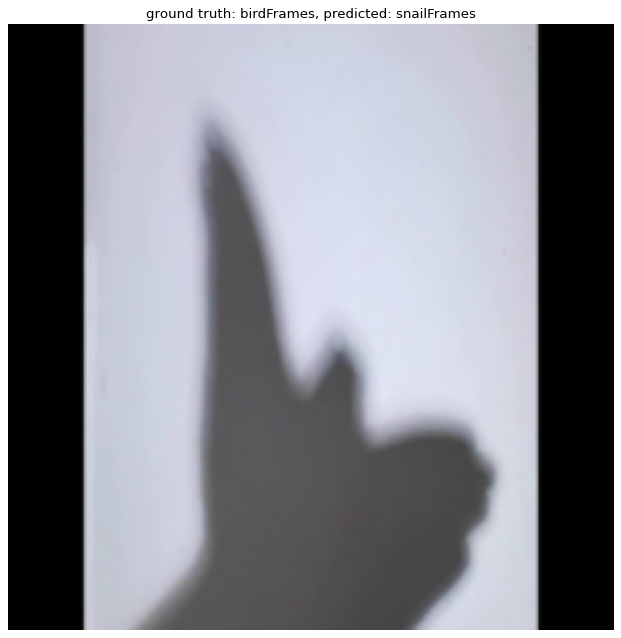

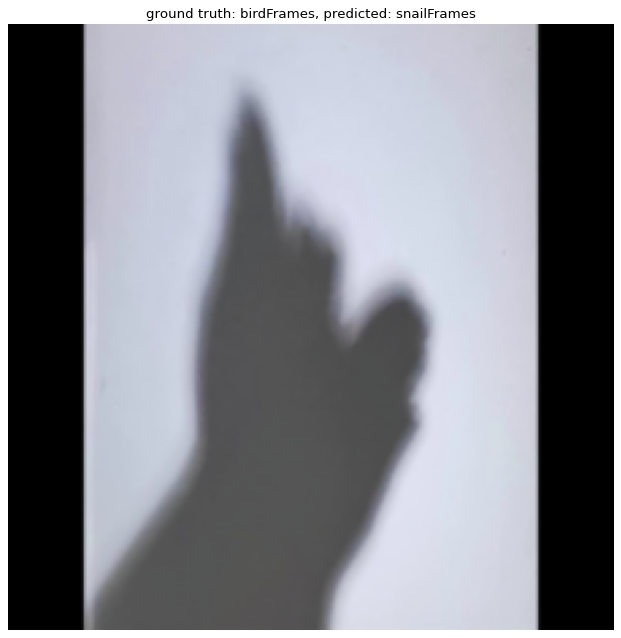

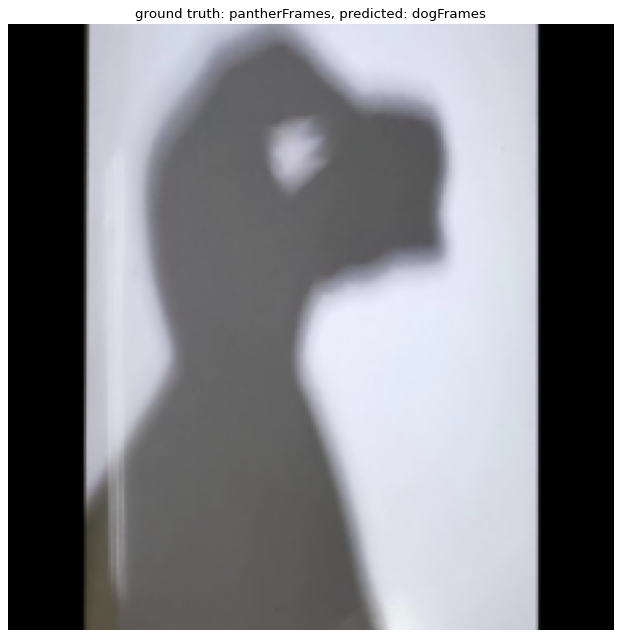

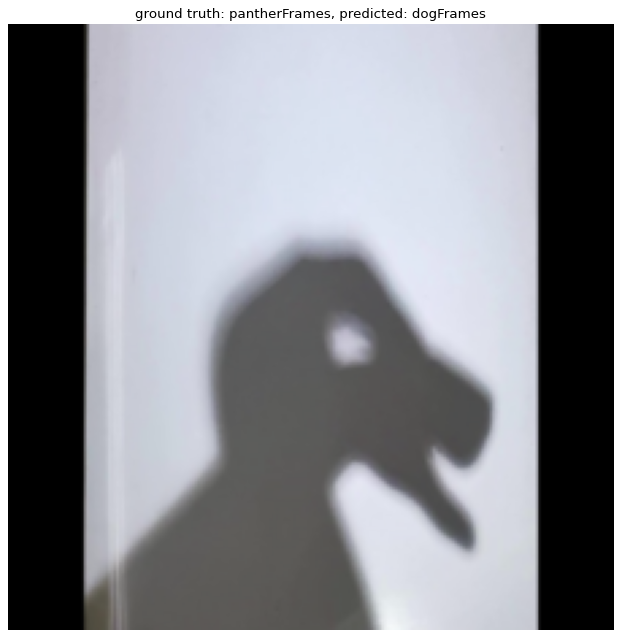

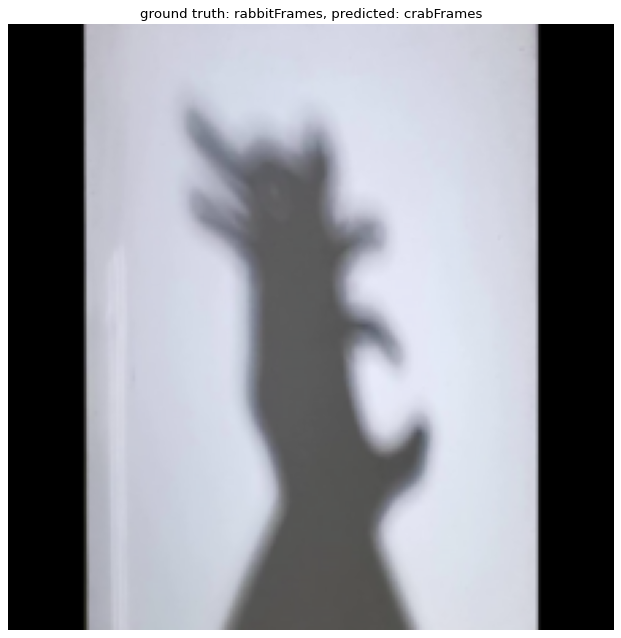

<Figure size 9440x9280 with 0 Axes>

In [67]:
visualize_best_model(model_best)

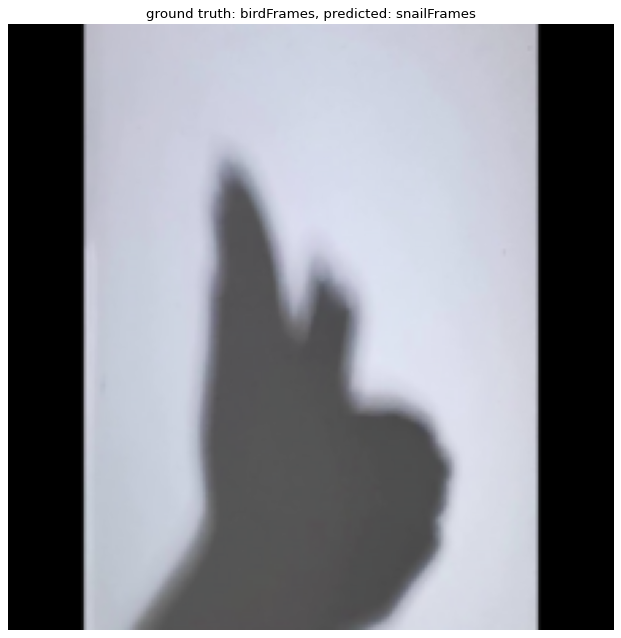

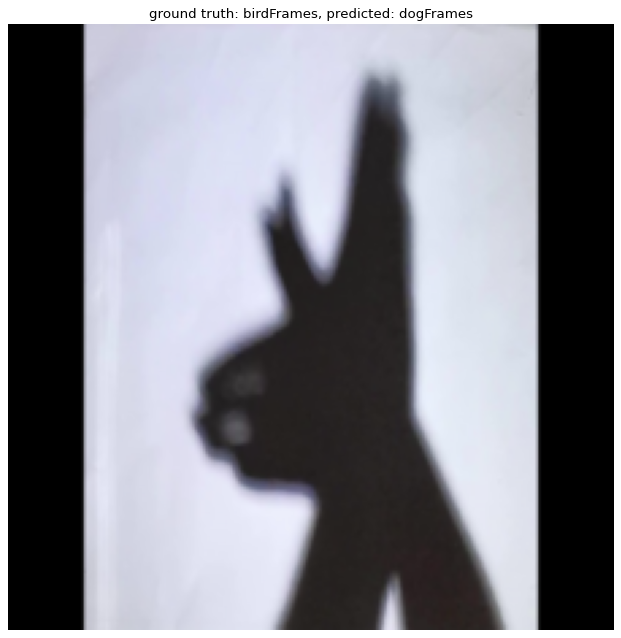

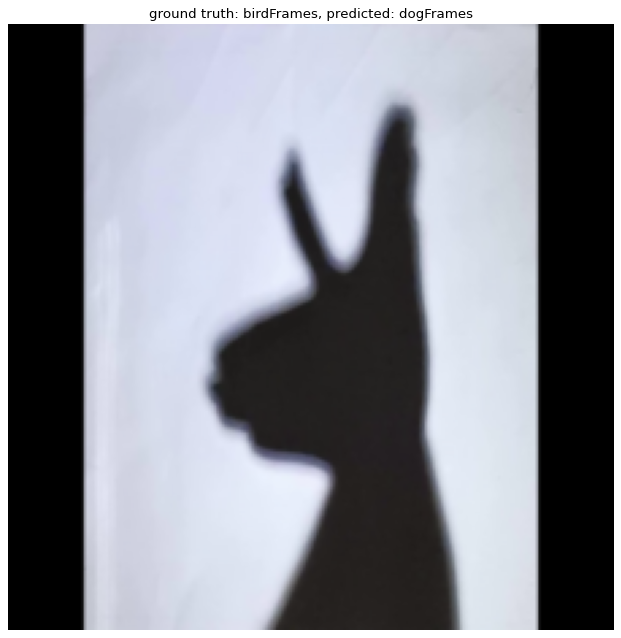

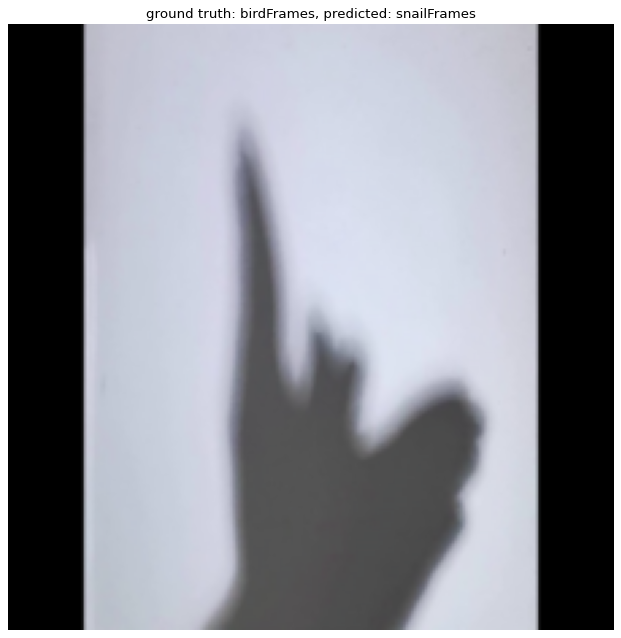

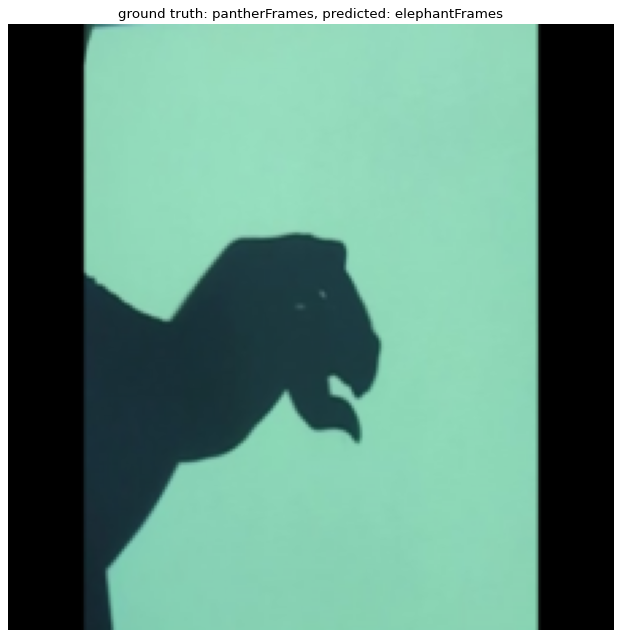

...

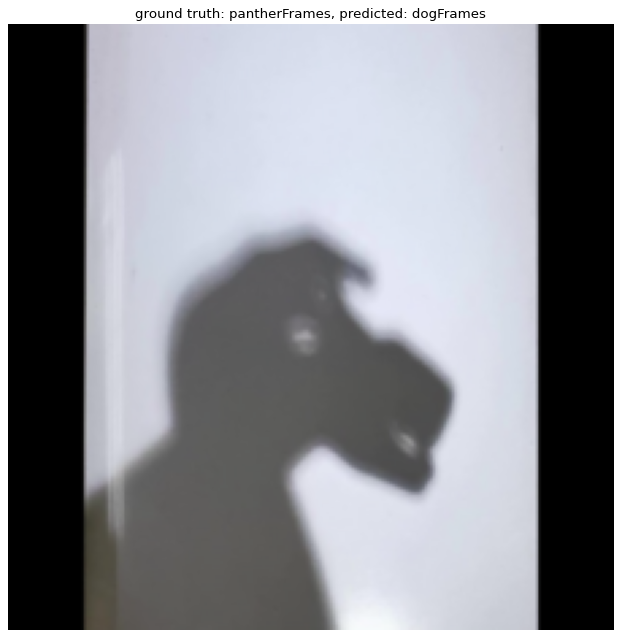

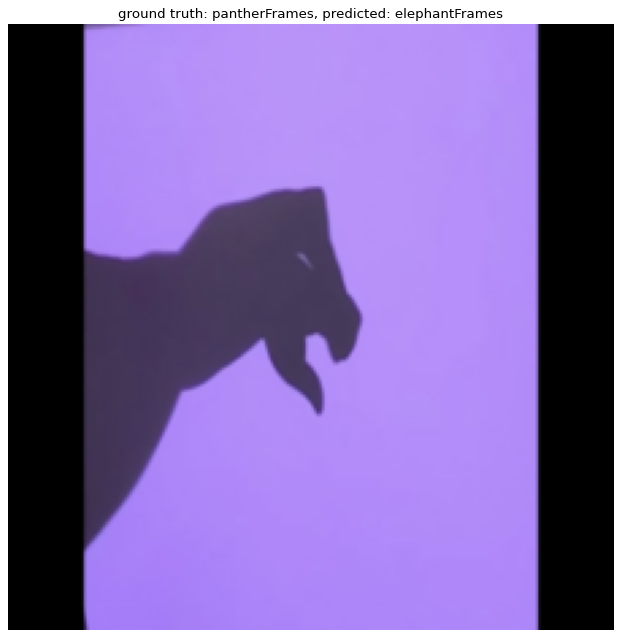

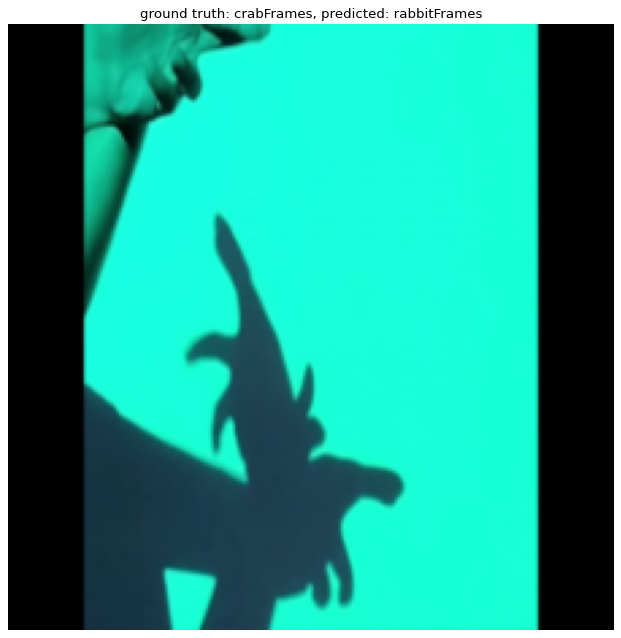

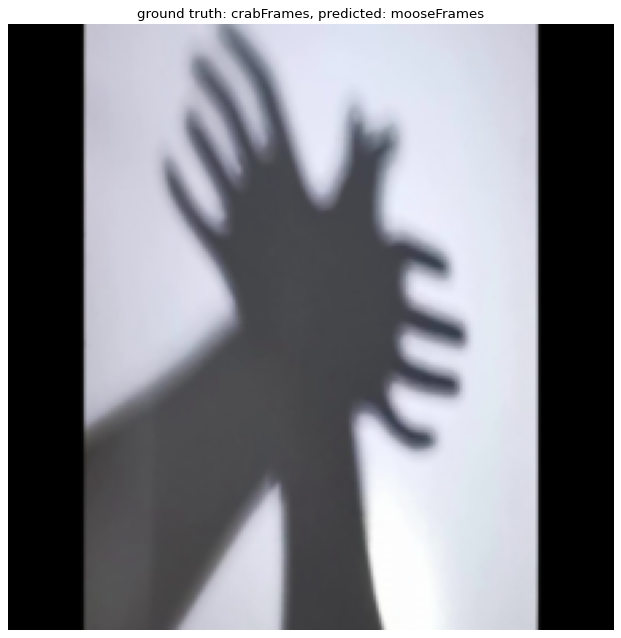

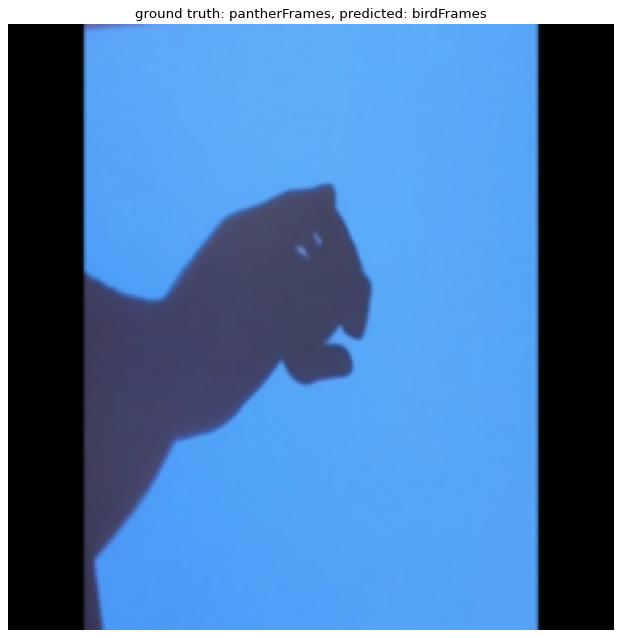

<Figure size 9440x9280 with 0 Axes>

In [68]:
visualize_best_model(model_best)

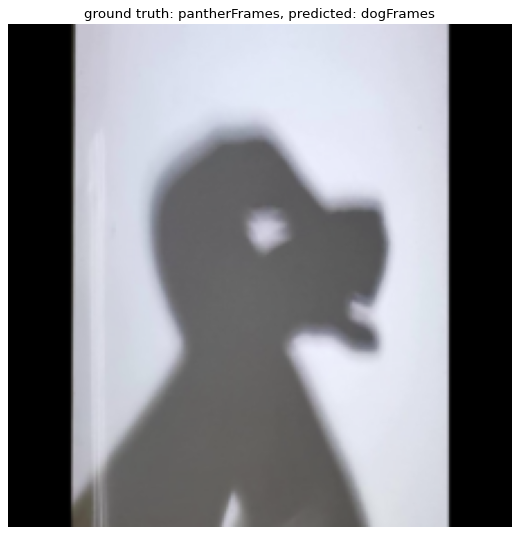

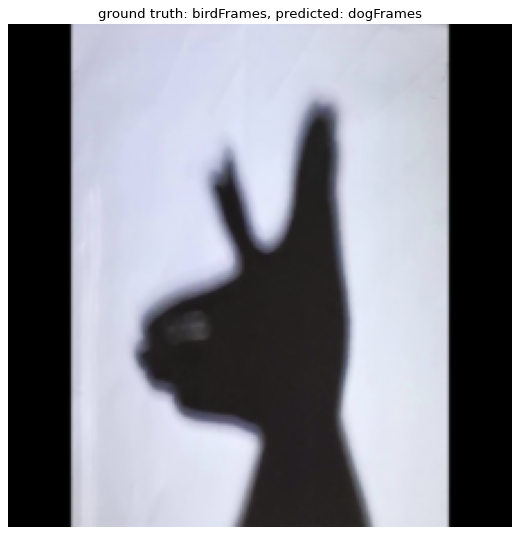

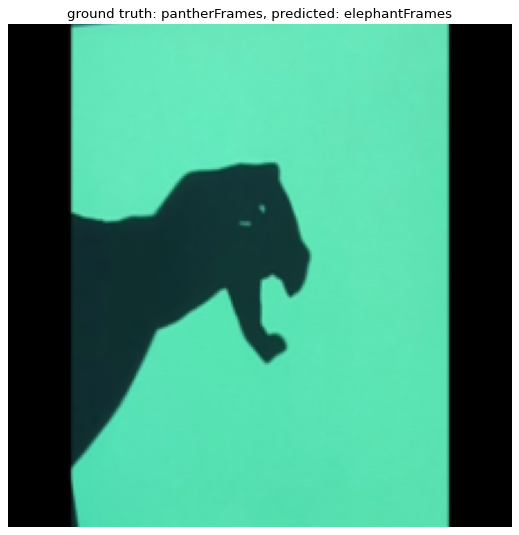

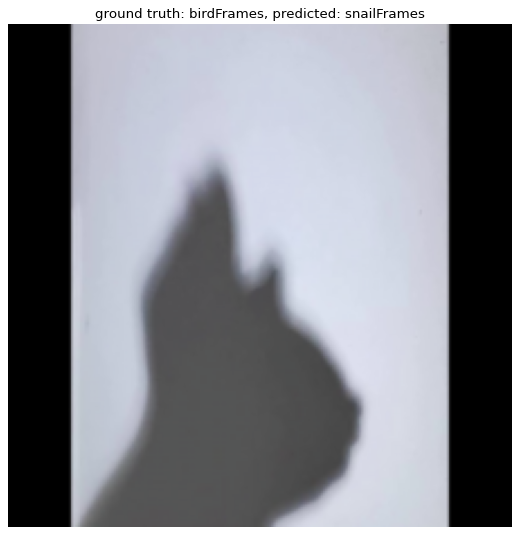

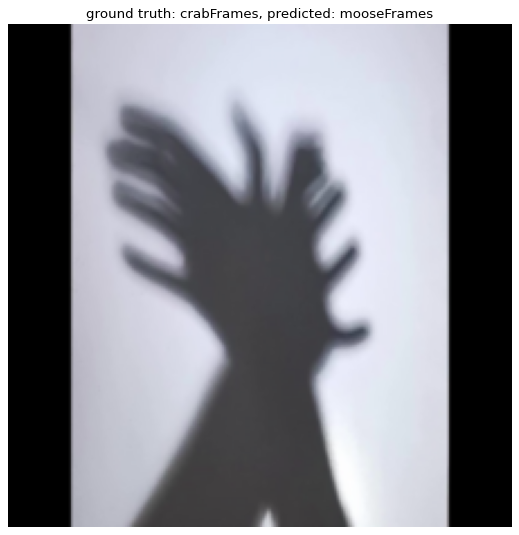

...

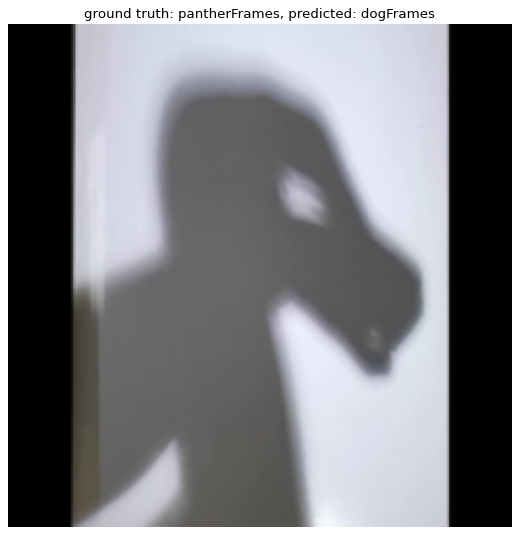

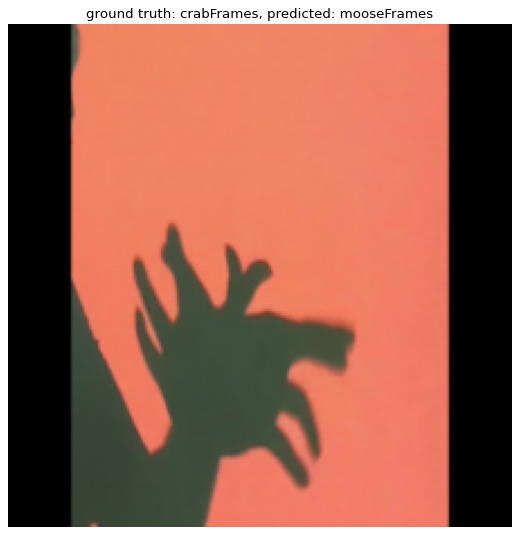

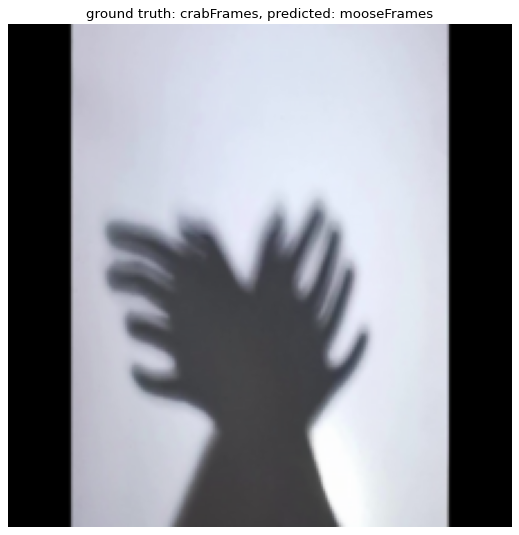

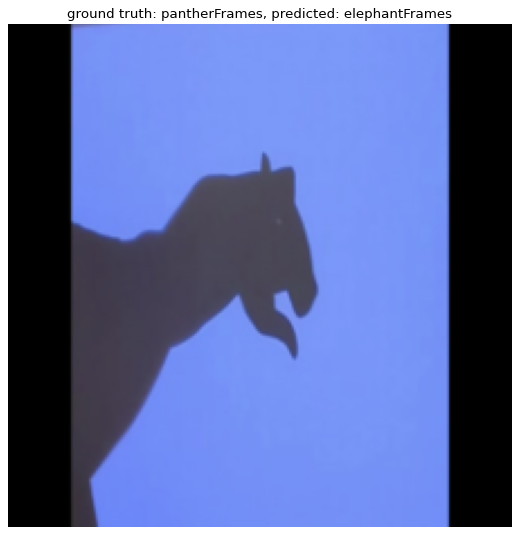

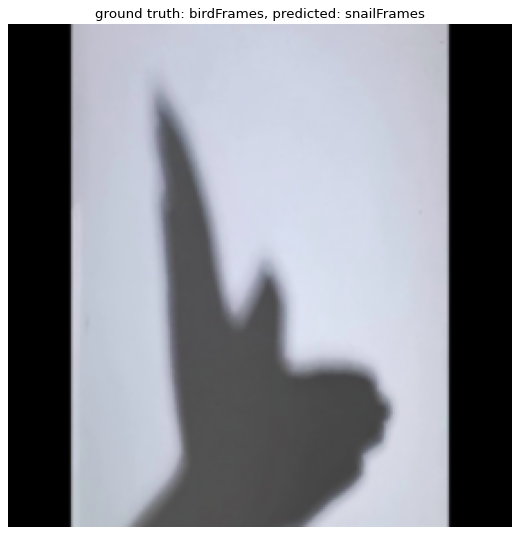

<Figure size 9440x9280 with 0 Axes>

In [69]:
visualize_best_model(model_best,max_mistakes=25)

In [105]:
def generate_confusion_matrix(model, num_images=3737):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    actual = []
    predicted = []
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(299,299), antialias=True, mode='bilinear')
            # inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                actual.append(labels[j])
                predicted.append(preds[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return actual, predicted
        model.train(mode=was_training)

In [106]:
a, p = generate_confusion_matrix(model_best)

In [107]:
print(a)
print(p)

[tensor(0, device='cuda:0'), tensor(6, device='cuda:0'), tensor(0, device='cuda:0'), tensor(4, device='cuda:0'), tensor(8, device='cuda:0'), tensor(4, device='cuda:0'), tensor(7, device='cuda:0'), tensor(10, device='cuda:0'), tensor(4, device='cuda:0'), tensor(3, device='cuda:0'), tensor(1, device='cuda:0'), tensor(7, device='cuda:0'), tensor(4, device='cuda:0'), tensor(0, device='cuda:0'), tensor(9, device='cuda:0'), tensor(4, device='cuda:0'), tensor(7, device='cuda:0'), tensor(5, device='cuda:0'), tensor(3, device='cuda:0'), tensor(6, device='cuda:0'), tensor(0, device='cuda:0'), tensor(9, device='cuda:0'), tensor(0, device='cuda:0'), tensor(8, device='cuda:0'), tensor(8, device='cuda:0'), tensor(1, device='cuda:0'), tensor(9, device='cuda:0'), tensor(2, device='cuda:0'), tensor(4, device='cuda:0'), tensor(8, device='cuda:0'), tensor(4, device='cuda:0'), tensor(8, device='cuda:0'), tensor(10, device='cuda:0'), tensor(9, device='cuda:0'), tensor(4, device='cuda:0'), tensor(1, device=

In [108]:
an = np.array([i.detach().cpu().numpy() for i in a])
print(an)

[0 6 0 ... 6 5 6]


In [109]:
pn = np.array([i.detach().cpu().numpy() for i in p])
print(pn)

[0 6 0 ... 6 5 6]


In [111]:
(an == pn)[4]

False

In [73]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [112]:
cm = confusion_matrix(an, pn)
print(cm)

[[279   6  27   0   3   8   0   9   0   0  29]
 [  1 388   0   0   0   0   0   0   0   0   0]
 [  1   4 215   0   0   1   0   0   0   0   2]
 [ 24  12   0 178   6   0   0  44   0  62   2]
 [  1   1  11   0 365   0   0   1   0   0   0]
 [  3   0   0   0   0 361   0   0   1   0   0]
 [  0   0   0   0   0   0 315   0   0   0   0]
 [  1   0   0   0   1   0   0 320   0   0   0]
 [  7   0   0   0   0  29 107   0 253   0   0]
 [  0   0   0   1   0   0   0   0   1 345   1]
 [  0   2   0   0   0   3   0   0   0   0 306]]


In [98]:
! pip install pandas_ml

Defaulting to user installation because normal site-packages is not writeable


In [113]:
from sklearn.metrics import classification_report
print(classification_report(an, pn, target_names=class_names, digits=4))

                precision    recall  f1-score   support

    birdFrames     0.8801    0.7729    0.8230       361
 chickenFrames     0.9395    0.9974    0.9676       389
     cowFrames     0.8498    0.9641    0.9034       223
    crabFrames     0.9944    0.5427    0.7022       328
    deerFrames     0.9733    0.9631    0.9682       379
     dogFrames     0.8980    0.9890    0.9413       365
elephantFrames     0.7464    1.0000    0.8548       315
   mooseFrames     0.8556    0.9938    0.9195       322
 pantherFrames     0.9922    0.6389    0.7773       396
  rabbitFrames     0.8477    0.9914    0.9139       348
   snailFrames     0.9000    0.9839    0.9401       311

      accuracy                         0.8898      3737
     macro avg     0.8979    0.8943    0.8828      3737
  weighted avg     0.9028    0.8898    0.8829      3737



In [114]:
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

In [115]:
cm.diagonal()

array([0.77285319, 0.99742931, 0.96412556, 0.54268293, 0.96306069,
       0.9890411 , 1.        , 0.99378882, 0.63888889, 0.99137931,
       0.98392283])

In [116]:
from sklearn.metrics import accuracy_score
{name: accuracy_score(np.array(an) == i, np.array(pn) == i) for i, name in enumerate(class_names)}

{'birdFrames': 0.9678886807599679,
 'chickenFrames': 0.993042547497993,
 'cowFrames': 0.9876906609579877,
 'crabFrames': 0.9595932566229596,
 'deerFrames': 0.9935777361519936,
 'dogFrames': 0.9879582552849879,
 'elephantFrames': 0.9713674070109714,
 'mooseFrames': 0.985014717687985,
 'pantherFrames': 0.9611988225849611,
 'rabbitFrames': 0.9826063687449826,
 'snailFrames': 0.9895638212469896}

In [117]:
accuracy_score(an, pn)

0.8897511372758897

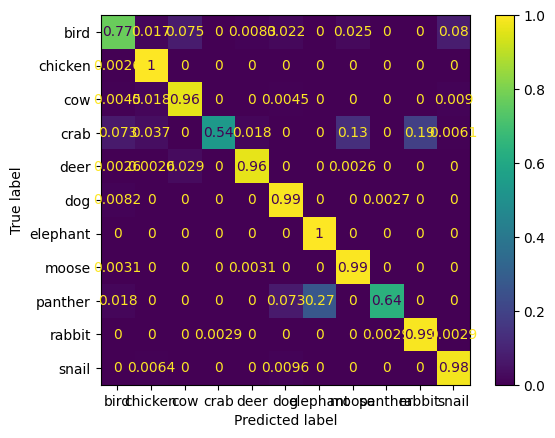

In [119]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[animal[:-6] for animal in class_names])
disp.plot()

In [117]:
def visualize_temp_model(model, num_images=3737, max_mistakes=20):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    wrong_predictions = 0
    fig = plt.figure(figsize=(118, 116), dpi=80)
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                if class_names[labels[j]] != class_names[preds[j]]:
                    wrong_predictions += 1
                    ax = plt.subplot(max_mistakes//2, 3, wrong_predictions)
                    ax.axis('off')
                    ax.set_title('ground truth: {}, predicted: {}'.format(class_names[labels[j]], class_names[preds[j]]))
                    imshow(inputs.cpu().data[j])
                    fig = plt.figure(figsize=(118, 116), dpi=80)

                if max_mistakes == wrong_predictions or images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [183]:
def generate_classification_report(model, num_images=3737):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    actual = []
    predicted = []
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            # inputs = F.interpolate(inputs, size=(299,299), antialias=True, mode='bilinear')
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                actual.append(labels[j])
                predicted.append(preds[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    an = np.array([i.detach().cpu().numpy() for i in actual])
                    pn = np.array([i.detach().cpu().numpy() for i in predicted])
                    print(len(set(an)),len(set(pn)))
                    return classification_report(an, pn, labels=[i for i in range(11)], target_names=class_names, digits=4)
                    # return actual, predicted
        model.train(mode=was_training)

In [195]:
model_temp = models.shufflenet_v2_x1_0(pretrained=True)
num_ftrs_temp = model_temp.fc.in_features
classifier_block = nn.Sequential(
                                    nn.Linear(num_ftrs_temp, 512),
                                    nn.BatchNorm1d(512),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256, 11))
# model_temp.fc = nn.Linear(num_ftrs_temp, 11)
model_temp.fc = classifier_block
loaded_model_temp = torch.load('/home/cse/Rifat/HaSPeR/saved_models/HSPR_ShuffleNetV2X10_Aug_CB.pt')
# print(loaded_model.keys())
model_temp.load_state_dict(loaded_model_temp, strict=False)
asd = model_temp.eval().to(device)

/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/cse/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
print(generate_classification_report(model_temp)) # InceptionV3_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.7091    0.7562    0.7319       361
 chickenFrames     0.8778    0.9974    0.9338       389
     cowFrames     0.8455    0.8834    0.8640       223
    crabFrames     0.9677    0.5488    0.7004       328
    deerFrames     0.9457    0.9657    0.9556       379
     dogFrames     0.8703    0.9562    0.9112       365
elephantFrames     0.9721    0.9968    0.9843       315
   mooseFrames     0.7995    0.9783    0.8799       322
 pantherFrames     0.9925    0.6667    0.7976       396
  rabbitFrames     0.9299    0.9914    0.9597       348
   snailFrames     0.8854    0.9936    0.9364       311

      accuracy                         0.8831      3737
     macro avg     0.8905    0.8849    0.8777      3737
  weighted avg     0.8925    0.8831    0.8775      3737



In [19]:
print(generate_classification_report(model_temp)) # ResNext101_32X8D

                precision    recall  f1-score   support

    birdFrames     0.9231    0.8975    0.9101       361
 chickenFrames     0.9823    1.0000    0.9911       389
     cowFrames     0.9554    0.9596    0.9575       223
    crabFrames     0.9948    0.5823    0.7346       328
    deerFrames     0.9635    0.9763    0.9699       379
     dogFrames     0.7398    0.9890    0.8464       365
elephantFrames     0.7597    0.9937    0.8611       315
   mooseFrames     0.8320    0.9845    0.9018       322
 pantherFrames     0.9944    0.4520    0.6215       396
  rabbitFrames     0.8564    0.9943    0.9202       348
   snailFrames     0.9477    0.9904    0.9686       311

      accuracy                         0.8863      3737
     macro avg     0.9045    0.8927    0.8803      3737
  weighted avg     0.9055    0.8863    0.8762      3737



In [21]:
print(generate_classification_report(model_temp)) # ResNext101_32X8D_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8378    0.9446    0.8880       361
 chickenFrames     0.9648    0.9871    0.9759       389
     cowFrames     0.9685    0.9641    0.9663       223
    crabFrames     1.0000    0.4604    0.6305       328
    deerFrames     0.9869    0.9921    0.9895       379
     dogFrames     0.8665    0.9781    0.9189       365
elephantFrames     0.7664    1.0000    0.8678       315
   mooseFrames     0.7955    0.9783    0.8774       322
 pantherFrames     1.0000    0.5732    0.7287       396
  rabbitFrames     0.8443    0.9971    0.9144       348
   snailFrames     0.9502    0.9807    0.9652       311

      accuracy                         0.8919      3737
     macro avg     0.9073    0.8960    0.8839      3737
  weighted avg     0.9085    0.8919    0.8819      3737



In [25]:
print(generate_classification_report(model_temp)) # DenseNet121

                precision    recall  f1-score   support

    birdFrames     0.8252    0.7978    0.8113       361
 chickenFrames     0.9240    1.0000    0.9605       389
     cowFrames     0.9440    0.9821    0.9626       223
    crabFrames     1.0000    0.4665    0.6362       328
    deerFrames     0.9973    0.9815    0.9894       379
     dogFrames     0.8478    0.9616    0.9012       365
elephantFrames     0.7609    1.0000    0.8642       315
   mooseFrames     0.7896    0.9907    0.8788       322
 pantherFrames     1.0000    0.5833    0.7368       396
  rabbitFrames     0.8188    1.0000    0.9004       348
   snailFrames     0.9346    0.9646    0.9494       311

      accuracy                         0.8790      3737
     macro avg     0.8947    0.8844    0.8719      3737
  weighted avg     0.8961    0.8790    0.8695      3737



In [27]:
print(generate_classification_report(model_temp)) # DenseNet121_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8845    0.7424    0.8072       361
 chickenFrames     0.9298    0.9871    0.9576       389
     cowFrames     0.8490    0.9327    0.8889       223
    crabFrames     1.0000    0.4299    0.6013       328
    deerFrames     0.9154    0.9710    0.9424       379
     dogFrames     0.8251    0.9562    0.8858       365
elephantFrames     0.6923    1.0000    0.8182       315
   mooseFrames     0.7920    0.9814    0.8766       322
 pantherFrames     0.9954    0.5429    0.7026       396
  rabbitFrames     0.8795    0.9856    0.9295       348
   snailFrames     0.8857    0.9968    0.9380       311

      accuracy                         0.8609      3737
     macro avg     0.8771    0.8660    0.8498      3737
  weighted avg     0.8818    0.8609    0.8491      3737



In [36]:
print(generate_classification_report(model_temp)) # WideResNet101_2

                precision    recall  f1-score   support

    birdFrames     0.9352    0.8393    0.8847       361
 chickenFrames     0.9628    0.9974    0.9798       389
     cowFrames     0.8571    0.9417    0.8974       223
    crabFrames     1.0000    0.5122    0.6774       328
    deerFrames     0.9662    0.9815    0.9738       379
     dogFrames     0.8829    0.9918    0.9342       365
elephantFrames     0.6590    1.0000    0.7945       315
   mooseFrames     0.8226    0.9938    0.9001       322
 pantherFrames     1.0000    0.4773    0.6462       396
  rabbitFrames     0.8262    0.9971    0.9036       348
   snailFrames     0.9387    0.9839    0.9608       311

      accuracy                         0.8777      3737
     macro avg     0.8955    0.8833    0.8684      3737
  weighted avg     0.9012    0.8777    0.8676      3737



In [34]:
print(generate_classification_report(model_temp)) # WideResNet101_2_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.7244    0.7645    0.7439       361
 chickenFrames     0.9481    0.9871    0.9673       389
     cowFrames     0.8295    0.9596    0.8898       223
    crabFrames     1.0000    0.4848    0.6530       328
    deerFrames     1.0000    0.9789    0.9893       379
     dogFrames     0.8349    0.9699    0.8973       365
elephantFrames     0.7500    1.0000    0.8571       315
   mooseFrames     0.7565    0.9938    0.8591       322
 pantherFrames     0.9949    0.4899    0.6565       396
  rabbitFrames     0.8872    0.9943    0.9377       348
   snailFrames     0.9357    0.9357    0.9357       311

      accuracy                         0.8627      3737
     macro avg     0.8783    0.8690    0.8533      3737
  weighted avg     0.8832    0.8627    0.8520      3737



In [38]:
print(generate_classification_report(model_temp)) # ResNet34

                precision    recall  f1-score   support

    birdFrames     0.9296    0.6953    0.7956       361
 chickenFrames     0.9821    0.9897    0.9859       389
     cowFrames     0.9087    0.9821    0.9440       223
    crabFrames     1.0000    0.4939    0.6612       328
    deerFrames     0.9862    0.9420    0.9636       379
     dogFrames     0.7704    0.9836    0.8640       365
elephantFrames     0.7241    1.0000    0.8400       315
   mooseFrames     0.7905    0.9845    0.8769       322
 pantherFrames     0.9962    0.6566    0.7915       396
  rabbitFrames     0.8141    0.9943    0.8952       348
   snailFrames     0.9348    0.9678    0.9510       311

      accuracy                         0.8756      3737
     macro avg     0.8943    0.8809    0.8699      3737
  weighted avg     0.8976    0.8756    0.8687      3737



In [40]:
print(generate_classification_report(model_temp)) # ResNet34_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8073    0.8006    0.8039       361
 chickenFrames     0.9141    0.9846    0.9480       389
     cowFrames     0.8866    0.9462    0.9154       223
    crabFrames     1.0000    0.3841    0.5551       328
    deerFrames     0.9812    0.9631    0.9720       379
     dogFrames     0.8871    0.9260    0.9062       365
elephantFrames     0.6962    0.9968    0.8198       315
   mooseFrames     0.7578    0.9814    0.8552       322
 pantherFrames     0.9952    0.5278    0.6898       396
  rabbitFrames     0.8305    1.0000    0.9074       348
   snailFrames     0.8873    0.9871    0.9346       311

      accuracy                         0.8579      3737
     macro avg     0.8767    0.8634    0.8461      3737
  weighted avg     0.8806    0.8579    0.8449      3737



In [42]:
print(generate_classification_report(model_temp)) # ResNet50

                precision    recall  f1-score   support

    birdFrames     0.7517    0.8975    0.8182       361
 chickenFrames     0.9534    1.0000    0.9762       389
     cowFrames     0.9860    0.9507    0.9680       223
    crabFrames     1.0000    0.5610    0.7188       328
    deerFrames     0.9603    0.9578    0.9590       379
     dogFrames     0.8520    0.9781    0.9107       365
elephantFrames     0.6716    1.0000    0.8036       315
   mooseFrames     0.7767    0.9938    0.8719       322
 pantherFrames     1.0000    0.3434    0.5113       396
  rabbitFrames     0.9249    0.9914    0.9570       348
   snailFrames     0.9712    0.9743    0.9727       311

      accuracy                         0.8691      3737
     macro avg     0.8953    0.8771    0.8607      3737
  weighted avg     0.8956    0.8691    0.8548      3737



In [44]:
print(generate_classification_report(model_temp)) # ResNet50_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.7623    0.7729    0.7675       361
 chickenFrames     0.9621    0.9794    0.9707       389
     cowFrames     0.9818    0.9686    0.9752       223
    crabFrames     1.0000    0.3323    0.4989       328
    deerFrames     0.8969    0.9182    0.9074       379
     dogFrames     0.8215    0.9205    0.8682       365
elephantFrames     0.7360    1.0000    0.8479       315
   mooseFrames     0.7159    0.9938    0.8322       322
 pantherFrames     1.0000    0.5253    0.6887       396
  rabbitFrames     0.8227    1.0000    0.9027       348
   snailFrames     0.8892    0.9807    0.9327       311

      accuracy                         0.8469      3737
     macro avg     0.8717    0.8538    0.8357      3737
  weighted avg     0.8717    0.8469    0.8319      3737



In [46]:
print(generate_classification_report(model_temp)) # ResNet152

                precision    recall  f1-score   support

    birdFrames     0.8871    0.8920    0.8895       361
 chickenFrames     0.9533    0.9974    0.9749       389
     cowFrames     0.9188    0.9641    0.9409       223
    crabFrames     1.0000    0.5610    0.7188       328
    deerFrames     0.9760    0.9657    0.9708       379
     dogFrames     0.7627    0.9863    0.8602       365
elephantFrames     0.6495    1.0000    0.7875       315
   mooseFrames     0.8541    0.9814    0.9133       322
 pantherFrames     1.0000    0.3308    0.4972       396
  rabbitFrames     0.8763    0.9971    0.9328       348
   snailFrames     0.9437    0.9711    0.9572       311

      accuracy                         0.8686      3737
     macro avg     0.8929    0.8770    0.8585      3737
  weighted avg     0.8954    0.8686    0.8534      3737



In [49]:
print(generate_classification_report(model_temp)) # ResNet152_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8514    0.8255    0.8383       361
 chickenFrames     0.9744    0.9769    0.9756       389
     cowFrames     0.8987    0.9552    0.9261       223
    crabFrames     0.9783    0.4116    0.5794       328
    deerFrames     0.9699    0.9367    0.9530       379
     dogFrames     0.8314    0.9589    0.8906       365
elephantFrames     0.7687    0.9810    0.8619       315
   mooseFrames     0.7042    0.9907    0.8232       322
 pantherFrames     0.9913    0.5758    0.7284       396
  rabbitFrames     0.8018    1.0000    0.8900       348
   snailFrames     0.9589    0.9743    0.9665       311

      accuracy                         0.8665      3737
     macro avg     0.8844    0.8715    0.8576      3737
  weighted avg     0.8877    0.8665    0.8564      3737



In [51]:
print(generate_classification_report(model_temp)) # DenseNet201

                precision    recall  f1-score   support

    birdFrames     0.8267    0.7535    0.7884       361
 chickenFrames     0.8502    0.9923    0.9158       389
     cowFrames     0.8777    0.9013    0.8894       223
    crabFrames     1.0000    0.3384    0.5057       328
    deerFrames     0.9519    0.9921    0.9716       379
     dogFrames     0.8787    0.9726    0.9233       365
elephantFrames     0.8161    1.0000    0.8987       315
   mooseFrames     0.7102    0.9969    0.8295       322
 pantherFrames     1.0000    0.6465    0.7853       396
  rabbitFrames     0.8488    1.0000    0.9182       348
   snailFrames     0.9775    0.9775    0.9775       311

      accuracy                         0.8683      3737
     macro avg     0.8853    0.8701    0.8548      3737
  weighted avg     0.8872    0.8683    0.8550      3737



In [53]:
print(generate_classification_report(model_temp)) # DenseNet201_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8425    0.8449    0.8437       361
 chickenFrames     0.9798    0.9974    0.9885       389
     cowFrames     0.9310    0.9686    0.9495       223
    crabFrames     1.0000    0.6220    0.7669       328
    deerFrames     0.9869    0.9921    0.9895       379
     dogFrames     0.7548    0.9699    0.8489       365
elephantFrames     0.7554    1.0000    0.8607       315
   mooseFrames     0.8451    1.0000    0.9161       322
 pantherFrames     0.9949    0.4924    0.6588       396
  rabbitFrames     0.9039    1.0000    0.9495       348
   snailFrames     0.9522    0.9614    0.9568       311

      accuracy                         0.8889      3737
     macro avg     0.9042    0.8953    0.8844      3737
  weighted avg     0.9059    0.8889    0.8810      3737



In [56]:
print(generate_classification_report(model_temp)) # RegNetX32GF

                precision    recall  f1-score   support

    birdFrames     0.8988    0.8116    0.8530       361
 chickenFrames     0.9484    0.9923    0.9698       389
     cowFrames     0.8838    0.9552    0.9181       223
    crabFrames     1.0000    0.4878    0.6557       328
    deerFrames     0.9661    0.9789    0.9725       379
     dogFrames     0.7418    0.9918    0.8488       365
elephantFrames     0.7175    1.0000    0.8355       315
   mooseFrames     0.8119    0.9783    0.8873       322
 pantherFrames     1.0000    0.4343    0.6056       396
  rabbitFrames     0.8357    0.9943    0.9081       348
   snailFrames     0.9623    0.9839    0.9730       311

      accuracy                         0.8667      3737
     macro avg     0.8879    0.8735    0.8570      3737
  weighted avg     0.8908    0.8667    0.8538      3737



In [58]:
print(generate_classification_report(model_temp)) # RegNetX32GF_Aug_CB

                precision    recall  f1-score   support

    birdFrames     0.8055    0.8144    0.8099       361
 chickenFrames     0.8661    0.9974    0.9271       389
     cowFrames     0.8427    0.9372    0.8875       223
    crabFrames     0.9679    0.4604    0.6240       328
    deerFrames     0.9629    0.9578    0.9603       379
     dogFrames     0.8741    0.9507    0.9108       365
elephantFrames     0.7759    1.0000    0.8738       315
   mooseFrames     0.7430    0.9876    0.8480       322
 pantherFrames     1.0000    0.5657    0.7226       396
  rabbitFrames     0.9280    1.0000    0.9627       348
   snailFrames     0.9393    0.9453    0.9423       311

      accuracy                         0.8699      3737
     macro avg     0.8823    0.8742    0.8608      3737
  weighted avg     0.8862    0.8699    0.8602      3737



In [81]:
print(generate_classification_report(model_temp)) # MaxViT

11 18
                precision    recall  f1-score   support

    birdFrames     0.7970    0.8698    0.8318       361
 chickenFrames     0.8998    0.9692    0.9332       389
     cowFrames     0.9898    0.8700    0.9260       223
    crabFrames     1.0000    0.5823    0.7360       328
    deerFrames     0.9295    0.9393    0.9344       379
     dogFrames     0.8917    0.8575    0.8743       365
elephantFrames     0.6389    1.0000    0.7797       315
   mooseFrames     0.8248    0.9503    0.8831       322
 pantherFrames     0.9865    0.5556    0.7108       396
  rabbitFrames     0.8824    0.9914    0.9337       348
   snailFrames     0.9528    0.9743    0.9634       311

     micro avg     0.8670    0.8654    0.8662      3737
     macro avg     0.8903    0.8691    0.8642      3737
  weighted avg     0.8898    0.8654    0.8618      3737



In [79]:
print(generate_classification_report(model_temp)) # MaxViT_Aug_CB

11 15
                precision    recall  f1-score   support

    birdFrames     0.9125    0.6648    0.7692       361
 chickenFrames     0.7939    1.0000    0.8851       389
     cowFrames     0.7329    0.9596    0.8311       223
    crabFrames     0.9939    0.4970    0.6626       328
    deerFrames     0.9597    0.9420    0.9507       379
     dogFrames     0.7061    0.8822    0.7844       365
elephantFrames     0.9059    0.9778    0.9405       315
   mooseFrames     0.7617    0.9627    0.8505       322
 pantherFrames     0.9807    0.6414    0.7756       396
  rabbitFrames     0.8500    0.9770    0.9091       348
   snailFrames     0.9965    0.9228    0.9583       311

     micro avg     0.8534    0.8520    0.8527      3737
     macro avg     0.8722    0.8570    0.8470      3737
  weighted avg     0.8761    0.8520    0.8464      3737



In [83]:
print(generate_classification_report(model_temp)) # ResNet101

11 11
                precision    recall  f1-score   support

    birdFrames     0.9148    0.8033    0.8555       361
 chickenFrames     0.9624    0.9871    0.9746       389
     cowFrames     0.8340    0.9910    0.9057       223
    crabFrames     1.0000    0.3750    0.5455       328
    deerFrames     0.9300    0.9815    0.9551       379
     dogFrames     0.8255    0.9589    0.8872       365
elephantFrames     0.7111    1.0000    0.8311       315
   mooseFrames     0.7384    0.9907    0.8462       322
 pantherFrames     1.0000    0.5076    0.6734       396
  rabbitFrames     0.8242    0.9971    0.9025       348
   snailFrames     0.9808    0.9839    0.9823       311

      accuracy                         0.8638      3737
     macro avg     0.8837    0.8706    0.8508      3737
  weighted avg     0.8889    0.8638    0.8496      3737



In [85]:
print(generate_classification_report(model_temp)) # ResNet101_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8221    0.6399    0.7196       361
 chickenFrames     0.9433    0.9846    0.9635       389
     cowFrames     0.7363    0.9641    0.8350       223
    crabFrames     0.9944    0.5396    0.6996       328
    deerFrames     0.9714    0.9842    0.9777       379
     dogFrames     0.9465    0.9699    0.9581       365
elephantFrames     0.6702    1.0000    0.8025       315
   mooseFrames     0.8077    0.9783    0.8848       322
 pantherFrames     0.9910    0.5530    0.7099       396
  rabbitFrames     0.9108    0.9971    0.9520       348
   snailFrames     0.8472    0.9807    0.9091       311

      accuracy                         0.8654      3737
     macro avg     0.8764    0.8719    0.8556      3737
  weighted avg     0.8862    0.8654    0.8572      3737



In [87]:
print(generate_classification_report(model_temp)) # SwinB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8464    0.8393    0.8428       361
 chickenFrames     0.9496    0.9692    0.9593       389
     cowFrames     0.9513    0.9641    0.9577       223
    crabFrames     0.9935    0.4695    0.6377       328
    deerFrames     0.9495    0.9420    0.9457       379
     dogFrames     0.7751    0.8877    0.8276       365
elephantFrames     0.7140    0.9905    0.8298       315
   mooseFrames     0.7605    0.9565    0.8473       322
 pantherFrames     0.9735    0.5556    0.7074       396
  rabbitFrames     0.7968    0.9914    0.8835       348
   snailFrames     0.9575    0.9421    0.9498       311

      accuracy                         0.8584      3737
     macro avg     0.8789    0.8643    0.8535      3737
  weighted avg     0.8793    0.8584    0.8504      3737



In [89]:
print(generate_classification_report(model_temp)) # SwinB_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8222    0.8199    0.8211       361
 chickenFrames     0.9673    0.9897    0.9784       389
     cowFrames     0.9906    0.9462    0.9679       223
    crabFrames     1.0000    0.3780    0.5487       328
    deerFrames     0.8919    0.9578    0.9237       379
     dogFrames     0.7315    0.8959    0.8054       365
elephantFrames     0.7464    1.0000    0.8548       315
   mooseFrames     0.7119    0.9441    0.8117       322
 pantherFrames     0.9953    0.5328    0.6941       396
  rabbitFrames     0.8337    0.9943    0.9069       348
   snailFrames     0.9583    0.9614    0.9599       311

      accuracy                         0.8512      3737
     macro avg     0.8772    0.8564    0.8430      3737
  weighted avg     0.8760    0.8512    0.8393      3737



In [91]:
print(generate_classification_report(model_temp)) # ResNet18

11 11
                precision    recall  f1-score   support

    birdFrames     0.8831    0.7950    0.8367       361
 chickenFrames     0.9896    0.9794    0.9845       389
     cowFrames     0.8479    1.0000    0.9177       223
    crabFrames     1.0000    0.4299    0.6013       328
    deerFrames     0.9518    0.9894    0.9702       379
     dogFrames     0.6575    0.9781    0.7863       365
elephantFrames     0.7664    1.0000    0.8678       315
   mooseFrames     0.8128    0.9845    0.8904       322
 pantherFrames     1.0000    0.3586    0.5279       396
  rabbitFrames     0.8107    0.9971    0.8943       348
   snailFrames     0.9683    0.9807    0.9744       311

      accuracy                         0.8536      3737
     macro avg     0.8807    0.8630    0.8411      3737
  weighted avg     0.8841    0.8536    0.8362      3737



In [93]:
print(generate_classification_report(model_temp)) # ResNet18_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8594    0.7452    0.7982       361
 chickenFrames     0.9725    1.0000    0.9861       389
     cowFrames     0.8571    0.9686    0.9095       223
    crabFrames     1.0000    0.5244    0.6880       328
    deerFrames     0.9838    0.9604    0.9720       379
     dogFrames     0.7198    0.9644    0.8244       365
elephantFrames     0.7275    1.0000    0.8422       315
   mooseFrames     0.7700    0.9876    0.8653       322
 pantherFrames     1.0000    0.4217    0.5933       396
  rabbitFrames     0.8586    0.9943    0.9214       348
   snailFrames     0.9231    0.9646    0.9434       311

      accuracy                         0.8584      3737
     macro avg     0.8793    0.8665    0.8494      3737
  weighted avg     0.8837    0.8584    0.8462      3737



In [100]:
print(generate_classification_report(model_temp)) # ConvNeXt

11 11
                precision    recall  f1-score   support

    birdFrames     0.8344    0.7535    0.7918       361
 chickenFrames     0.9131    1.0000    0.9546       389
     cowFrames     0.9486    0.9103    0.9291       223
    crabFrames     0.9851    0.4024    0.5714       328
    deerFrames     0.9421    0.9446    0.9433       379
     dogFrames     0.7642    0.9233    0.8362       365
elephantFrames     0.7063    1.0000    0.8279       315
   mooseFrames     0.7453    0.9814    0.8472       322
 pantherFrames     0.9909    0.5505    0.7078       396
  rabbitFrames     0.8195    0.9914    0.8973       348
   snailFrames     0.9770    0.9582    0.9675       311

      accuracy                         0.8518      3737
     macro avg     0.8751    0.8560    0.8431      3737
  weighted avg     0.8753    0.8518    0.8407      3737



In [98]:
print(generate_classification_report(model_temp)) # ConvNeXt_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8123    0.7313    0.7697       361
 chickenFrames     0.9462    0.9949    0.9699       389
     cowFrames     0.8228    0.9372    0.8763       223
    crabFrames     0.9888    0.5366    0.6957       328
    deerFrames     0.9506    0.9657    0.9581       379
     dogFrames     0.7948    0.9233    0.8542       365
elephantFrames     0.7326    1.0000    0.8456       315
   mooseFrames     0.8123    0.9814    0.8889       322
 pantherFrames     1.0000    0.5657    0.7226       396
  rabbitFrames     0.8422    0.9971    0.9132       348
   snailFrames     0.9805    0.9678    0.9741       311

      accuracy                         0.8675      3737
     macro avg     0.8803    0.8728    0.8608      3737
  weighted avg     0.8846    0.8675    0.8598      3737



In [104]:
print(generate_classification_report(model_temp)) # SwinV2B

11 12
                precision    recall  f1-score   support

    birdFrames     0.8703    0.7618    0.8124       361
 chickenFrames     0.9410    0.9846    0.9623       389
     cowFrames     0.9493    0.9238    0.9364       223
    crabFrames     1.0000    0.4604    0.6305       328
    deerFrames     0.8683    0.9393    0.9024       379
     dogFrames     0.7368    0.9205    0.8185       365
elephantFrames     0.7111    1.0000    0.8311       315
   mooseFrames     0.7644    0.9472    0.8460       322
 pantherFrames     0.9905    0.5253    0.6865       396
  rabbitFrames     0.8160    0.9943    0.8964       348
   snailFrames     0.9736    0.9486    0.9609       311

     micro avg     0.8501    0.8499    0.8500      3737
     macro avg     0.8747    0.8551    0.8439      3737
  weighted avg     0.8742    0.8499    0.8405      3737



In [106]:
print(generate_classification_report(model_temp)) # SwinV2B_Aug_CB

11 13
                precision    recall  f1-score   support

    birdFrames     0.8837    0.6316    0.7367       361
 chickenFrames     0.9102    0.9897    0.9483       389
     cowFrames     0.8714    0.9417    0.9052       223
    crabFrames     1.0000    0.3963    0.5677       328
    deerFrames     0.9063    0.9446    0.9251       379
     dogFrames     0.6606    0.8959    0.7605       365
elephantFrames     0.6054    0.9937    0.7524       315
   mooseFrames     0.7357    0.9596    0.8329       322
 pantherFrames     0.9783    0.3409    0.5056       396
  rabbitFrames     0.8697    0.9971    0.9290       348
   snailFrames     0.9613    0.9582    0.9597       311

     micro avg     0.8159    0.8135    0.8147      3737
     macro avg     0.8530    0.8227    0.8021      3737
  weighted avg     0.8554    0.8135    0.7970      3737



In [109]:
print(generate_classification_report(model_temp)) # GoogLeNet

11 11
                precision    recall  f1-score   support

    birdFrames     0.7227    0.7147    0.7187       361
 chickenFrames     0.9327    0.9974    0.9640       389
     cowFrames     0.7491    0.9238    0.8273       223
    crabFrames     1.0000    0.3720    0.5422       328
    deerFrames     0.9399    0.9499    0.9449       379
     dogFrames     0.8212    0.9562    0.8835       365
elephantFrames     0.8482    0.9937    0.9152       315
   mooseFrames     0.7506    0.9720    0.8471       322
 pantherFrames     0.9908    0.5429    0.7015       396
  rabbitFrames     0.8494    0.9885    0.9137       348
   snailFrames     0.8718    0.9839    0.9245       311

      accuracy                         0.8493      3737
     macro avg     0.8615    0.8541    0.8348      3737
  weighted avg     0.8677    0.8493    0.8353      3737



In [111]:
print(generate_classification_report(model_temp)) # GoogLeNet_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.7281    0.6454    0.6843       361
 chickenFrames     0.8344    0.9974    0.9087       389
     cowFrames     0.7254    0.9238    0.8126       223
    crabFrames     1.0000    0.3415    0.5091       328
    deerFrames     0.9633    0.8997    0.9304       379
     dogFrames     0.9060    0.9507    0.9278       365
elephantFrames     0.7797    1.0000    0.8762       315
   mooseFrames     0.7202    0.9752    0.8285       322
 pantherFrames     1.0000    0.5783    0.7328       396
  rabbitFrames     0.8301    0.9971    0.9060       348
   snailFrames     0.9217    0.9839    0.9518       311

      accuracy                         0.8397      3737
     macro avg     0.8554    0.8448    0.8244      3737
  weighted avg     0.8622    0.8397    0.8253      3737



In [113]:
print(generate_classification_report(model_temp)) # MobileNetV2

11 11
                precision    recall  f1-score   support

    birdFrames     0.8846    0.8283    0.8555       361
 chickenFrames     0.8881    0.9794    0.9315       389
     cowFrames     0.8333    0.9193    0.8742       223
    crabFrames     1.0000    0.5457    0.7061       328
    deerFrames     0.9593    0.9340    0.9465       379
     dogFrames     0.8278    0.9479    0.8838       365
elephantFrames     0.6038    0.9968    0.7521       315
   mooseFrames     0.8974    0.9783    0.9361       322
 pantherFrames     0.9922    0.3232    0.4876       396
  rabbitFrames     0.7945    0.9885    0.8809       348
   snailFrames     0.9354    0.9775    0.9560       311

      accuracy                         0.8480      3737
     macro avg     0.8742    0.8563    0.8373      3737
  weighted avg     0.8787    0.8480    0.8334      3737



In [115]:
print(generate_classification_report(model_temp)) # MobileNetV2_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8279    0.7729    0.7994       361
 chickenFrames     0.9552    0.9871    0.9709       389
     cowFrames     0.7736    0.9193    0.8402       223
    crabFrames     0.9950    0.6128    0.7585       328
    deerFrames     0.9583    0.9710    0.9646       379
     dogFrames     0.8338    0.8795    0.8560       365
elephantFrames     0.6818    1.0000    0.8108       315
   mooseFrames     0.8571    0.9876    0.9177       322
 pantherFrames     0.9956    0.5657    0.7214       396
  rabbitFrames     0.8807    0.9971    0.9353       348
   snailFrames     0.9613    0.9582    0.9597       311

      accuracy                         0.8724      3737
     macro avg     0.8837    0.8774    0.8668      3737
  weighted avg     0.8904    0.8724    0.8673      3737



In [119]:
print(generate_classification_report(model_temp)) # EfficientNetV2S

11 11
                precision    recall  f1-score   support

    birdFrames     0.7819    0.6953    0.7361       361
 chickenFrames     0.8029    0.9949    0.8886       389
     cowFrames     0.7591    0.9327    0.8370       223
    crabFrames     1.0000    0.3476    0.5158       328
    deerFrames     0.9478    0.9578    0.9528       379
     dogFrames     0.8018    0.9644    0.8756       365
elephantFrames     0.6923    1.0000    0.8182       315
   mooseFrames     0.8668    0.9907    0.9246       322
 pantherFrames     1.0000    0.5328    0.6952       396
  rabbitFrames     0.9010    0.9943    0.9454       348
   snailFrames     0.9804    0.9646    0.9724       311

      accuracy                         0.8472      3737
     macro avg     0.8667    0.8523    0.8329      3737
  weighted avg     0.8711    0.8472    0.8323      3737



In [121]:
print(generate_classification_report(model_temp)) # EfficientNetV2S_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8258    0.7618    0.7925       361
 chickenFrames     0.8961    0.9974    0.9440       389
     cowFrames     0.8041    0.8834    0.8419       223
    crabFrames     1.0000    0.4268    0.5983       328
    deerFrames     0.9660    0.9736    0.9698       379
     dogFrames     0.7697    0.9616    0.8551       365
elephantFrames     0.7447    1.0000    0.8537       315
   mooseFrames     0.7950    0.9876    0.8809       322
 pantherFrames     0.9954    0.5429    0.7026       396
  rabbitFrames     0.8522    0.9943    0.9178       348
   snailFrames     0.9868    0.9614    0.9739       311

      accuracy                         0.8598      3737
     macro avg     0.8760    0.8628    0.8482      3737
  weighted avg     0.8802    0.8598    0.8483      3737



In [123]:
print(generate_classification_report(model_temp)) # MobileNetV3Large

11 11
                precision    recall  f1-score   support

    birdFrames     0.8857    0.7729    0.8254       361
 chickenFrames     0.8801    1.0000    0.9362       389
     cowFrames     0.9434    0.8969    0.9195       223
    crabFrames     1.0000    0.3689    0.5390       328
    deerFrames     0.9785    0.9604    0.9694       379
     dogFrames     0.7909    0.9534    0.8646       365
elephantFrames     0.6455    1.0000    0.7846       315
   mooseFrames     0.7248    0.9814    0.8338       322
 pantherFrames     1.0000    0.4571    0.6274       396
  rabbitFrames     0.8357    0.9943    0.9081       348
   snailFrames     0.9146    0.9293    0.9219       311

      accuracy                         0.8424      3737
     macro avg     0.8727    0.8468    0.8300      3737
  weighted avg     0.8745    0.8424    0.8279      3737



In [125]:
print(generate_classification_report(model_temp)) # MobileNetV3Large_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8451    0.6648    0.7442       361
 chickenFrames     0.9341    0.9846    0.9587       389
     cowFrames     0.9631    0.9372    0.9500       223
    crabFrames     1.0000    0.4573    0.6276       328
    deerFrames     0.8427    0.9894    0.9102       379
     dogFrames     0.7394    0.9562    0.8339       365
elephantFrames     0.5913    0.9968    0.7423       315
   mooseFrames     0.8901    0.9814    0.9335       322
 pantherFrames     1.0000    0.3258    0.4914       396
  rabbitFrames     0.9251    0.9943    0.9584       348
   snailFrames     0.8189    0.9743    0.8899       311

      accuracy                         0.8333      3737
     macro avg     0.8682    0.8420    0.8218      3737
  weighted avg     0.8686    0.8333    0.8156      3737



In [129]:
print(generate_classification_report(model_temp)) # VGG19

11 11
                precision    recall  f1-score   support

    birdFrames     0.7592    0.6288    0.6879       361
 chickenFrames     0.9319    0.9846    0.9575       389
     cowFrames     0.9710    0.9013    0.9349       223
    crabFrames     1.0000    0.4268    0.5983       328
    deerFrames     0.8065    0.9789    0.8844       379
     dogFrames     0.7986    0.9342    0.8611       365
elephantFrames     0.7225    1.0000    0.8389       315
   mooseFrames     0.7440    0.9565    0.8370       322
 pantherFrames     0.9901    0.5051    0.6689       396
  rabbitFrames     0.8282    0.9971    0.9048       348
   snailFrames     0.9472    0.9807    0.9637       311

      accuracy                         0.8397      3737
     macro avg     0.8636    0.8449    0.8307      3737
  weighted avg     0.8617    0.8397    0.8264      3737



In [131]:
print(generate_classification_report(model_temp)) # VGG19_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8805    0.7756    0.8247       361
 chickenFrames     0.9670    0.9794    0.9732       389
     cowFrames     0.9105    0.7758    0.8378       223
    crabFrames     0.9512    0.3567    0.5188       328
    deerFrames     0.9202    0.9129    0.9166       379
     dogFrames     0.7838    0.9041    0.8397       365
elephantFrames     0.6938    1.0000    0.8192       315
   mooseFrames     0.7383    0.9814    0.8427       322
 pantherFrames     0.9958    0.5934    0.7437       396
  rabbitFrames     0.7543    0.9971    0.8589       348
   snailFrames     0.8902    0.9646    0.9259       311

      accuracy                         0.8402      3737
     macro avg     0.8623    0.8401    0.8274      3737
  weighted avg     0.8654    0.8402    0.8290      3737



In [133]:
print(generate_classification_report(model_temp)) # VGG16

11 11
                precision    recall  f1-score   support

    birdFrames     0.6991    0.6371    0.6667       361
 chickenFrames     0.9061    0.9923    0.9472       389
     cowFrames     0.7364    0.8520    0.7900       223
    crabFrames     0.9675    0.3628    0.5277       328
    deerFrames     0.9338    0.9683    0.9508       379
     dogFrames     0.7959    0.9507    0.8664       365
elephantFrames     0.7955    1.0000    0.8861       315
   mooseFrames     0.7415    0.9534    0.8342       322
 pantherFrames     1.0000    0.5379    0.6995       396
  rabbitFrames     0.8321    0.9971    0.9072       348
   snailFrames     0.9006    0.9614    0.9300       311

      accuracy                         0.8349      3737
     macro avg     0.8462    0.8376    0.8187      3737
  weighted avg     0.8525    0.8349    0.8201      3737



In [135]:
print(generate_classification_report(model_temp)) # VGG16_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.7354    0.5928    0.6564       361
 chickenFrames     0.9604    0.9974    0.9786       389
     cowFrames     0.7138    0.8834    0.7896       223
    crabFrames     1.0000    0.4329    0.6043       328
    deerFrames     0.8852    0.9156    0.9001       379
     dogFrames     0.8256    0.9205    0.8705       365
elephantFrames     0.8464    0.9968    0.9155       315
   mooseFrames     0.8135    0.9752    0.8870       322
 pantherFrames     1.0000    0.6692    0.8018       396
  rabbitFrames     0.7598    1.0000    0.8635       348
   snailFrames     0.8870    0.9839    0.9329       311

      accuracy                         0.8485      3737
     macro avg     0.8570    0.8516    0.8364      3737
  weighted avg     0.8638    0.8485    0.8384      3737



In [137]:
print(generate_classification_report(model_temp)) # MNasNet13

11 11
                precision    recall  f1-score   support

    birdFrames     0.7259    0.5429    0.6212       361
 chickenFrames     0.9161    0.9820    0.9479       389
     cowFrames     0.7765    0.9193    0.8419       223
    crabFrames     1.0000    0.3323    0.4989       328
    deerFrames     0.9633    0.9683    0.9658       379
     dogFrames     0.7674    0.9671    0.8558       365
elephantFrames     0.7464    0.9905    0.8513       315
   mooseFrames     0.7494    0.9845    0.8510       322
 pantherFrames     0.9957    0.5909    0.7417       396
  rabbitFrames     0.8093    1.0000    0.8946       348
   snailFrames     0.8939    0.9486    0.9204       311

      accuracy                         0.8344      3737
     macro avg     0.8495    0.8388    0.8173      3737
  weighted avg     0.8550    0.8344    0.8178      3737



In [139]:
print(generate_classification_report(model_temp)) # MNasNet13_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.7135    0.6759    0.6942       361
 chickenFrames     0.9065    0.9974    0.9498       389
     cowFrames     0.7370    0.8924    0.8073       223
    crabFrames     1.0000    0.3872    0.5582       328
    deerFrames     0.8995    0.9446    0.9215       379
     dogFrames     0.8411    0.9425    0.8889       365
elephantFrames     0.6547    0.9873    0.7873       315
   mooseFrames     0.8491    0.9783    0.9091       322
 pantherFrames     0.9879    0.4116    0.5811       396
  rabbitFrames     0.8262    0.9971    0.9036       348
   snailFrames     0.8735    0.9325    0.9020       311

      accuracy                         0.8258      3737
     macro avg     0.8445    0.8315    0.8094      3737
  weighted avg     0.8511    0.8258    0.8089      3737



In [148]:
print(generate_classification_report(model_temp)) # WideResNet50_2

11 11
                precision    recall  f1-score   support

    birdFrames     0.8794    0.6260    0.7314       361
 chickenFrames     0.9580    0.9974    0.9773       389
     cowFrames     0.6745    0.9013    0.7716       223
    crabFrames     1.0000    0.5030    0.6694       328
    deerFrames     0.9535    0.9736    0.9634       379
     dogFrames     0.7542    0.9836    0.8537       365
elephantFrames     0.6176    1.0000    0.7636       315
   mooseFrames     0.8303    0.9876    0.9021       322
 pantherFrames     1.0000    0.3005    0.4621       396
  rabbitFrames     0.8402    0.9971    0.9120       348
   snailFrames     0.9475    0.9871    0.9669       311

      accuracy                         0.8333      3737
     macro avg     0.8596    0.8416    0.8158      3737
  weighted avg     0.8697    0.8333    0.8147      3737



In [146]:
print(generate_classification_report(model_temp)) # WideResNet50_2_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.6634    0.7535    0.7056       361
 chickenFrames     0.9463    0.9974    0.9712       389
     cowFrames     0.7719    0.9103    0.8354       223
    crabFrames     1.0000    0.3902    0.5614       328
    deerFrames     0.9946    0.9683    0.9813       379
     dogFrames     0.8178    0.9589    0.8827       365
elephantFrames     0.7275    1.0000    0.8422       315
   mooseFrames     0.7705    0.9907    0.8668       322
 pantherFrames     0.9951    0.5177    0.6811       396
  rabbitFrames     0.9457    1.0000    0.9721       348
   snailFrames     0.9935    0.9839    0.9887       311

      accuracy                         0.8566      3737
     macro avg     0.8751    0.8610    0.8444      3737
  weighted avg     0.8811    0.8566    0.8448      3737



In [152]:
print(generate_classification_report(model_temp)) # EfficientNetB0

11 11
                precision    recall  f1-score   support

    birdFrames     0.9073    0.6510    0.7581       361
 chickenFrames     0.9556    0.9949    0.9748       389
     cowFrames     0.9427    0.9596    0.9511       223
    crabFrames     1.0000    0.3262    0.4920       328
    deerFrames     0.8810    0.9763    0.9262       379
     dogFrames     0.6170    0.9534    0.7492       365
elephantFrames     0.6848    1.0000    0.8129       315
   mooseFrames     0.7175    0.9938    0.8333       322
 pantherFrames     1.0000    0.2828    0.4409       396
  rabbitFrames     0.8480    0.9943    0.9153       348
   snailFrames     0.9331    0.9871    0.9594       311

      accuracy                         0.8191      3737
     macro avg     0.8625    0.8290    0.8012      3737
  weighted avg     0.8629    0.8191    0.7939      3737



In [154]:
print(generate_classification_report(model_temp)) # EfficientNetB0_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8718    0.6593    0.7508       361
 chickenFrames     0.9153    1.0000    0.9558       389
     cowFrames     0.8578    0.8924    0.8747       223
    crabFrames     1.0000    0.4421    0.6131       328
    deerFrames     0.9256    0.9525    0.9389       379
     dogFrames     0.8513    0.9096    0.8795       365
elephantFrames     0.6238    1.0000    0.7683       315
   mooseFrames     0.7715    0.9752    0.8615       322
 pantherFrames     1.0000    0.4293    0.6007       396
  rabbitFrames     0.7891    1.0000    0.8821       348
   snailFrames     0.8663    1.0000    0.9284       311

      accuracy                         0.8354      3737
     macro avg     0.8611    0.8418    0.8231      3737
  weighted avg     0.8661    0.8354    0.8212      3737



In [156]:
print(generate_classification_report(model_temp)) # ConvNeXtLarge

11 11
                precision    recall  f1-score   support

    birdFrames     0.8540    0.7452    0.7959       361
 chickenFrames     0.9527    0.9846    0.9684       389
     cowFrames     0.7540    0.8520    0.8000       223
    crabFrames     1.0000    0.3201    0.4850       328
    deerFrames     0.8308    0.8549    0.8427       379
     dogFrames     0.7113    0.9178    0.8014       365
elephantFrames     0.7133    0.9873    0.8282       315
   mooseFrames     0.6439    0.9658    0.7727       322
 pantherFrames     1.0000    0.4419    0.6130       396
  rabbitFrames     0.9105    0.9943    0.9505       348
   snailFrames     0.9146    0.9646    0.9390       311

      accuracy                         0.8159      3737
     macro avg     0.8441    0.8208    0.7997      3737
  weighted avg     0.8506    0.8159    0.7997      3737



In [158]:
print(generate_classification_report(model_temp)) # ConvNeXtLarge_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8174    0.8061    0.8117       361
 chickenFrames     0.9227    0.9820    0.9514       389
     cowFrames     0.9804    0.8969    0.9368       223
    crabFrames     1.0000    0.3262    0.4920       328
    deerFrames     0.8704    0.9393    0.9036       379
     dogFrames     0.8987    0.9479    0.9227       365
elephantFrames     0.6389    1.0000    0.7797       315
   mooseFrames     0.7067    0.9503    0.8106       322
 pantherFrames     1.0000    0.5758    0.7308       396
  rabbitFrames     0.8737    0.9943    0.9301       348
   snailFrames     0.9519    0.9550    0.9535       311

      accuracy                         0.8493      3737
     macro avg     0.8783    0.8522    0.8384      3737
  weighted avg     0.8786    0.8493    0.8373      3737



In [160]:
print(generate_classification_report(model_temp)) # MobileNetV3Small

11 11
                precision    recall  f1-score   support

    birdFrames     0.9038    0.6510    0.7568       361
 chickenFrames     0.9392    0.9126    0.9257       389
     cowFrames     0.9091    0.9417    0.9251       223
    crabFrames     1.0000    0.4634    0.6333       328
    deerFrames     0.8487    0.9472    0.8953       379
     dogFrames     0.7891    0.9123    0.8463       365
elephantFrames     0.5403    1.0000    0.7016       315
   mooseFrames     0.7518    0.9689    0.8467       322
 pantherFrames     1.0000    0.2828    0.4409       396
  rabbitFrames     0.8909    0.9856    0.9359       348
   snailFrames     0.8085    0.9775    0.8850       311

      accuracy                         0.8108      3737
     macro avg     0.8529    0.8221    0.7993      3737
  weighted avg     0.8568    0.8108    0.7933      3737



In [163]:
print(generate_classification_report(model_temp)) # MobileNetV3Small_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.9688    0.5152    0.6727       361
 chickenFrames     0.9306    1.0000    0.9641       389
     cowFrames     0.7382    0.9103    0.8153       223
    crabFrames     1.0000    0.4817    0.6502       328
    deerFrames     0.9401    0.9525    0.9463       379
     dogFrames     0.7435    0.9370    0.8291       365
elephantFrames     0.5955    1.0000    0.7464       315
   mooseFrames     0.7313    0.9720    0.8347       322
 pantherFrames     1.0000    0.3561    0.5251       396
  rabbitFrames     0.9055    0.9914    0.9465       348
   snailFrames     0.8113    0.9678    0.8827       311

      accuracy                         0.8172      3737
     macro avg     0.8513    0.8258    0.8012      3737
  weighted avg     0.8613    0.8172    0.8001      3737



In [173]:
print(generate_classification_report(model_temp)) # SqueezeNet1_1

11 11
                precision    recall  f1-score   support

    birdFrames     0.6222    0.6066    0.6143       361
 chickenFrames     0.9257    0.9923    0.9578       389
     cowFrames     0.7101    0.8789    0.7856       223
    crabFrames     1.0000    0.3384    0.5057       328
    deerFrames     0.9156    0.9156    0.9156       379
     dogFrames     0.8618    0.8712    0.8665       365
elephantFrames     0.7262    0.9683    0.8299       315
   mooseFrames     0.6393    0.9689    0.7704       322
 pantherFrames     1.0000    0.4596    0.6298       396
  rabbitFrames     0.8200    0.9684    0.8880       348
   snailFrames     0.9096    0.9711    0.9393       311

      accuracy                         0.8068      3737
     macro avg     0.8300    0.8127    0.7912      3737
  weighted avg     0.8380    0.8068    0.7917      3737



In [171]:
print(generate_classification_report(model_temp)) # SqueezeNet1_1_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.6935    0.5956    0.6408       361
 chickenFrames     0.9669    0.8997    0.9321       389
     cowFrames     0.7579    0.9686    0.8504       223
    crabFrames     1.0000    0.3384    0.5057       328
    deerFrames     0.9527    0.8496    0.8982       379
     dogFrames     0.8254    0.9068    0.8642       365
elephantFrames     0.6827    0.9905    0.8083       315
   mooseFrames     0.7113    0.9410    0.8102       322
 pantherFrames     0.9949    0.4899    0.6565       396
  rabbitFrames     0.7099    0.9914    0.8273       348
   snailFrames     0.8306    0.9775    0.8981       311

      accuracy                         0.8036      3737
     macro avg     0.8296    0.8135    0.7902      3737
  weighted avg     0.8374    0.8036    0.7889      3737



In [179]:
print(generate_classification_report(model_temp)) # AlexNet

11 11
                precision    recall  f1-score   support

    birdFrames     0.8710    0.5235    0.6540       361
 chickenFrames     0.9016    0.8715    0.8863       389
     cowFrames     0.7985    0.9417    0.8642       223
    crabFrames     1.0000    0.3445    0.5125       328
    deerFrames     0.9199    0.9393    0.9295       379
     dogFrames     0.7517    0.9123    0.8243       365
elephantFrames     0.6283    0.9873    0.7679       315
   mooseFrames     0.7193    0.9627    0.8234       322
 pantherFrames     1.0000    0.3561    0.5251       396
  rabbitFrames     0.7728    0.9971    0.8708       348
   snailFrames     0.7227    0.9807    0.8322       311

      accuracy                         0.7905      3737
     macro avg     0.8260    0.8015    0.7718      3737
  weighted avg     0.8331    0.7905    0.7684      3737



In [181]:
print(generate_classification_report(model_temp)) # AlexNet_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8701    0.5568    0.6791       361
 chickenFrames     0.9767    0.9692    0.9729       389
     cowFrames     0.6624    0.9238    0.7715       223
    crabFrames     1.0000    0.3811    0.5519       328
    deerFrames     0.9638    0.9129    0.9377       379
     dogFrames     0.8711    0.9068    0.8886       365
elephantFrames     0.6213    1.0000    0.7664       315
   mooseFrames     0.7130    0.9876    0.8281       322
 pantherFrames     0.9948    0.4874    0.6542       396
  rabbitFrames     0.8382    0.9971    0.9108       348
   snailFrames     0.7812    0.9646    0.8633       311

      accuracy                         0.8186      3737
     macro avg     0.8448    0.8261    0.8022      3737
  weighted avg     0.8581    0.8186    0.8052      3737



In [186]:
print(generate_classification_report(model_temp)) # ViTL32

11 12
                precision    recall  f1-score   support

    birdFrames     0.8043    0.5125    0.6261       361
 chickenFrames     0.9478    0.8406    0.8910       389
     cowFrames     0.7109    0.9372    0.8085       223
    crabFrames     1.0000    0.3720    0.5422       328
    deerFrames     0.8518    0.8945    0.8726       379
     dogFrames     0.7379    0.8329    0.7825       365
elephantFrames     0.5237    0.9810    0.6829       315
   mooseFrames     0.6986    0.9068    0.7892       322
 pantherFrames     0.9545    0.3182    0.4773       396
  rabbitFrames     0.8225    0.9856    0.8967       348
   snailFrames     0.7460    0.9068    0.8186       311

     micro avg     0.7596    0.7594    0.7595      3737
     macro avg     0.7998    0.7716    0.7443      3737
  weighted avg     0.8092    0.7594    0.7418      3737



In [188]:
print(generate_classification_report(model_temp)) # ViTL32_Aug_CB

11 12
                precision    recall  f1-score   support

    birdFrames     0.8272    0.5568    0.6656       361
 chickenFrames     0.9428    0.8895    0.9153       389
     cowFrames     0.7765    0.9193    0.8419       223
    crabFrames     1.0000    0.3262    0.4920       328
    deerFrames     0.8782    0.9129    0.8952       379
     dogFrames     0.7559    0.8740    0.8107       365
elephantFrames     0.5725    0.9905    0.7256       315
   mooseFrames     0.6774    0.9130    0.7778       322
 pantherFrames     0.9716    0.3460    0.5102       396
  rabbitFrames     0.7909    1.0000    0.8832       348
   snailFrames     0.7810    0.9518    0.8580       311

     micro avg     0.7792    0.7790    0.7791      3737
     macro avg     0.8158    0.7891    0.7614      3737
  weighted avg     0.8233    0.7790    0.7589      3737



In [190]:
print(generate_classification_report(model_temp)) # ViTB16

11 11
                precision    recall  f1-score   support

    birdFrames     0.6503    0.5152    0.5750       361
 chickenFrames     0.6266    0.7763    0.6935       389
     cowFrames     0.7816    0.6099    0.6851       223
    crabFrames     0.9818    0.3293    0.4932       328
    deerFrames     0.7853    0.7335    0.7585       379
     dogFrames     0.7207    0.5726    0.6382       365
elephantFrames     0.5009    0.9016    0.6440       315
   mooseFrames     0.6636    0.8820    0.7573       322
 pantherFrames     0.9912    0.2828    0.4401       396
  rabbitFrames     0.7271    0.8649    0.7900       348
   snailFrames     0.5067    0.8457    0.6337       311

      accuracy                         0.6591      3737
     macro avg     0.7214    0.6649    0.6462      3737
  weighted avg     0.7252    0.6591    0.6436      3737



In [192]:
print(generate_classification_report(model_temp)) # ViTB16_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.5627    0.4848    0.5208       361
 chickenFrames     0.4988    0.5450    0.5209       389
     cowFrames     0.5312    0.5336    0.5324       223
    crabFrames     0.9720    0.3171    0.4782       328
    deerFrames     0.5935    0.6781    0.6330       379
     dogFrames     0.8821    0.5123    0.6482       365
elephantFrames     0.4904    0.8095    0.6108       315
   mooseFrames     0.6200    0.8106    0.7026       322
 pantherFrames     1.0000    0.2828    0.4409       396
  rabbitFrames     0.6013    0.7931    0.6840       348
   snailFrames     0.4815    0.7942    0.5995       311

      accuracy                         0.5900      3737
     macro avg     0.6576    0.5965    0.5792      3737
  weighted avg     0.6664    0.5900    0.5781      3737



In [194]:
print(generate_classification_report(model_temp)) # ShuffleNetV2X10

11 11
                precision    recall  f1-score   support

    birdFrames     0.3615    0.2133    0.2683       361
 chickenFrames     0.4033    0.6864    0.5081       389
     cowFrames     0.6471    0.4439    0.5266       223
    crabFrames     1.0000    0.1646    0.2827       328
    deerFrames     0.4559    0.6544    0.5374       379
     dogFrames     0.3910    0.3096    0.3456       365
elephantFrames     0.3757    0.8635    0.5236       315
   mooseFrames     1.0000    0.0155    0.0306       322
 pantherFrames     0.7553    0.7247    0.7397       396
  rabbitFrames     0.8661    0.2787    0.4217       348
   snailFrames     0.3511    0.6785    0.4627       311

      accuracy                         0.4629      3737
     macro avg     0.6006    0.4576    0.4225      3737
  weighted avg     0.5954    0.4629    0.4262      3737



In [196]:
print(generate_classification_report(model_temp)) # ShuffleNetV2X10_Aug_CB

11 11
                precision    recall  f1-score   support

    birdFrames     0.8655    0.5346    0.6610       361
 chickenFrames     0.9457    0.9846    0.9647       389
     cowFrames     0.7113    0.9283    0.8054       223
    crabFrames     1.0000    0.3354    0.5023       328
    deerFrames     0.9212    0.8945    0.9076       379
     dogFrames     0.8724    0.9370    0.9036       365
elephantFrames     0.6415    1.0000    0.7816       315
   mooseFrames     0.7051    0.9503    0.8095       322
 pantherFrames     0.9907    0.5404    0.6993       396
  rabbitFrames     0.7865    0.9741    0.8703       348
   snailFrames     0.8059    0.9743    0.8821       311

      accuracy                         0.8164      3737
     macro avg     0.8405    0.8230    0.7989      3737
  weighted avg     0.8510    0.8164    0.8009      3737

